In [1]:
from utils import *

grid_rf = {
    'n_estimators': [100, 200, 300],
     'max_depth': [10, 20, 30],
     'min_samples_split': [2, 5, 10],
     'min_samples_leaf': [1, 2, 4]
}

grid_xgb = {
    'n_estimators': [50, 100, 150],
    'min_child_weight': [1, 3, 5],
    'max_leaves': [5, 20, 100]
}

# Caso
caso = 'amanda'
diferenciales = [1, 2] 

dataset = pd.concat([pd.read_csv(f'dataset_{caso}_{diferencial}.csv') for diferencial in diferenciales])
dataset

,gender,sel_Ind1,sel_Grup,sel_Ind2,comment_Ind1,comment_Grup,comment_Ind2,summary
0,M,1,3,1,algoritmo x parece mejor elegir población dent...,perjudicar nadie elegimos 3 cosa algoritmo x a...,opción cambio etapa 3 puesto todavía pienso pr...,alo hola hola holaa q procede
1,M,3,2,2,extranjeros normalmente jóvenes población asen...,creemos debería ser 2 pues acuerdo debería ser...,aunque preferible población migrante joven pro...,wenas holis 2
2,M,4,3,3,pienso cualquier servicio especialmente relaci...,inicialmente habia optado poner 4 ahora cambio...,caso postura cambio tomando cuenta algoritmo x...,ola hola aloo saludos cordiales compañeros 4
3,M,3,2,4,parecer aunque algoritmo x potencialmente gene...,parecer aunque algoritmo x potencialmente gene...,finalmente tomando discusión anterior postura ...,holaa holaa holaa hola
4,M,3,3,3,deberia escoger levemente algoritmo x algoritm...,grupo analizaron distintas opiniones llego con...,mantengo firmemente postura mejor opcion elegi...,holaa holaa holaaa wenaaa hola
...,...,...,...,...,...,...,...,...
494,M,1,3,2,mejor diga exactitud enfermedad diga verdad si...,mayor exactitud podria saber si alguien enferm...,cambie postura punto si bien mas importante ge...,q chat hola puse dos 1
495,F,3,3,3,si bien necesaria explicabilidad pues dice ext...,creo debería escoger algoritmo w pues razonó a...,pregunta concordamos misma valoración debería ...,ª creo deberíamos elegir algoritmo x w olas
496,M,2,2,2,ahora creo igualmente algoritmo posea mayor ex...,creemos tener alta exactitud pasaria segundo p...,aquí varios misma postura excepto compañero cr...,buenas buenas lel parecer primera pondria punt...
497,F,2,3,2,pues si aunque necesario saber ocurriendo si f...,si bien w capacitado explicar asegura funciona...,misma postura principio decir mientras certeza...,hola hola oal ando calle


# Todos los diferenciales

## Modelo base

In [2]:
df_train, df_test, y_train, y_test, categorical_preprocessing, text_preprocessing = preprocessing(
    dataset,
    gender=False, 
    comment_Ind2=True, 
    sel_Ind1=True
)
df_train

,sel_Ind1,sel_Grup,Ind1__0si,Ind1__1,Ind1__10,Ind1__100,Ind1__100000,Ind1__15,Ind1__155,Ind1__2,...,Chat__wenass,Chat__wifi,Chat__wol,Chat__x,Chat__x2,Chat__x3,Chat__xat,Chat__xd,Chat__ª,Chat__ö
572,0.0,3.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
798,4.0,1.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
596,1.0,1.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
19,0.0,1.0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
905,0.0,2.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
146,2.0,2.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
389,1.0,1.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
142,2.0,2.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
476,1.0,2.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [3]:
categorical_preprocessing

ColumnTransformer(transformers=[('sel_etapa',
                                 Pipeline(steps=[('ordinal_encoder',
                                                  OrdinalEncoder())]),
                                 ['sel_Ind1', 'sel_Grup', 'sel_Ind2'])])

In [4]:
text_preprocessing

ColumnTransformer(transformers=[('Ind1',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x00000187FDB72050>),
                                 'comment_Ind1'),
                                ('Grup',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x00000187FDB72050>),
                                 'comment_Grup'),
                                ('Ind2',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x00000187FDB72050>),
                                 'comment_Ind2'),
                                ('Chat',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x00000187FDB72050>),
                                 'summary')])

In [5]:
df_train

,sel_Ind1,sel_Grup,Ind1__0si,Ind1__1,Ind1__10,Ind1__100,Ind1__100000,Ind1__15,Ind1__155,Ind1__2,...,Chat__wenass,Chat__wifi,Chat__wol,Chat__x,Chat__x2,Chat__x3,Chat__xat,Chat__xd,Chat__ª,Chat__ö
572,0.0,3.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
798,4.0,1.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
596,1.0,1.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
19,0.0,1.0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
905,0.0,2.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
146,2.0,2.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
389,1.0,1.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
142,2.0,2.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
476,1.0,2.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [6]:
dummy_model, rf_best_model, xgb_best_model = train_models(df_train, df_test, y_train, y_test, grid_rf, grid_xgb)

Dummy classifier
              precision    recall  f1-score   support

        -1.0       0.00      0.00      0.00        49
         0.0       0.49      1.00      0.66        90
         1.0       0.00      0.00      0.00        43

    accuracy                           0.49       182
   macro avg       0.16      0.33      0.22       182
weighted avg       0.24      0.49      0.33       182

Random Forest classifier
Best Hyperparameters: {'max_depth': 30, 'min_samples_leaf': 2, 'min_samples_split': 10, 'n_estimators': 100}
              precision    recall  f1-score   support

        -1.0       1.00      0.12      0.22        49
         0.0       0.51      1.00      0.68        90
         1.0       0.00      0.00      0.00        43

    accuracy                           0.53       182
   macro avg       0.50      0.37      0.30       182
weighted avg       0.52      0.53      0.39       182

XGBoost classifier
Best Hyperparameters: {'max_leaves': 100, 'min_child_weight': 1, 'n_

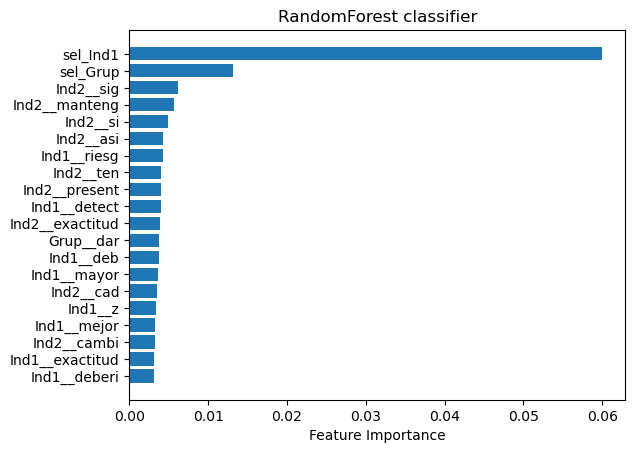

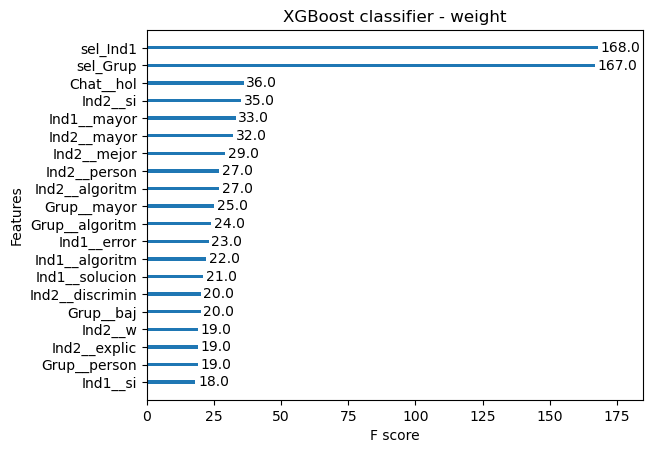

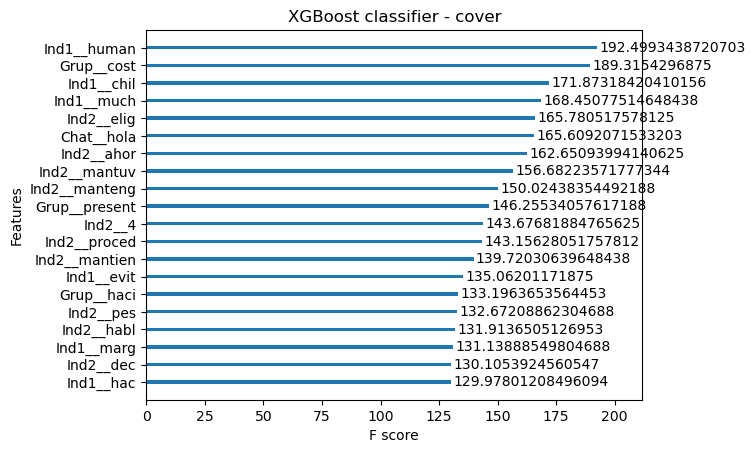

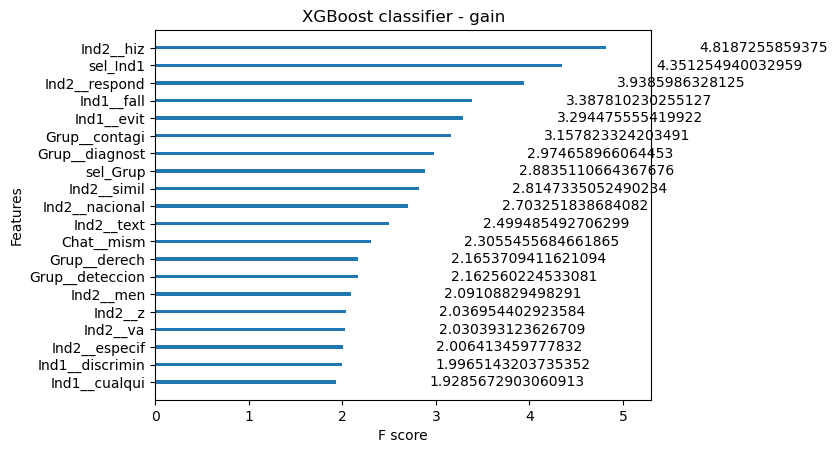

In [7]:
plot_importance_models(rf_best_model, xgb_best_model)

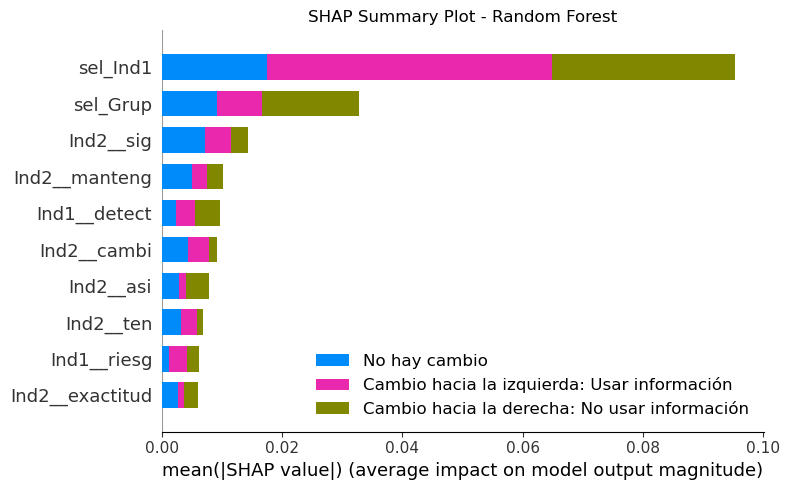

In [8]:
summary_plot(rf_best_model, df_train, 'SHAP Summary Plot - Random Forest')

[19:16:09] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\c_api\c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


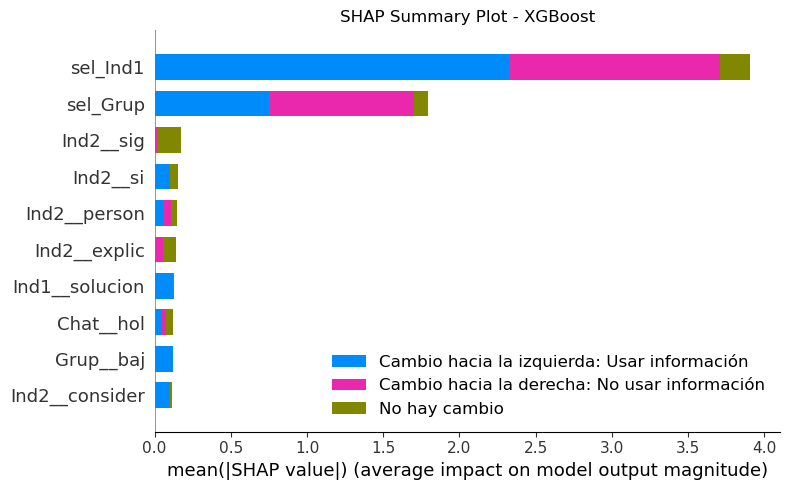

In [9]:
summary_plot(xgb_best_model, df_train, 'SHAP Summary Plot - XGBoost')

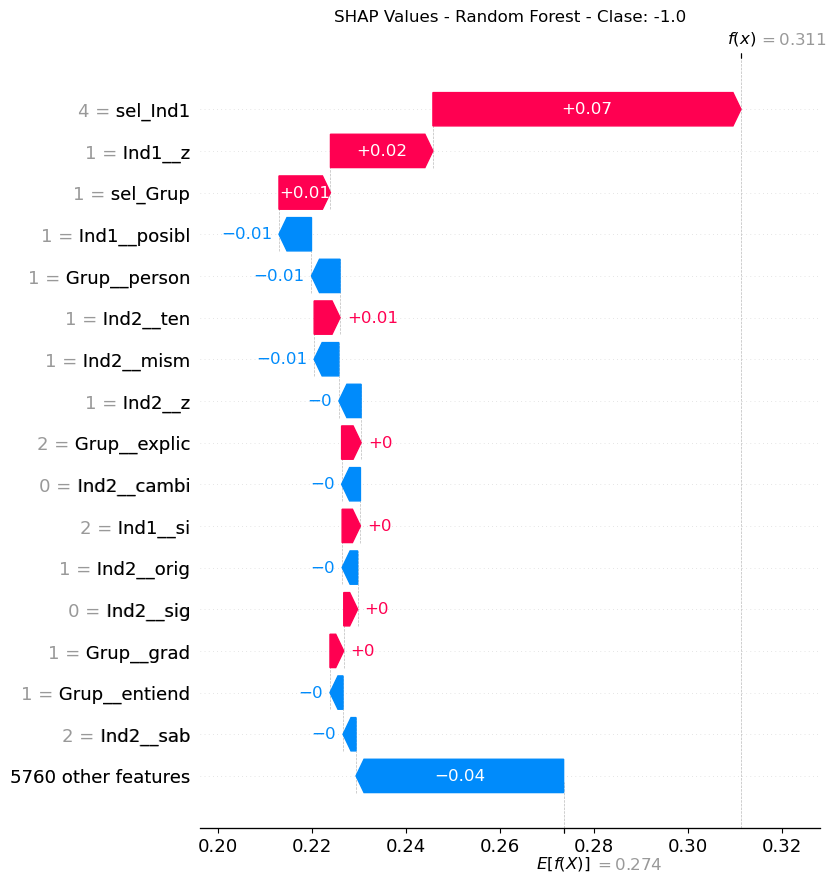

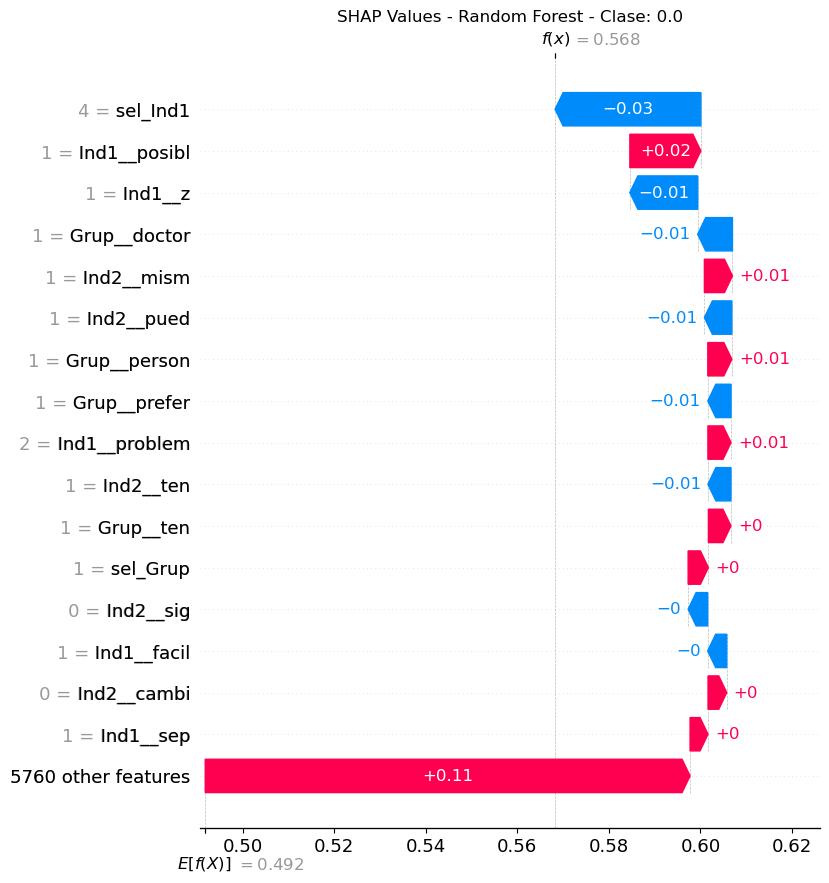

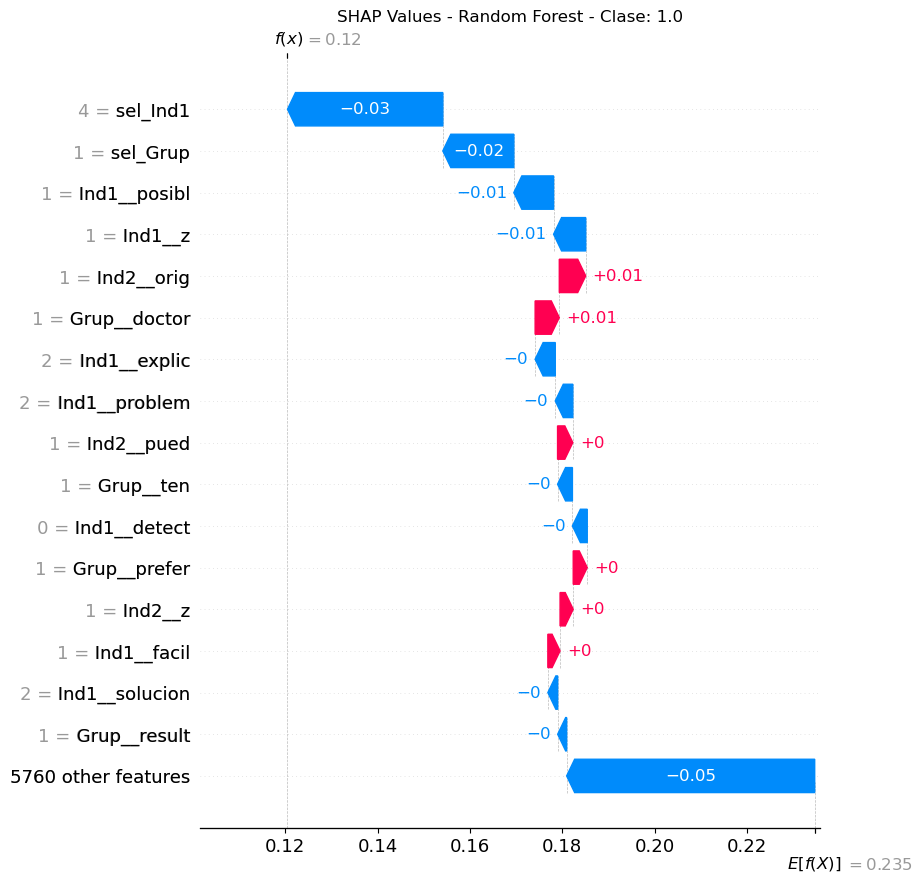

In [10]:
idx=1

individual_explanation(idx, rf_best_model, df_train, 'SHAP Values - Random Forest')

[19:16:26] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\c_api\c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


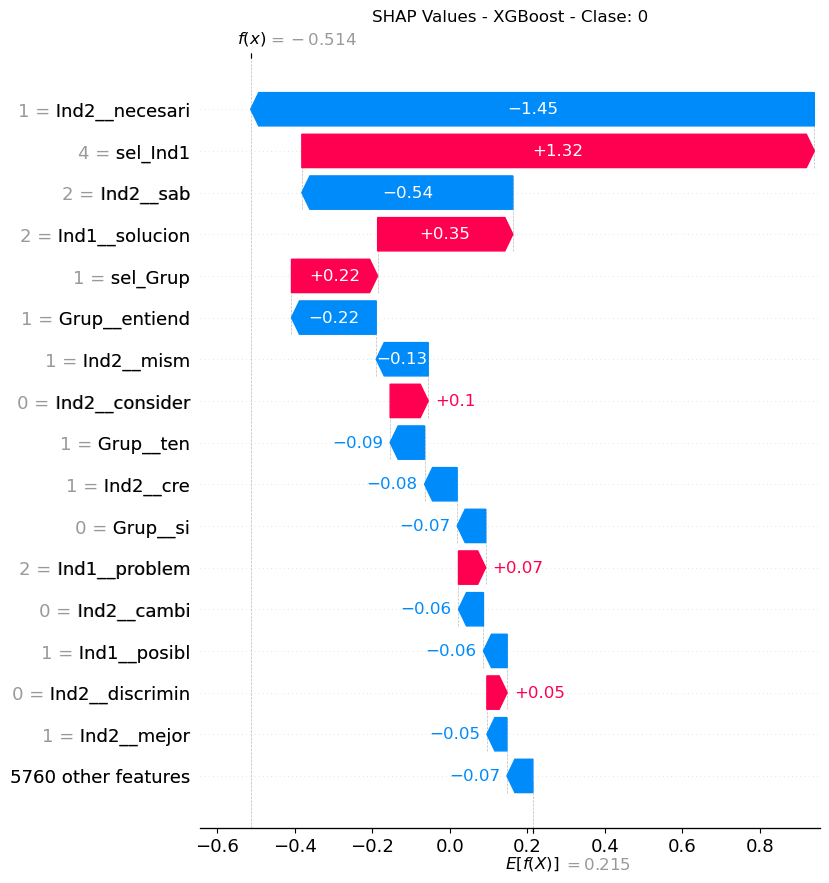

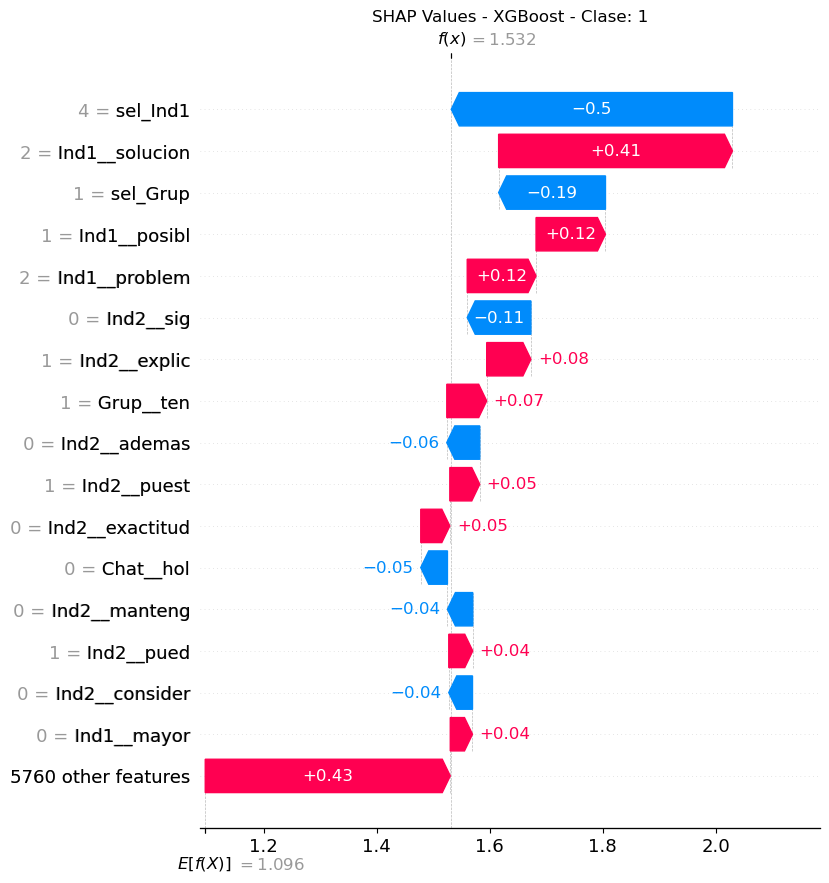

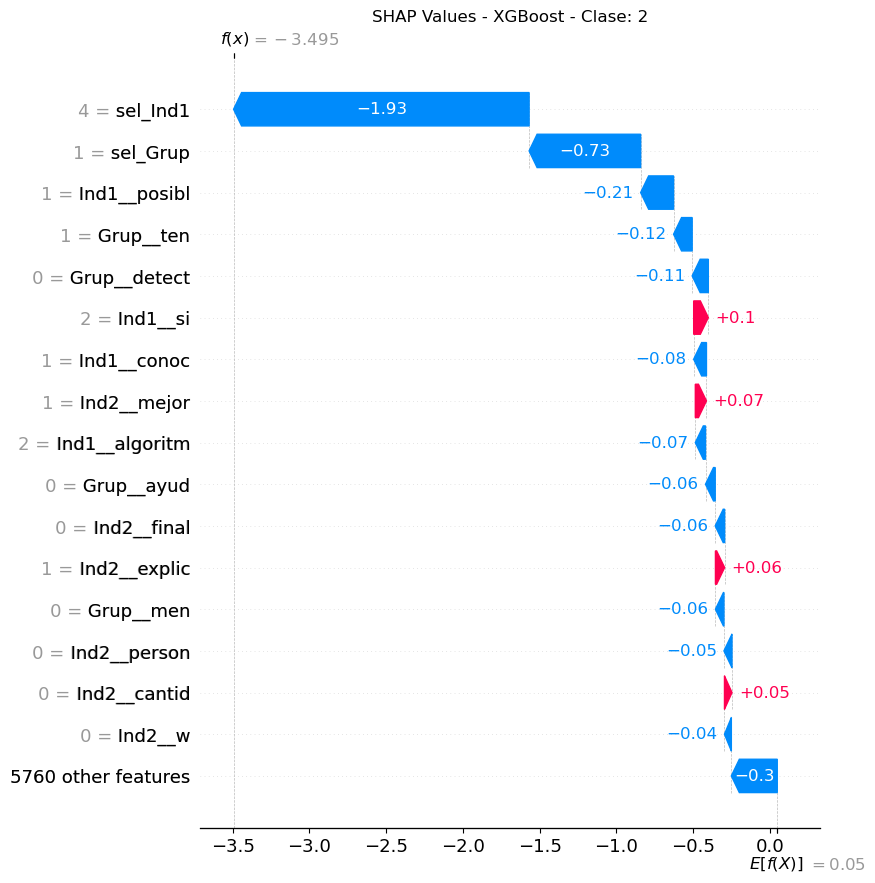

In [11]:
idx=1

individual_explanation(idx, xgb_best_model, df_train, 'SHAP Values - XGBoost')

## Modelo 2. Agregar género

In [12]:
df_train, df_test, y_train, y_test, categorical_preprocessing, text_preprocessing = preprocessing(
    dataset,
    gender=True, 
    comment_Ind2=True, 
    sel_Ind1=True
)
df_train

,sel_Ind1,sel_Grup,gender:M,gender:F,gender:O,Ind1__0si,Ind1__1,Ind1__10,Ind1__100,Ind1__100000,...,Chat__wenass,Chat__wifi,Chat__wol,Chat__x,Chat__x2,Chat__x3,Chat__xat,Chat__xd,Chat__ª,Chat__ö
572,0.0,3.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
798,4.0,1.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
596,1.0,1.0,0.0,1.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
19,0.0,1.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
905,0.0,2.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
146,2.0,2.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
389,1.0,1.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
142,2.0,2.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
476,1.0,2.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [13]:
categorical_preprocessing

ColumnTransformer(transformers=[('sel_etapa',
                                 Pipeline(steps=[('ordinal_encoder',
                                                  OrdinalEncoder())]),
                                 ['sel_Ind1', 'sel_Grup', 'sel_Ind2']),
                                ('gender',
                                 Pipeline(steps=[('extract',
                                                  ColumnExtractor(columns=['gender'])),
                                                 ('onehot_encoder',
                                                  OneHotEncoder(categories=[['M',
                                                                             'F',
                                                                             'O']],
                                                                sparse_output=False))]),
                                 ['gender'])])

In [14]:
text_preprocessing

ColumnTransformer(transformers=[('Ind1',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x00000187917B5CF0>),
                                 'comment_Ind1'),
                                ('Grup',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x00000187917B5CF0>),
                                 'comment_Grup'),
                                ('Ind2',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x00000187917B5CF0>),
                                 'comment_Ind2'),
                                ('Chat',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x00000187917B5CF0>),
                                 'summary')])

In [15]:
dummy_model, rf_best_model, xgb_best_model = train_models(df_train, df_test, y_train, y_test, grid_rf, grid_xgb)

Dummy classifier
              precision    recall  f1-score   support

        -1.0       0.00      0.00      0.00        49
         0.0       0.49      1.00      0.66        90
         1.0       0.00      0.00      0.00        43

    accuracy                           0.49       182
   macro avg       0.16      0.33      0.22       182
weighted avg       0.24      0.49      0.33       182

Random Forest classifier
Best Hyperparameters: {'max_depth': 30, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 300}
              precision    recall  f1-score   support

        -1.0       1.00      0.06      0.12        49
         0.0       0.50      1.00      0.67        90
         1.0       0.00      0.00      0.00        43

    accuracy                           0.51       182
   macro avg       0.50      0.35      0.26       182
weighted avg       0.52      0.51      0.36       182

XGBoost classifier
Best Hyperparameters: {'max_leaves': 100, 'min_child_weight': 1, 'n_e

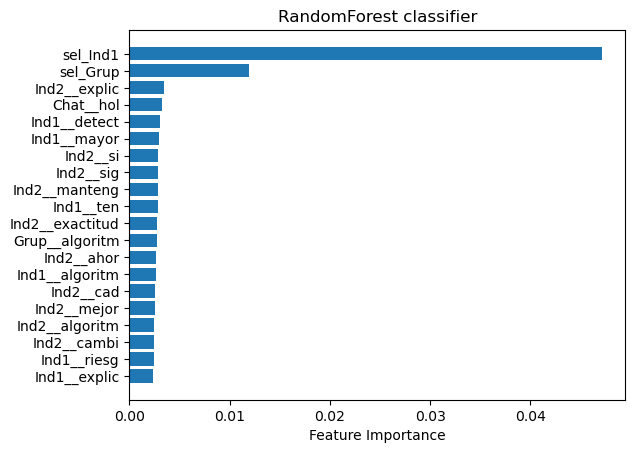

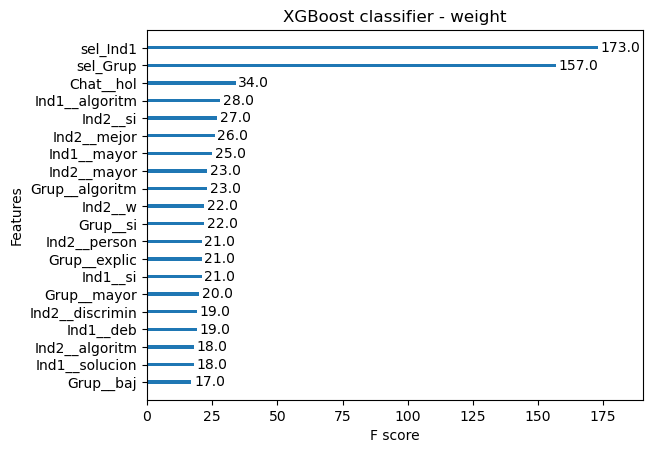

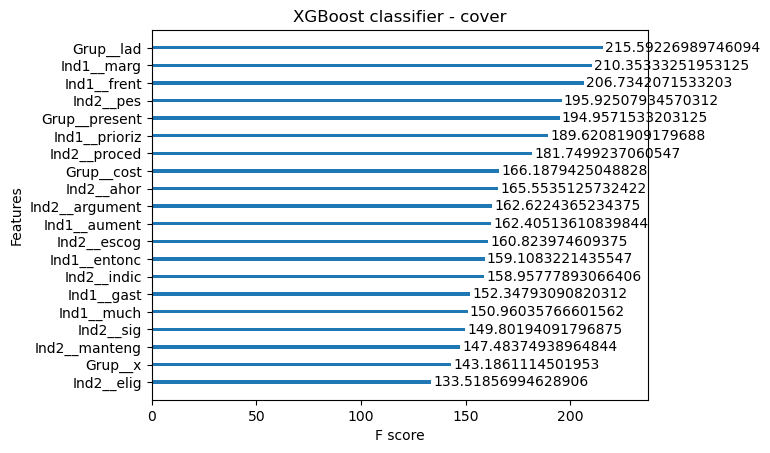

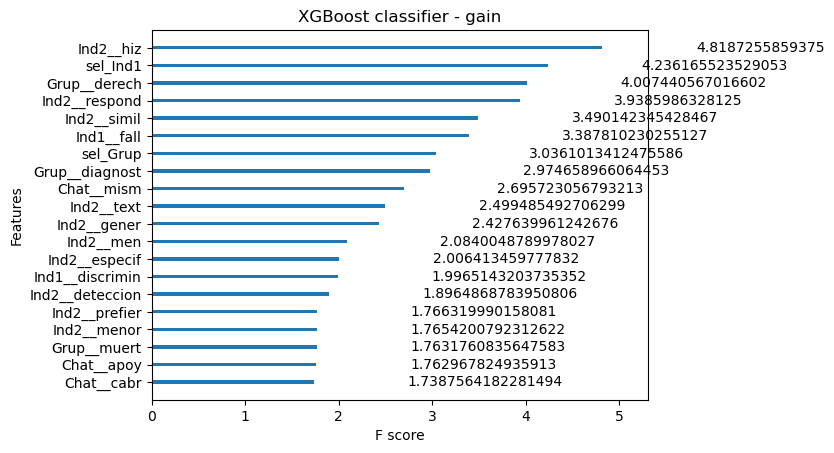

In [16]:
plot_importance_models(rf_best_model, xgb_best_model)

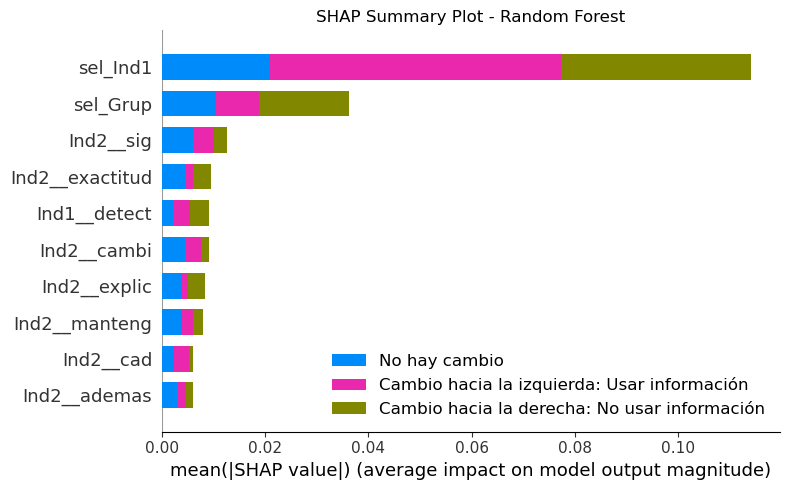

In [17]:
summary_plot(rf_best_model, df_train, 'SHAP Summary Plot - Random Forest')

[19:25:23] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\c_api\c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


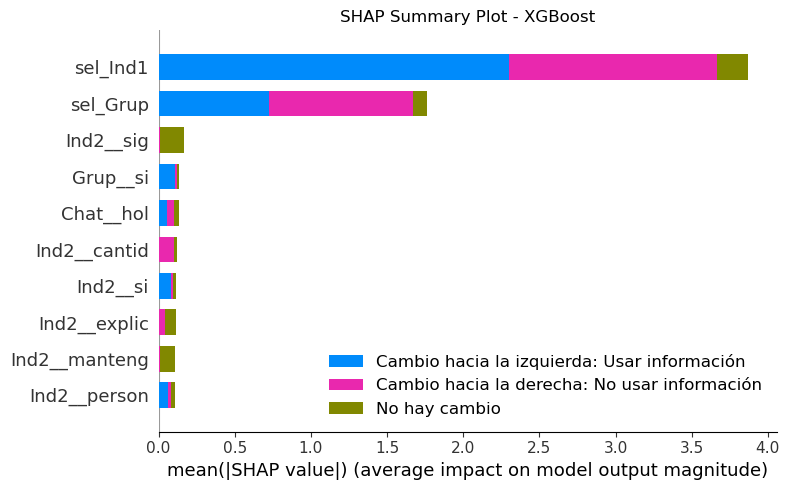

In [18]:
summary_plot(xgb_best_model, df_train, 'SHAP Summary Plot - XGBoost')

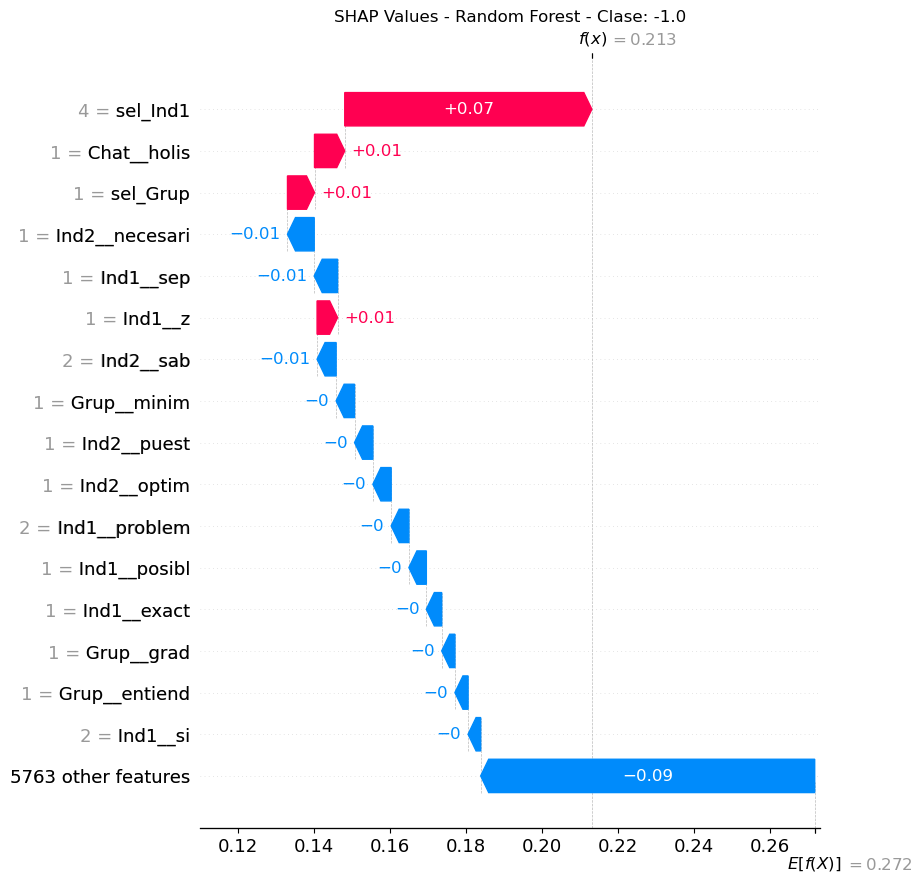

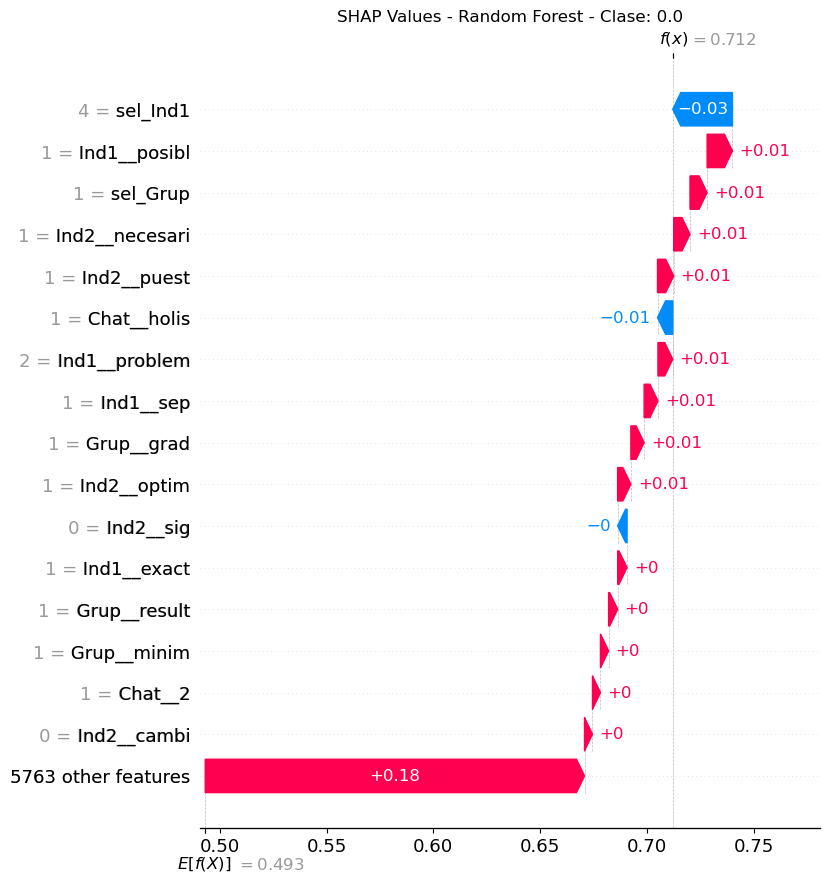

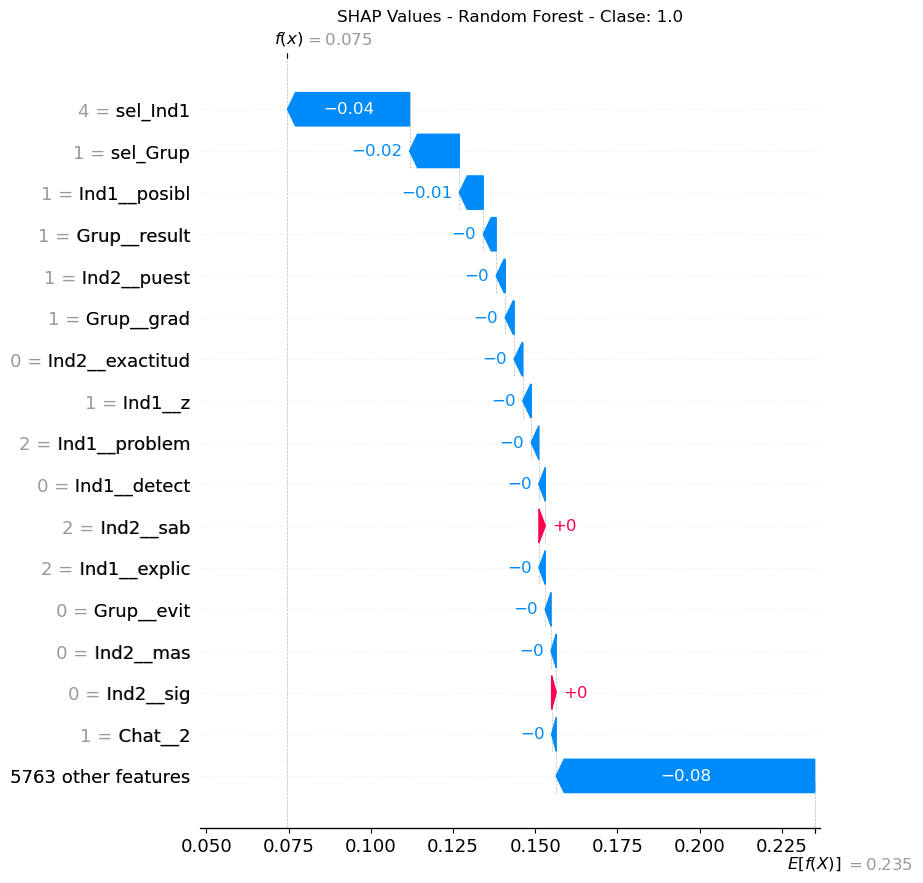

In [19]:
idx=1

individual_explanation(idx, rf_best_model, df_train, 'SHAP Values - Random Forest')

[19:26:44] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\c_api\c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


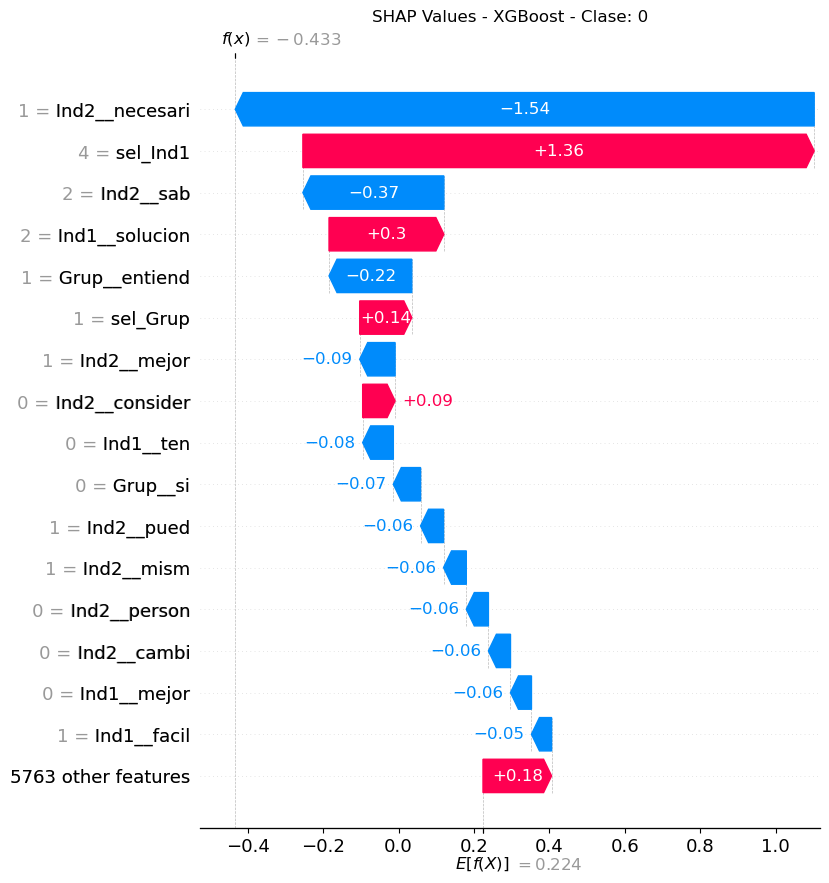

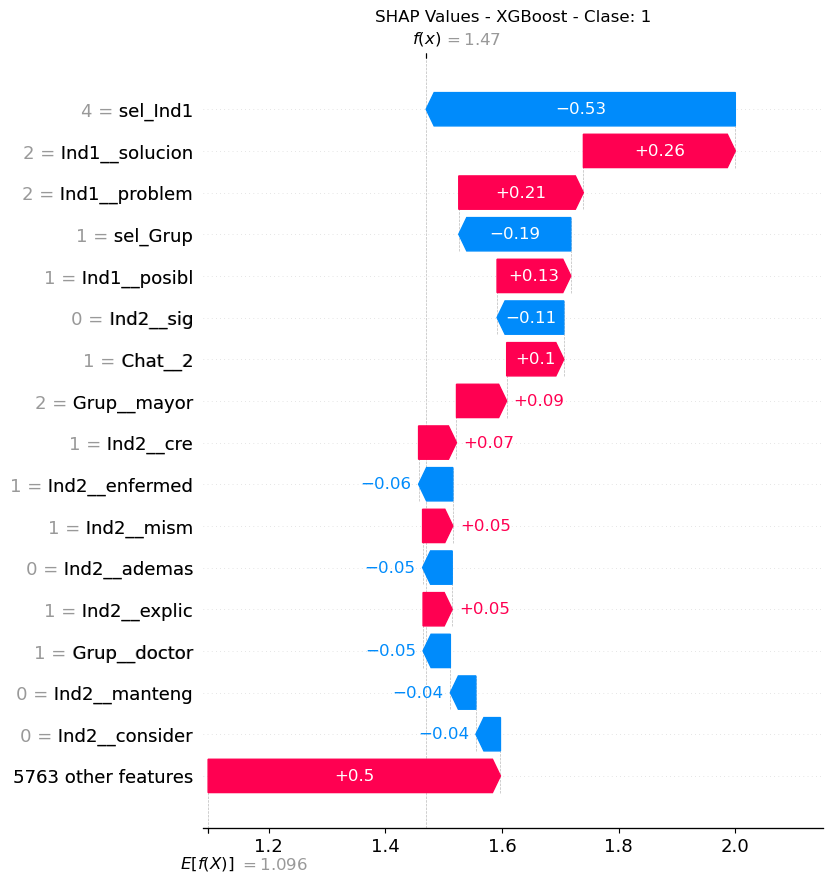

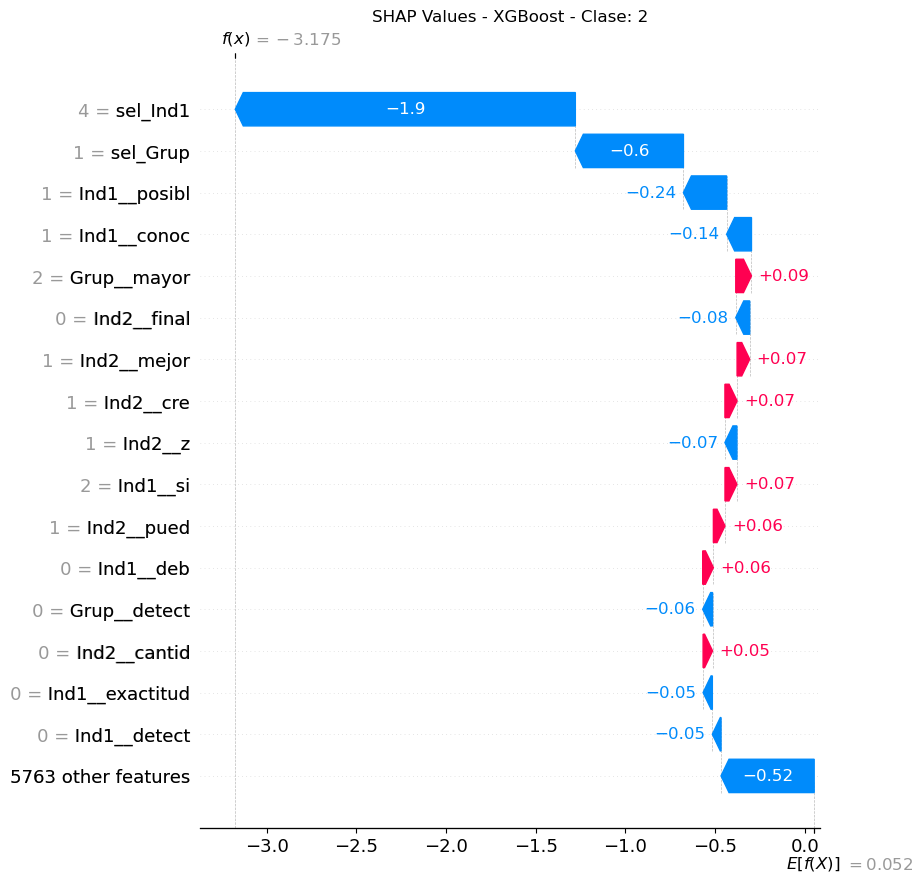

In [20]:
idx=1

individual_explanation(idx, xgb_best_model, df_train, 'SHAP Values - XGBoost')

## Modelo 3. Quitar selección 1

In [21]:
df_train, df_test, y_train, y_test, categorical_preprocessing, text_preprocessing = preprocessing(
    dataset,
    gender=True, 
    comment_Ind2=True, 
    sel_Ind1=False
)
df_train

,sel_Grup,gender:M,gender:F,gender:O,Ind1__0si,Ind1__1,Ind1__10,Ind1__100,Ind1__100000,Ind1__15,...,Chat__wenass,Chat__wifi,Chat__wol,Chat__x,Chat__x2,Chat__x3,Chat__xat,Chat__xd,Chat__ª,Chat__ö
572,3.0,1.0,0.0,0.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
798,1.0,1.0,0.0,0.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
596,1.0,0.0,1.0,0.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
19,1.0,1.0,0.0,0.0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
905,2.0,1.0,0.0,0.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
146,2.0,1.0,0.0,0.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
389,1.0,1.0,0.0,0.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
142,2.0,1.0,0.0,0.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
476,2.0,1.0,0.0,0.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [22]:
categorical_preprocessing

ColumnTransformer(transformers=[('sel_etapa',
                                 Pipeline(steps=[('ordinal_encoder',
                                                  OrdinalEncoder())]),
                                 ['sel_Ind1', 'sel_Grup', 'sel_Ind2']),
                                ('gender',
                                 Pipeline(steps=[('extract',
                                                  ColumnExtractor(columns=['gender'])),
                                                 ('onehot_encoder',
                                                  OneHotEncoder(categories=[['M',
                                                                             'F',
                                                                             'O']],
                                                                sparse_output=False))]),
                                 ['gender'])])

In [23]:
text_preprocessing

ColumnTransformer(transformers=[('Ind1',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x0000018792999450>),
                                 'comment_Ind1'),
                                ('Grup',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x0000018792999450>),
                                 'comment_Grup'),
                                ('Ind2',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x0000018792999450>),
                                 'comment_Ind2'),
                                ('Chat',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x0000018792999450>),
                                 'summary')])

In [24]:
dummy_model, rf_best_model, xgb_best_model = train_models(df_train, df_test, y_train, y_test, grid_rf, grid_xgb)

Dummy classifier
              precision    recall  f1-score   support

        -1.0       0.00      0.00      0.00        49
         0.0       0.49      1.00      0.66        90
         1.0       0.00      0.00      0.00        43

    accuracy                           0.49       182
   macro avg       0.16      0.33      0.22       182
weighted avg       0.24      0.49      0.33       182

Random Forest classifier
Best Hyperparameters: {'max_depth': 30, 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 200}
              precision    recall  f1-score   support

        -1.0       0.00      0.00      0.00        49
         0.0       0.49      1.00      0.66        90
         1.0       0.00      0.00      0.00        43

    accuracy                           0.49       182
   macro avg       0.16      0.33      0.22       182
weighted avg       0.24      0.49      0.33       182

XGBoost classifier
Best Hyperparameters: {'max_leaves': 5, 'min_child_weight': 1, 'n_es

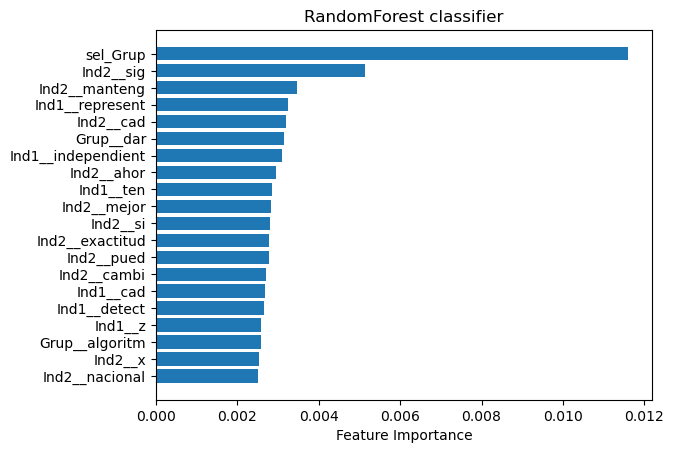

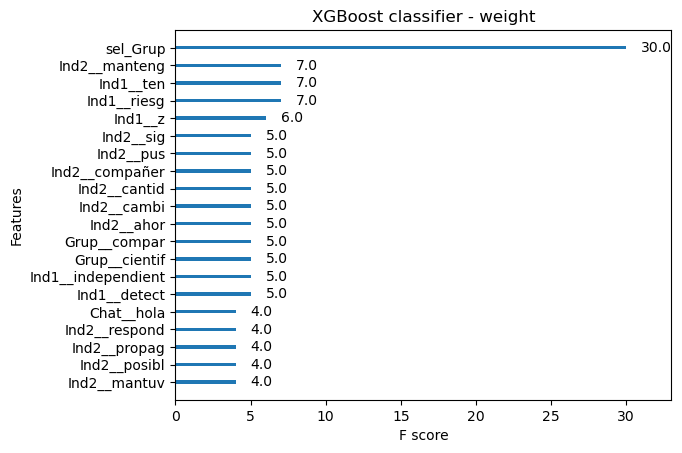

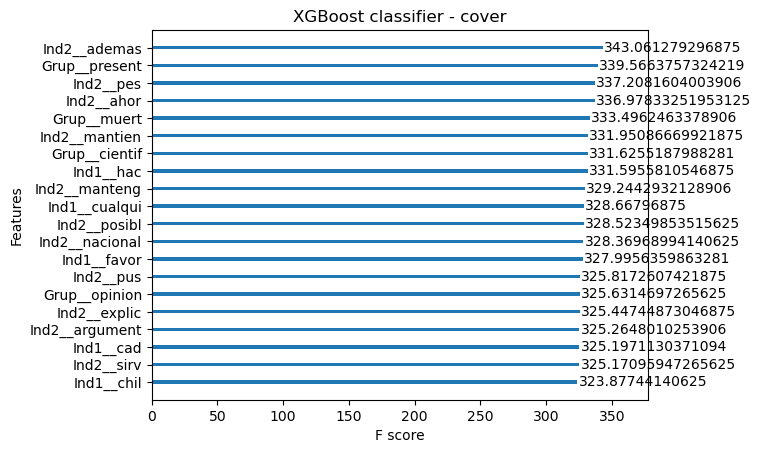

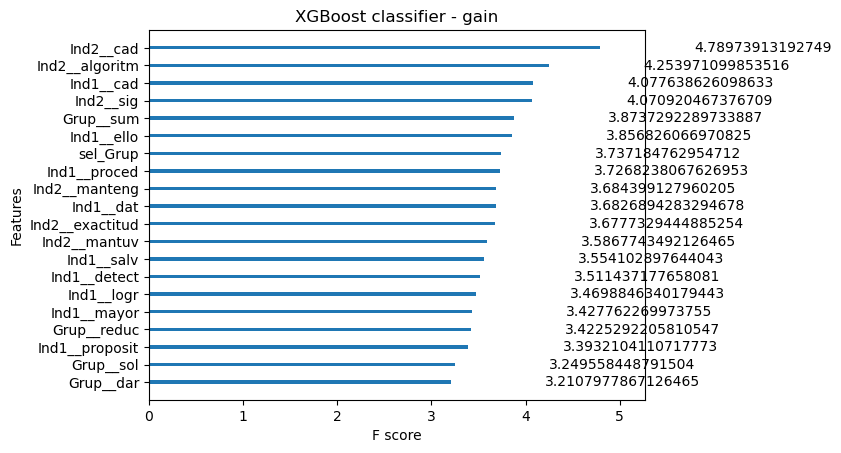

In [25]:
plot_importance_models(rf_best_model, xgb_best_model)

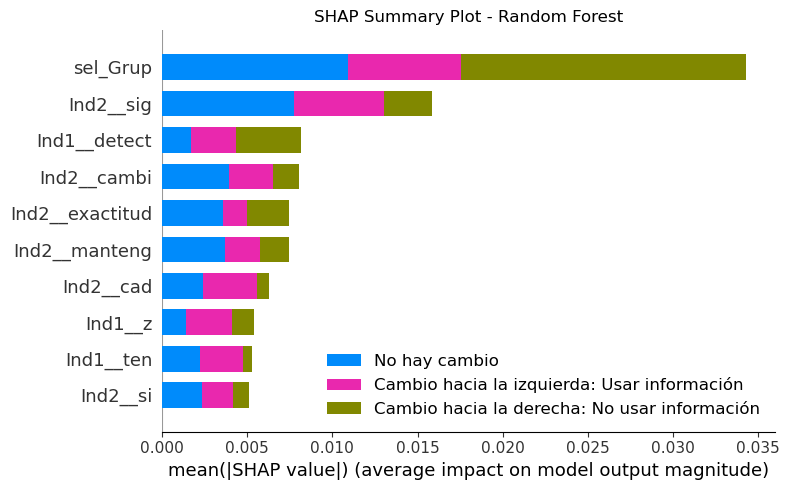

In [26]:
summary_plot(rf_best_model, df_train, 'SHAP Summary Plot - Random Forest')

[19:34:25] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\c_api\c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


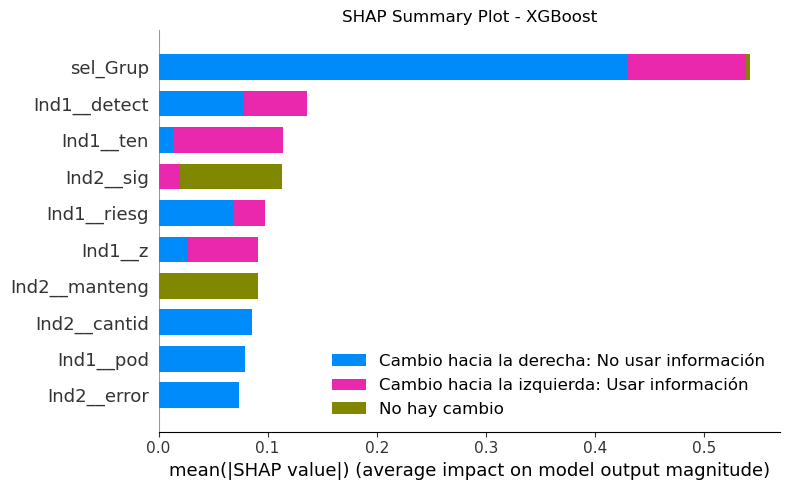

In [27]:
summary_plot(xgb_best_model, df_train, 'SHAP Summary Plot - XGBoost')

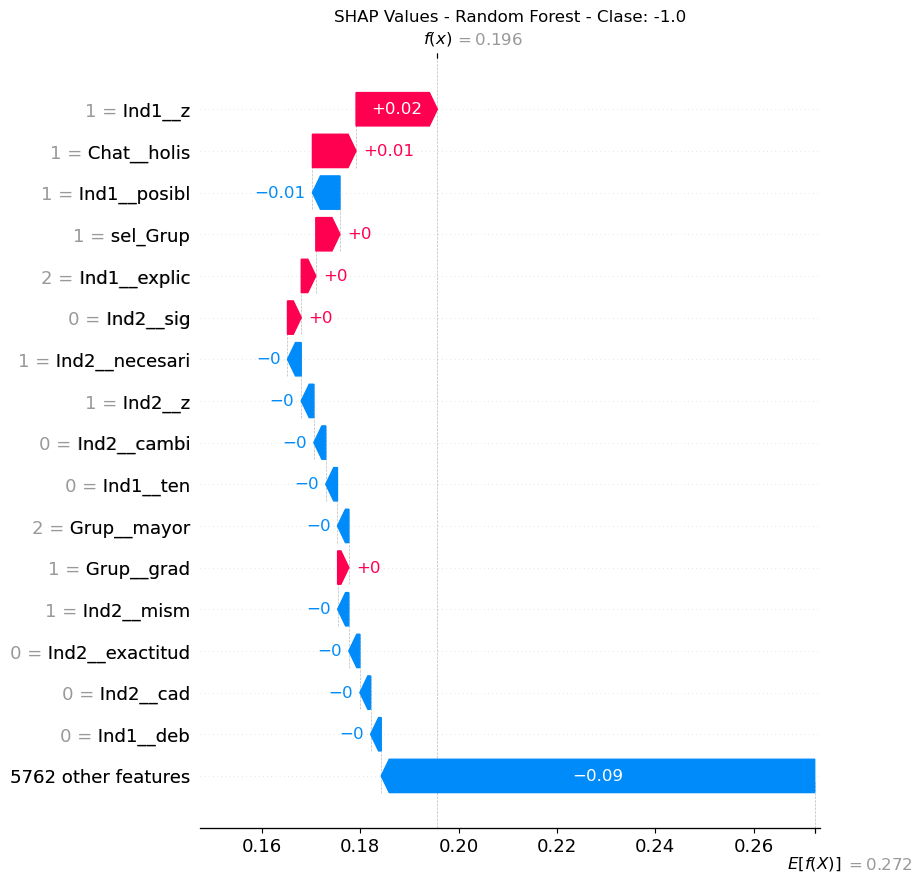

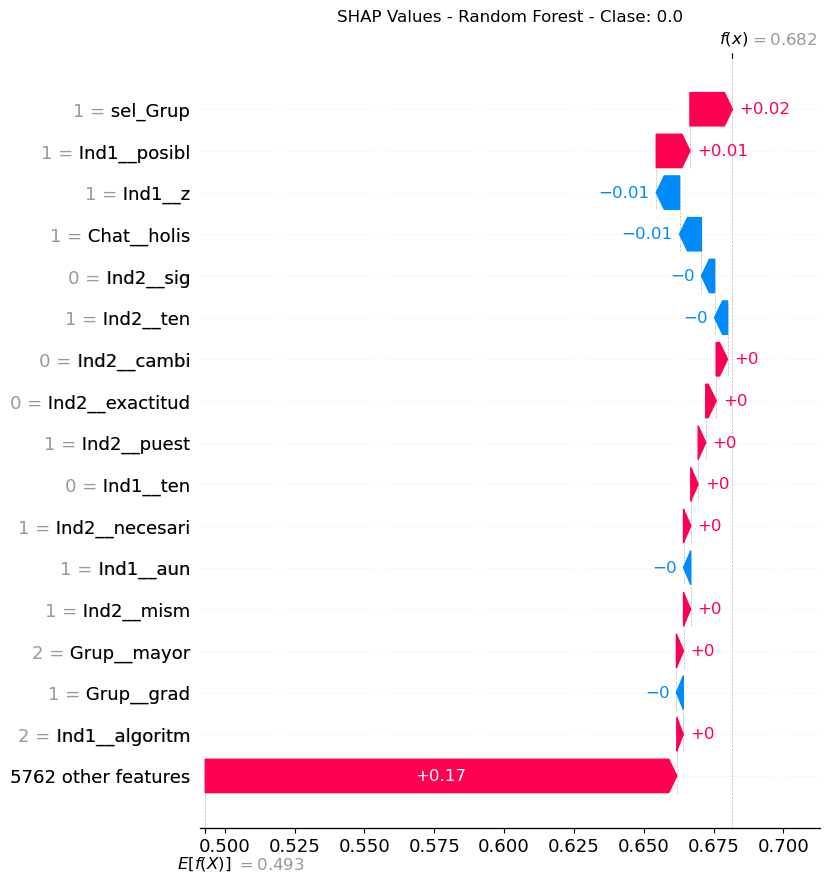

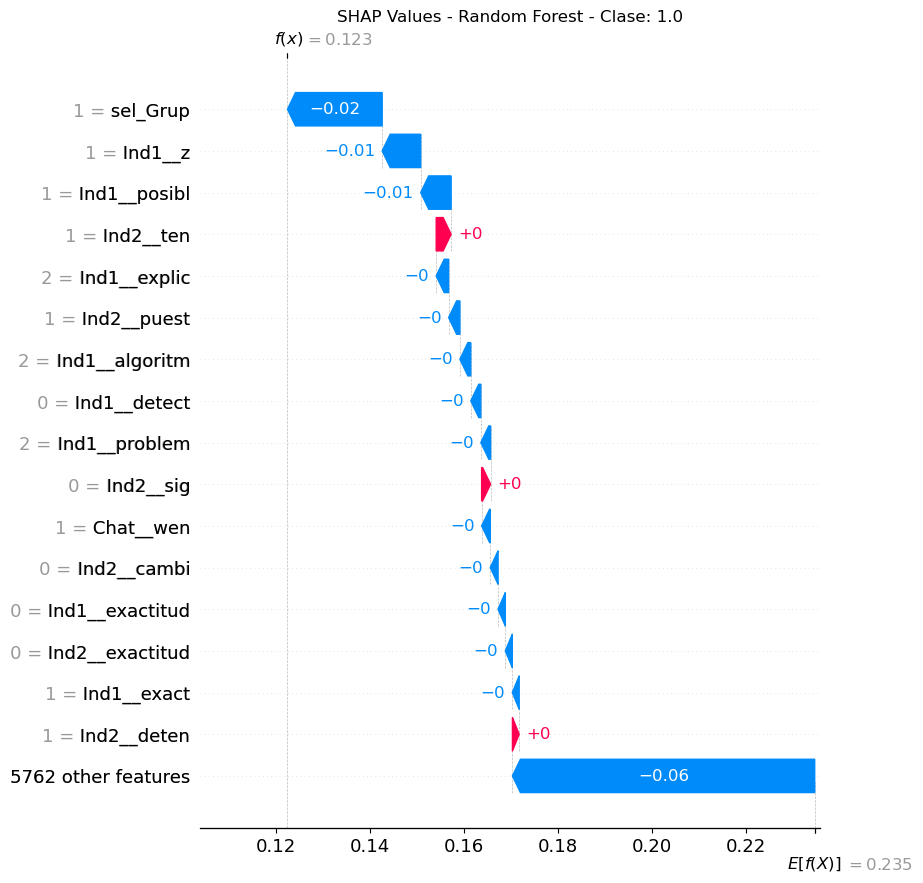

In [28]:
idx=1

individual_explanation(idx, rf_best_model, df_train, 'SHAP Values - Random Forest')

[19:34:59] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\c_api\c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


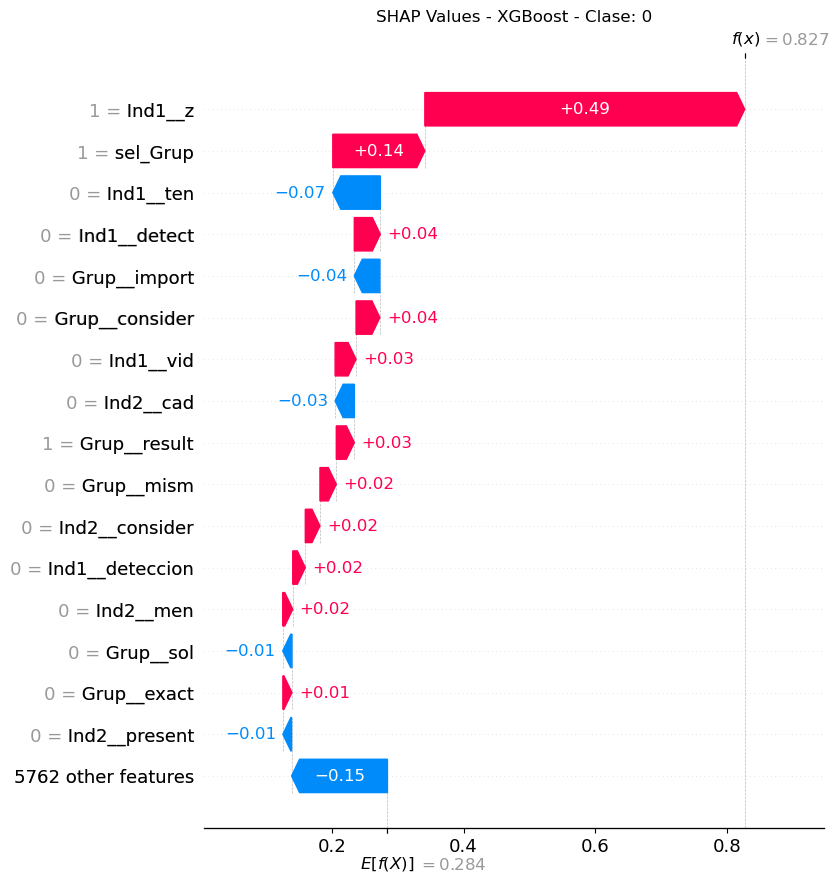

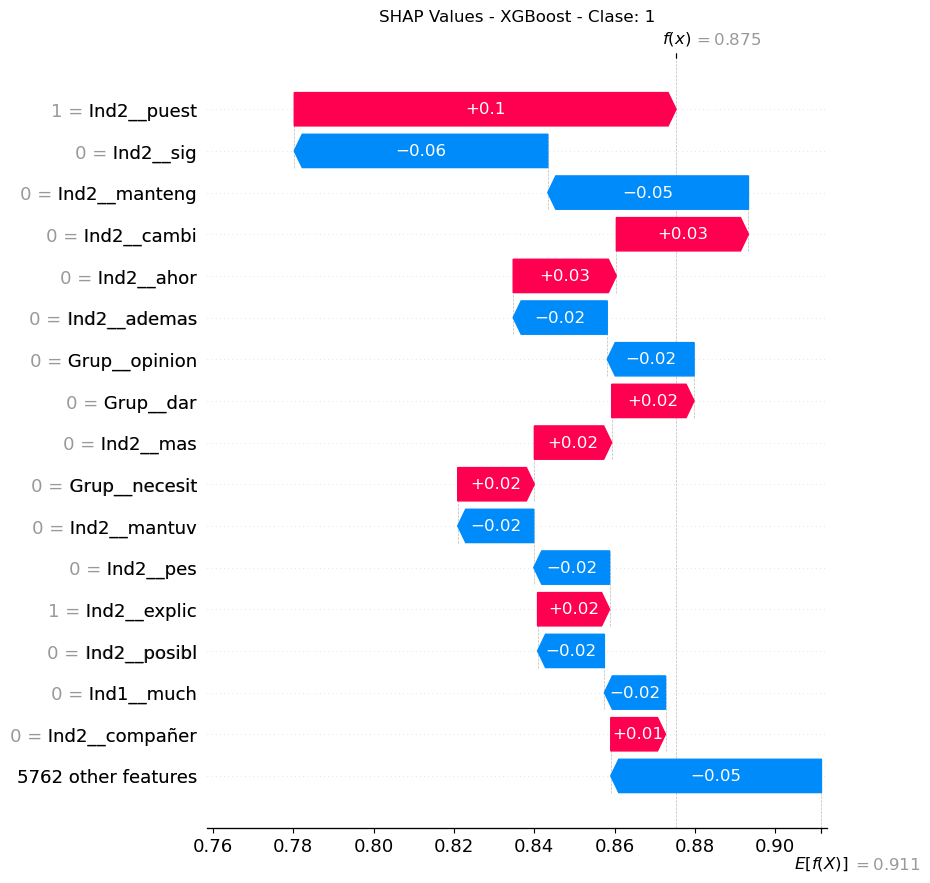

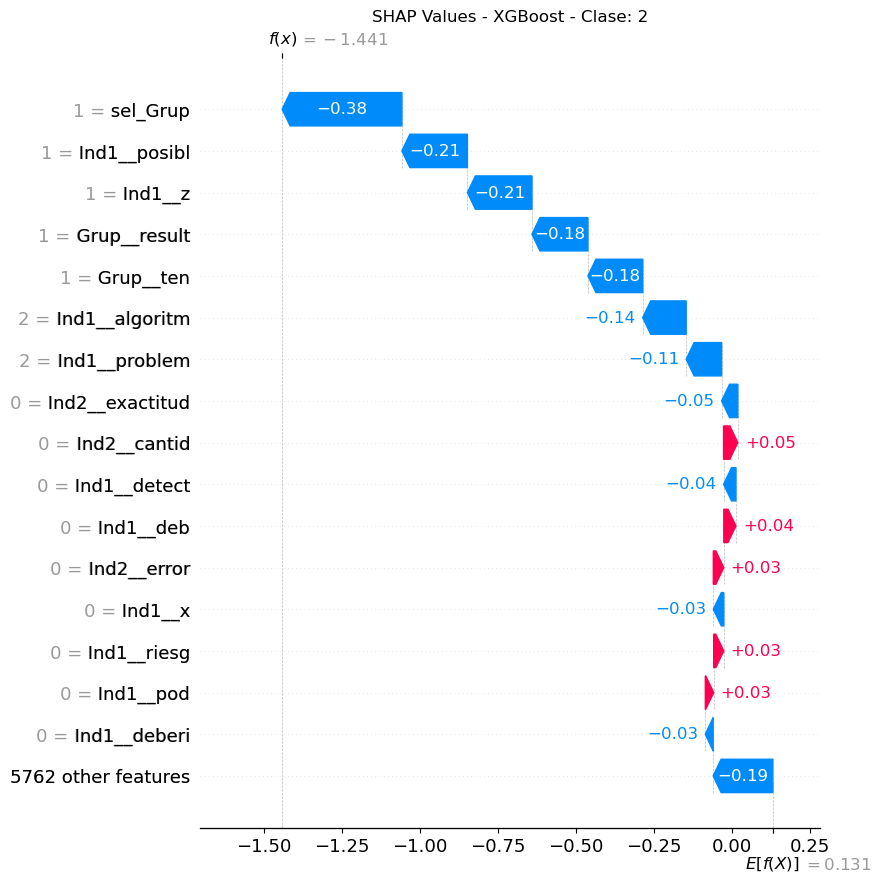

In [29]:
idx=1

individual_explanation(idx, xgb_best_model, df_train, 'SHAP Values - XGBoost')

## Modelo 4. Quitar justificación individual 2

In [30]:
df_train, df_test, y_train, y_test, categorical_preprocessing, text_preprocessing = preprocessing(
    dataset,
    gender=True, 
    comment_Ind2=False, 
    sel_Ind1=True
)
df_train

,sel_Ind1,sel_Grup,gender:M,gender:F,gender:O,Ind1__0si,Ind1__1,Ind1__10,Ind1__100,Ind1__100000,...,Chat__wenass,Chat__wifi,Chat__wol,Chat__x,Chat__x2,Chat__x3,Chat__xat,Chat__xd,Chat__ª,Chat__ö
572,0.0,3.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
798,4.0,1.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
596,1.0,1.0,0.0,1.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
19,0.0,1.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
905,0.0,2.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
146,2.0,2.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
389,1.0,1.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
142,2.0,2.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
476,1.0,2.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [31]:
categorical_preprocessing

ColumnTransformer(transformers=[('sel_etapa',
                                 Pipeline(steps=[('ordinal_encoder',
                                                  OrdinalEncoder())]),
                                 ['sel_Ind1', 'sel_Grup', 'sel_Ind2']),
                                ('gender',
                                 Pipeline(steps=[('extract',
                                                  ColumnExtractor(columns=['gender'])),
                                                 ('onehot_encoder',
                                                  OneHotEncoder(categories=[['M',
                                                                             'F',
                                                                             'O']],
                                                                sparse_output=False))]),
                                 ['gender'])])

In [32]:
text_preprocessing

ColumnTransformer(transformers=[('Ind1',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x0000018790ED60E0>),
                                 'comment_Ind1'),
                                ('Grup',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x0000018790ED60E0>),
                                 'comment_Grup'),
                                ('Chat',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x0000018790ED60E0>),
                                 'summary')])

In [33]:
dummy_model, rf_best_model, xgb_best_model = train_models(df_train, df_test, y_train, y_test, grid_rf, grid_xgb)

Dummy classifier
              precision    recall  f1-score   support

        -1.0       0.00      0.00      0.00        49
         0.0       0.49      1.00      0.66        90
         1.0       0.00      0.00      0.00        43

    accuracy                           0.49       182
   macro avg       0.16      0.33      0.22       182
weighted avg       0.24      0.49      0.33       182

Random Forest classifier
Best Hyperparameters: {'max_depth': 30, 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 100}
              precision    recall  f1-score   support

        -1.0       0.71      0.10      0.18        49
         0.0       0.51      0.98      0.67        90
         1.0       1.00      0.02      0.05        43

    accuracy                           0.52       182
   macro avg       0.74      0.37      0.30       182
weighted avg       0.68      0.52      0.39       182

XGBoost classifier
Best Hyperparameters: {'max_leaves': 5, 'min_child_weight': 1, 'n_es

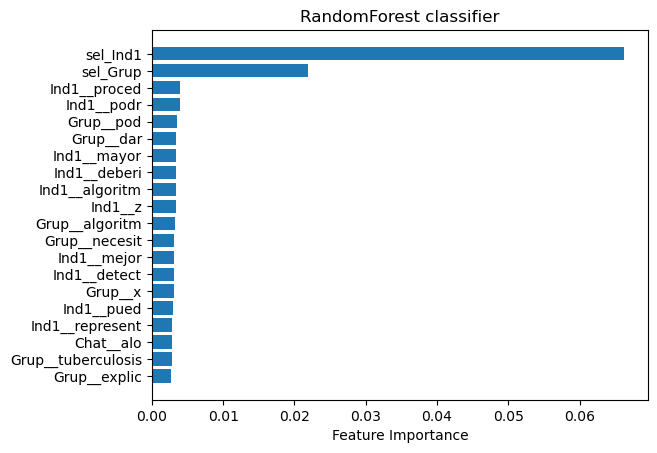

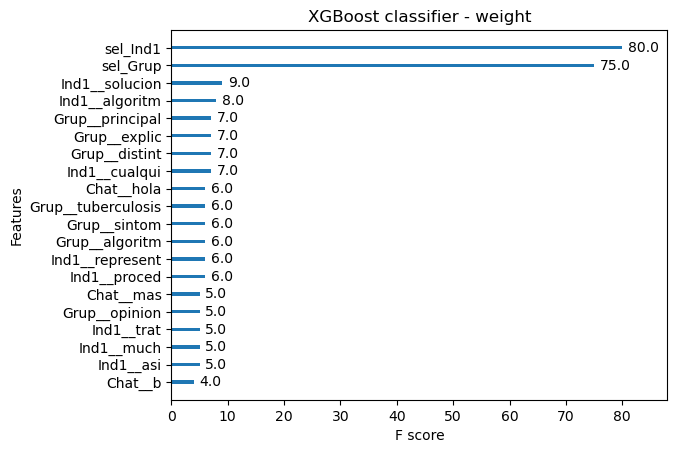

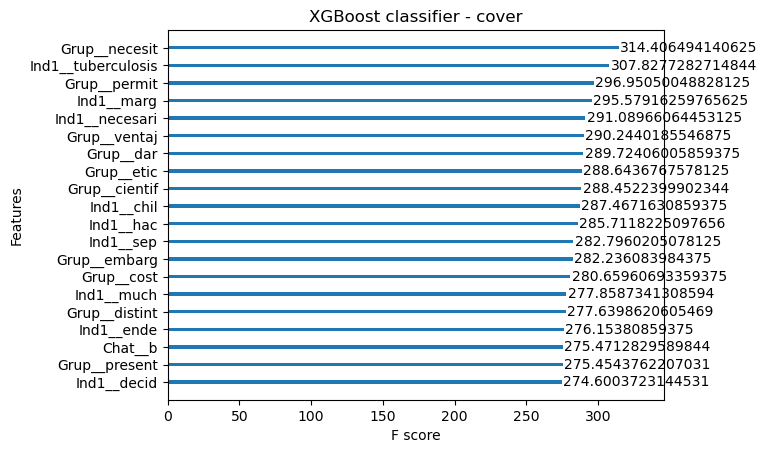

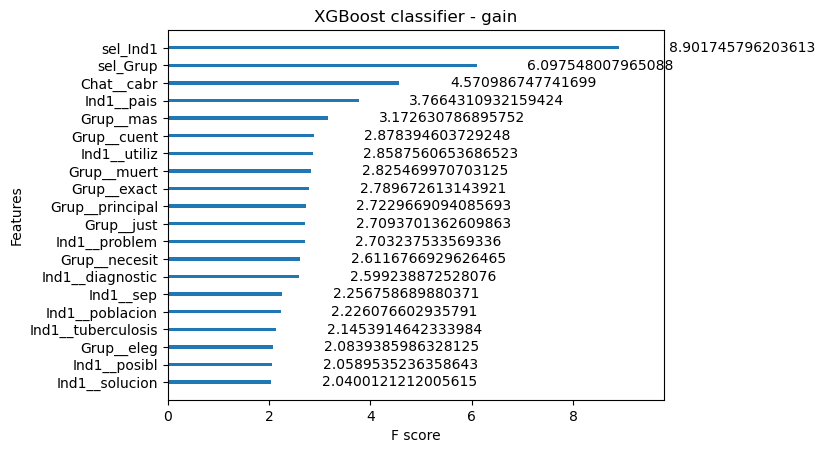

In [34]:
plot_importance_models(rf_best_model, xgb_best_model)

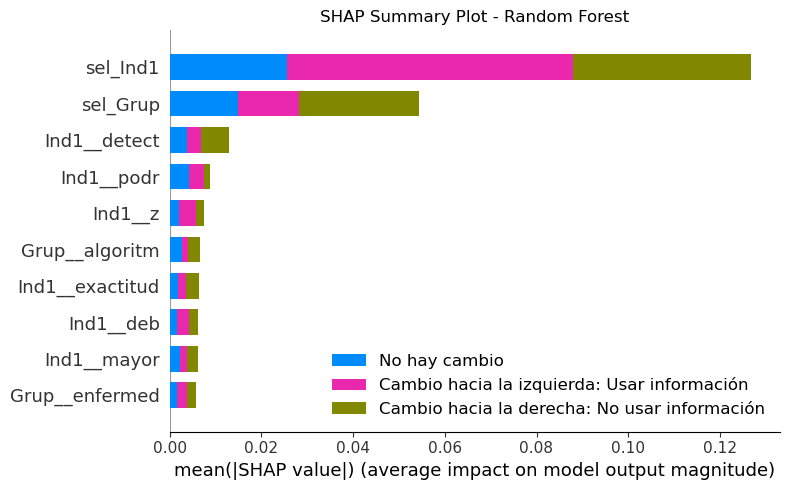

In [35]:
summary_plot(rf_best_model, df_train, 'SHAP Summary Plot - Random Forest')

[19:40:34] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\c_api\c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


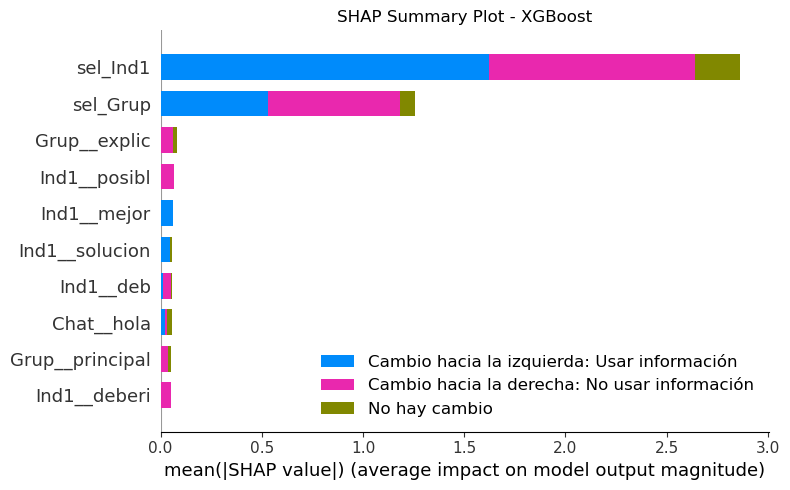

In [36]:
summary_plot(xgb_best_model, df_train, 'SHAP Summary Plot - XGBoost')

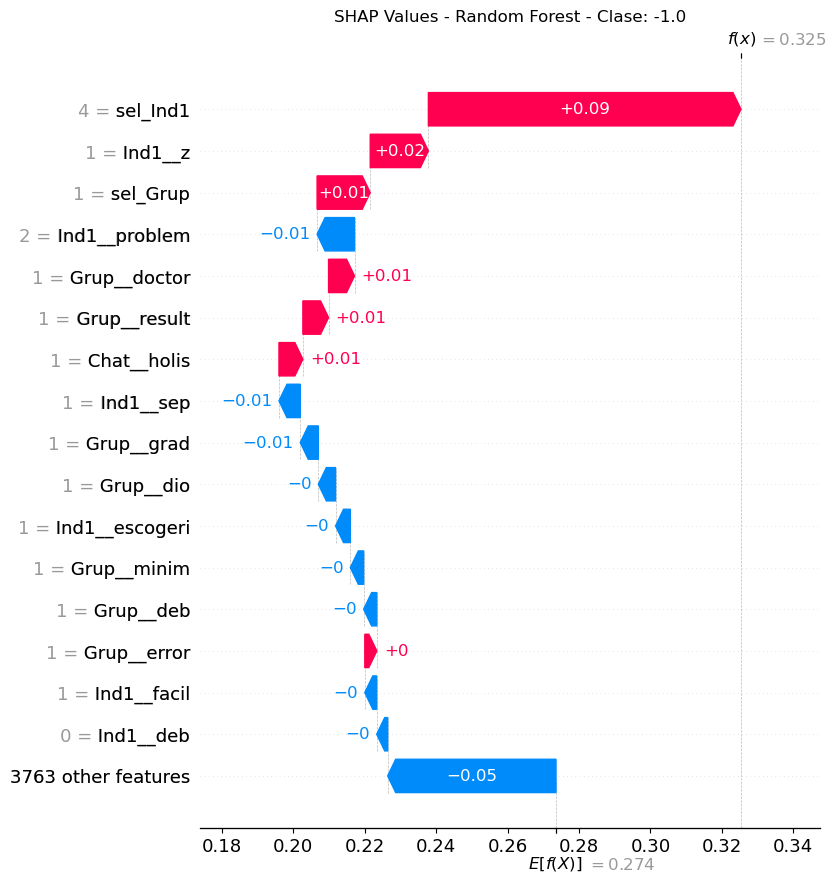

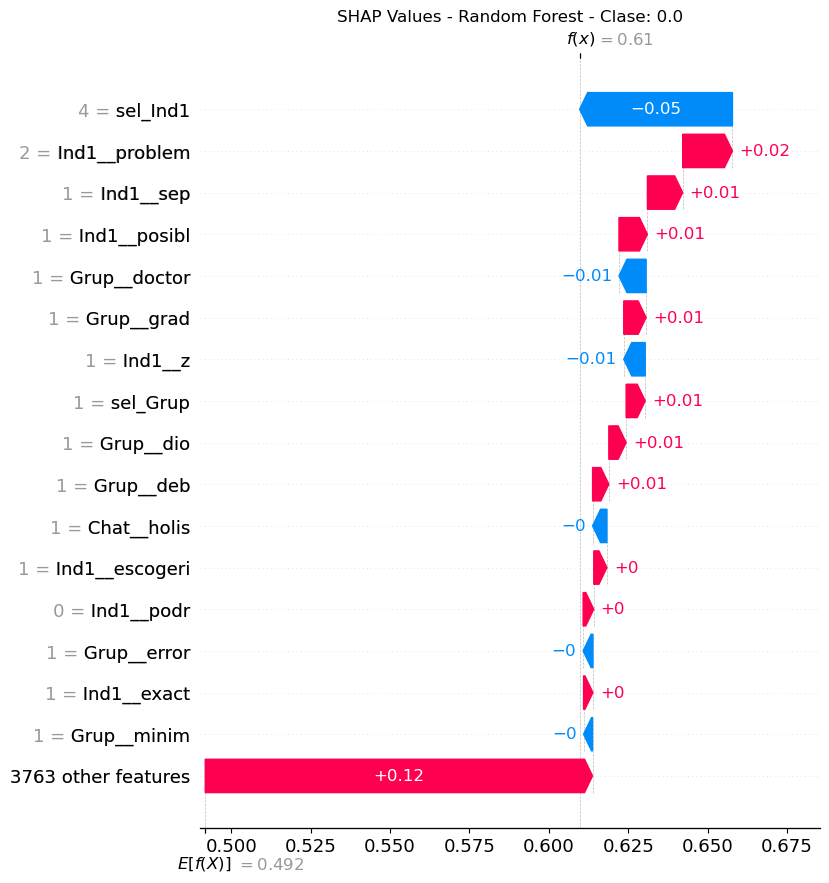

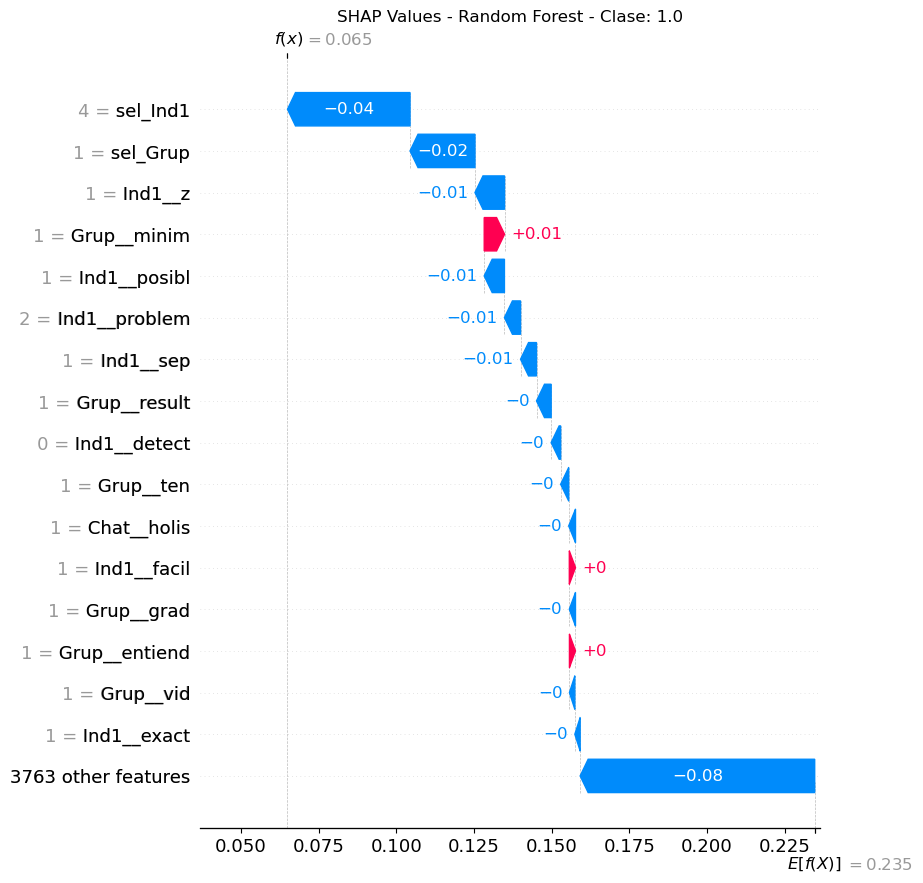

In [37]:
idx=1

individual_explanation(idx, rf_best_model, df_train, 'SHAP Values - Random Forest')

[19:40:54] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\c_api\c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


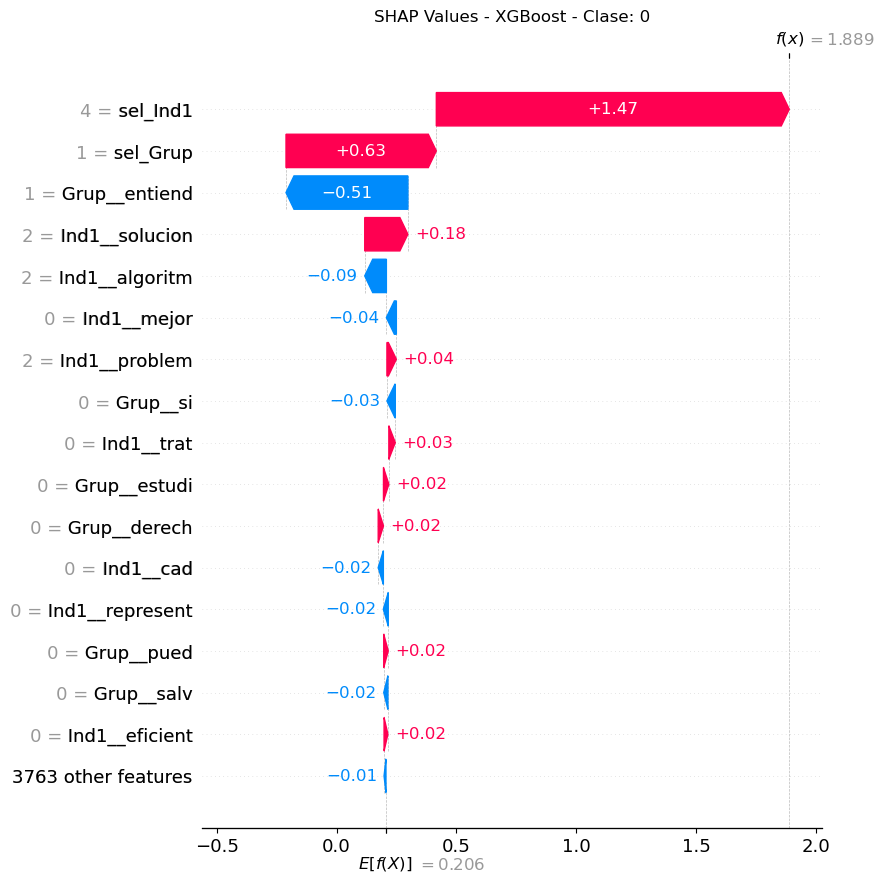

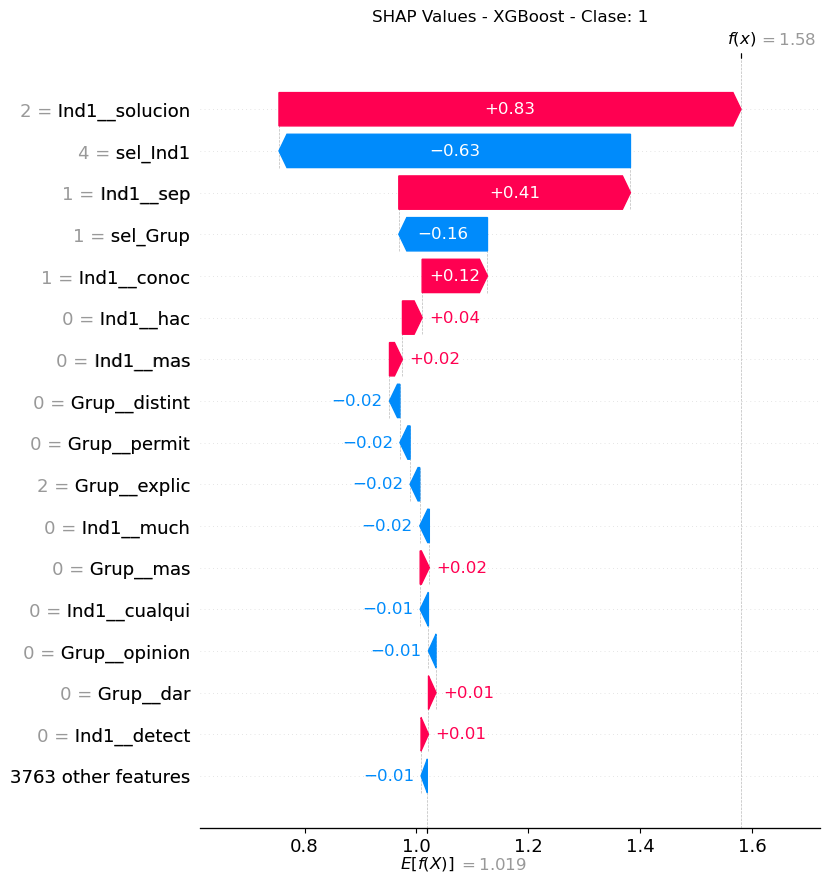

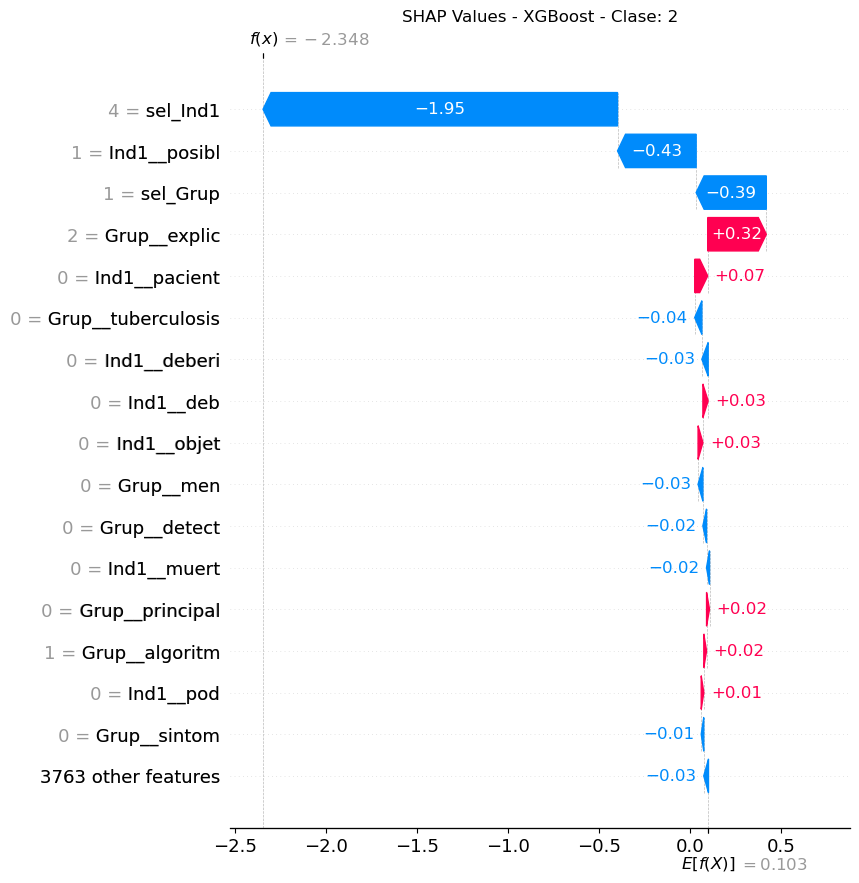

In [38]:
idx=1

individual_explanation(idx, xgb_best_model, df_train, 'SHAP Values - XGBoost')

# Diferencial 1

In [39]:
dataset = pd.read_csv(f'dataset_{caso}_1.csv')

## Modelo base

In [40]:
df_train, df_test, y_train, y_test, categorical_preprocessing, text_preprocessing = preprocessing(
    dataset,
    gender=False, 
    comment_Ind2=True, 
    sel_Ind1=True
)
df_train

,sel_Ind1,sel_Grup,Ind1__0si,Ind1__1,Ind1__100,Ind1__15,Ind1__155,Ind1__2,Ind1__3,Ind1__39,...,Chat__wenap,Chat__wenass,Chat__wifi,Chat__wol,Chat__x,Chat__x2,Chat__x3,Chat__xat,Chat__xd,Chat__ª
180,1.0,1.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
201,0.0,3.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
174,1.0,1.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
195,2.0,1.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
187,1.0,0.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
155,1.0,2.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
102,1.0,4.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
189,2.0,3.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
239,1.0,2.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [41]:
categorical_preprocessing

ColumnTransformer(transformers=[('sel_etapa',
                                 Pipeline(steps=[('ordinal_encoder',
                                                  OrdinalEncoder())]),
                                 ['sel_Ind1', 'sel_Grup', 'sel_Ind2'])])

In [42]:
text_preprocessing

ColumnTransformer(transformers=[('Ind1',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x0000018792C07340>),
                                 'comment_Ind1'),
                                ('Grup',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x0000018792C07340>),
                                 'comment_Grup'),
                                ('Ind2',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x0000018792C07340>),
                                 'comment_Ind2'),
                                ('Chat',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x0000018792C07340>),
                                 'summary')])

In [43]:
df_train

,sel_Ind1,sel_Grup,Ind1__0si,Ind1__1,Ind1__100,Ind1__15,Ind1__155,Ind1__2,Ind1__3,Ind1__39,...,Chat__wenap,Chat__wenass,Chat__wifi,Chat__wol,Chat__x,Chat__x2,Chat__x3,Chat__xat,Chat__xd,Chat__ª
180,1.0,1.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
201,0.0,3.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
174,1.0,1.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
195,2.0,1.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
187,1.0,0.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
155,1.0,2.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
102,1.0,4.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
189,2.0,3.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
239,1.0,2.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [44]:
dummy_model, rf_best_model, xgb_best_model = train_models(df_train, df_test, y_train, y_test, grid_rf, grid_xgb)

Dummy classifier
              precision    recall  f1-score   support

        -1.0       0.00      0.00      0.00        22
         0.0       0.53      1.00      0.69        44
         1.0       0.00      0.00      0.00        17

    accuracy                           0.53        83
   macro avg       0.18      0.33      0.23        83
weighted avg       0.28      0.53      0.37        83

Random Forest classifier
Best Hyperparameters: {'max_depth': 30, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
              precision    recall  f1-score   support

        -1.0       0.33      0.05      0.08        22
         0.0       0.53      0.95      0.68        44
         1.0       1.00      0.06      0.11        17

    accuracy                           0.53        83
   macro avg       0.62      0.35      0.29        83
weighted avg       0.58      0.53      0.41        83

XGBoost classifier
Best Hyperparameters: {'max_leaves': 5, 'min_child_weight': 5, 'n_est

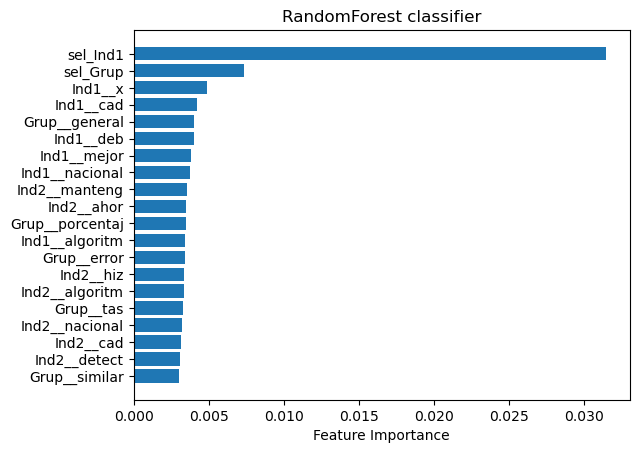

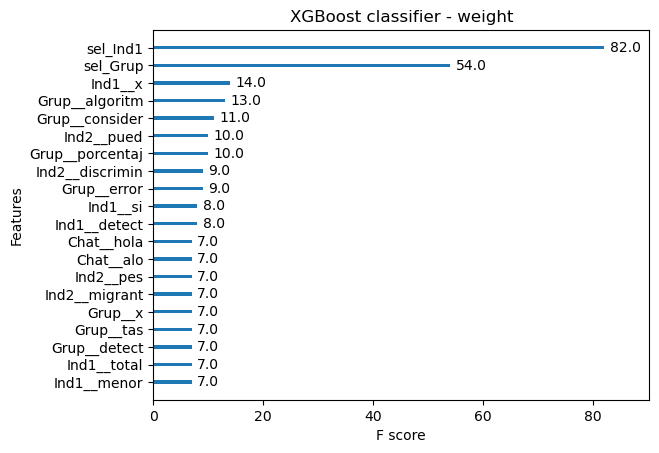

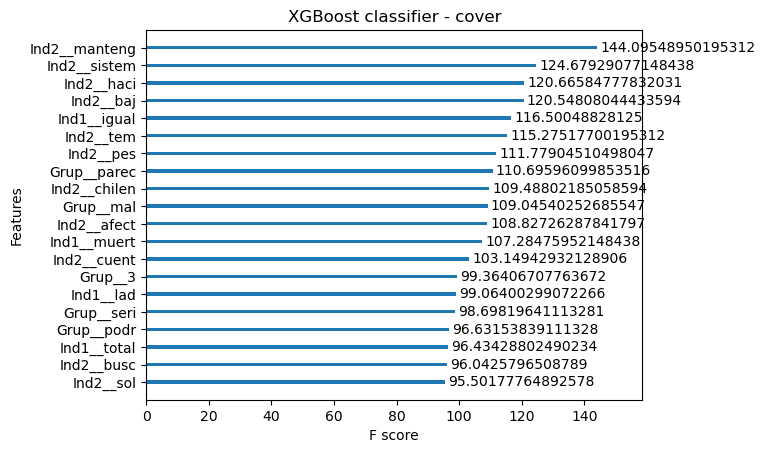

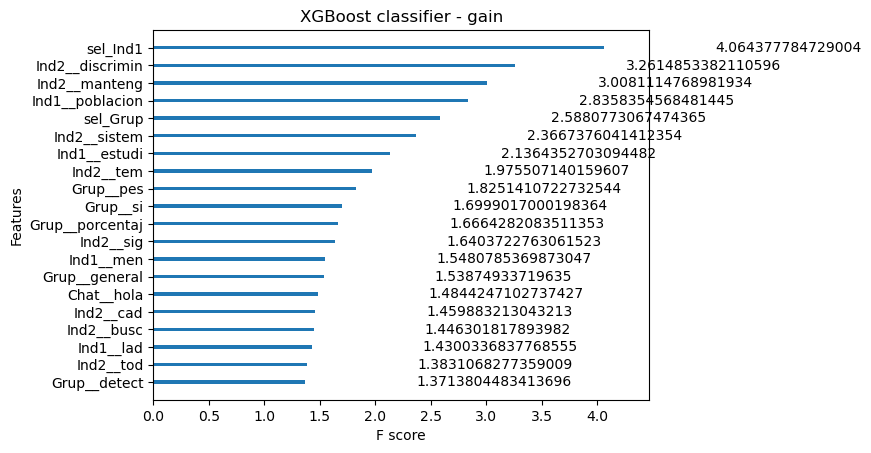

In [45]:
plot_importance_models(rf_best_model, xgb_best_model)

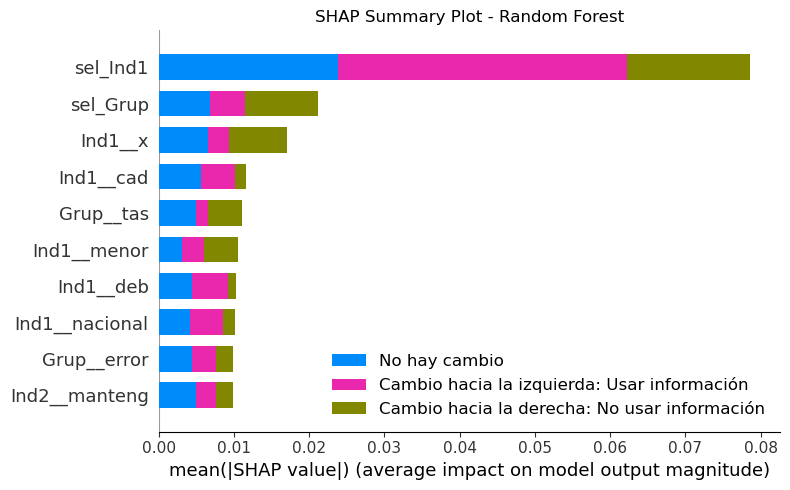

In [46]:
summary_plot(rf_best_model, df_train, 'SHAP Summary Plot - Random Forest', df=1)

[19:43:56] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\c_api\c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


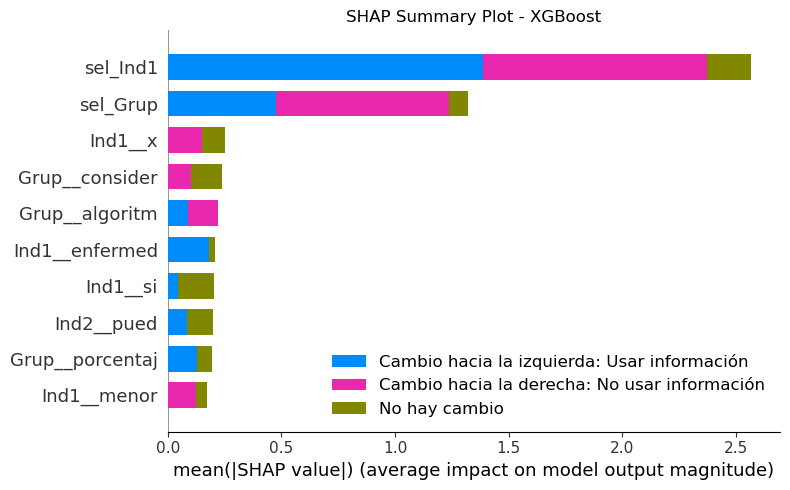

In [47]:
summary_plot(xgb_best_model, df_train, 'SHAP Summary Plot - XGBoost', df=1)

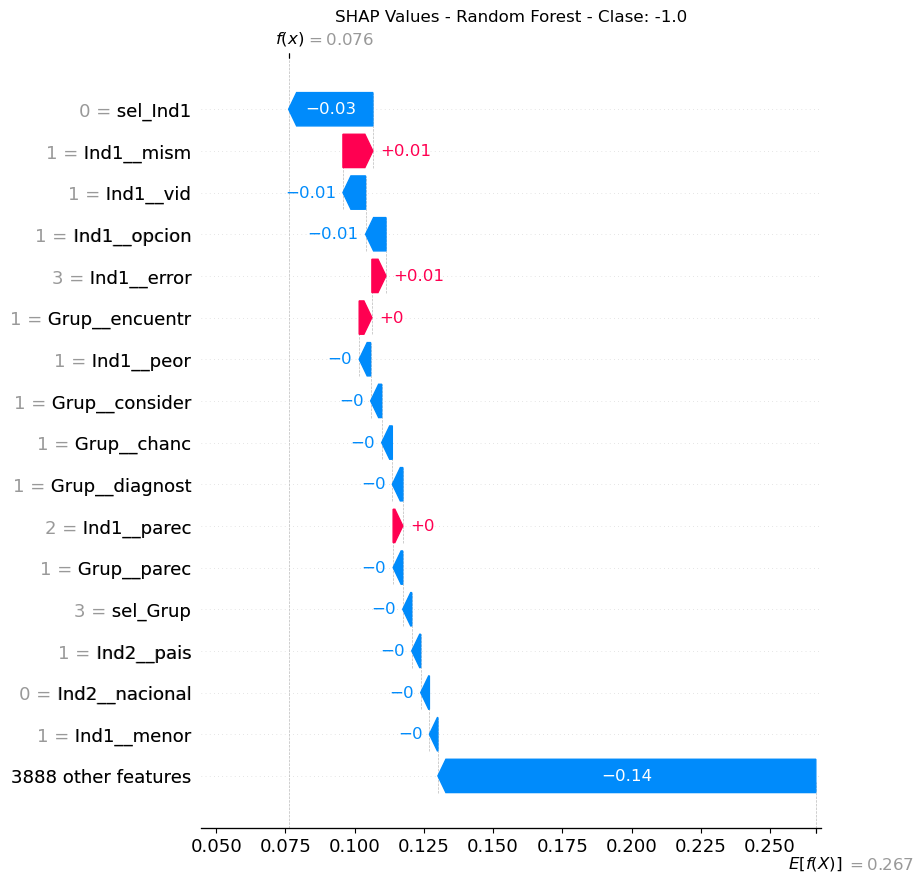

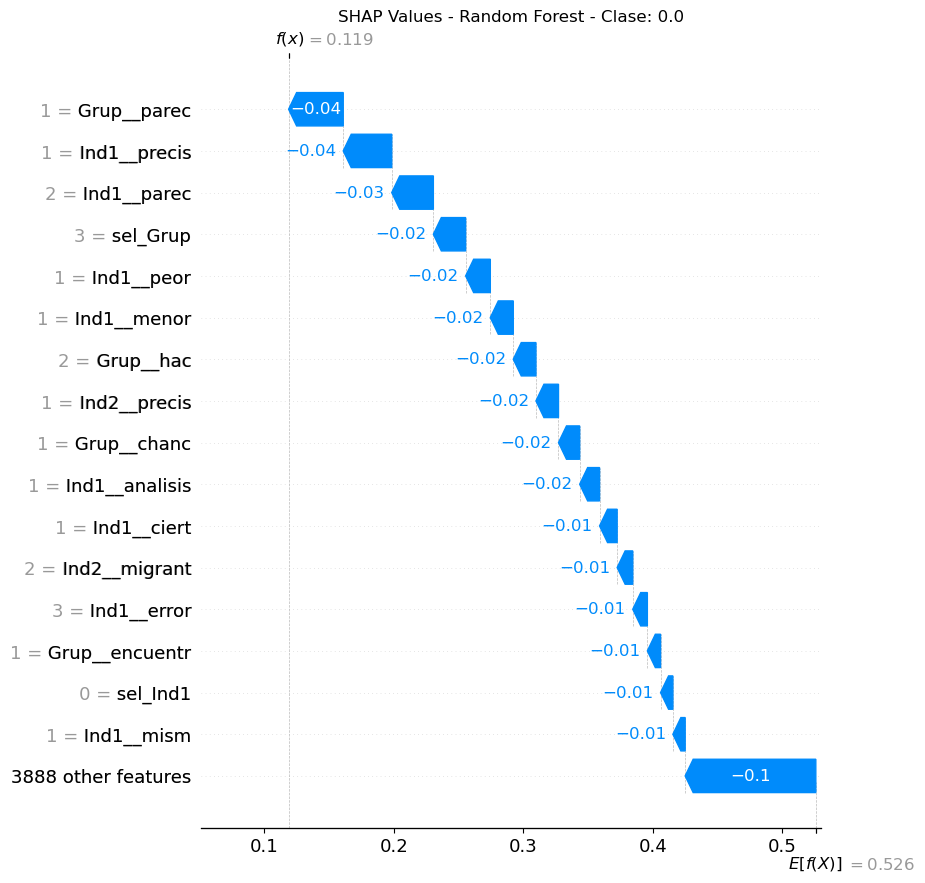

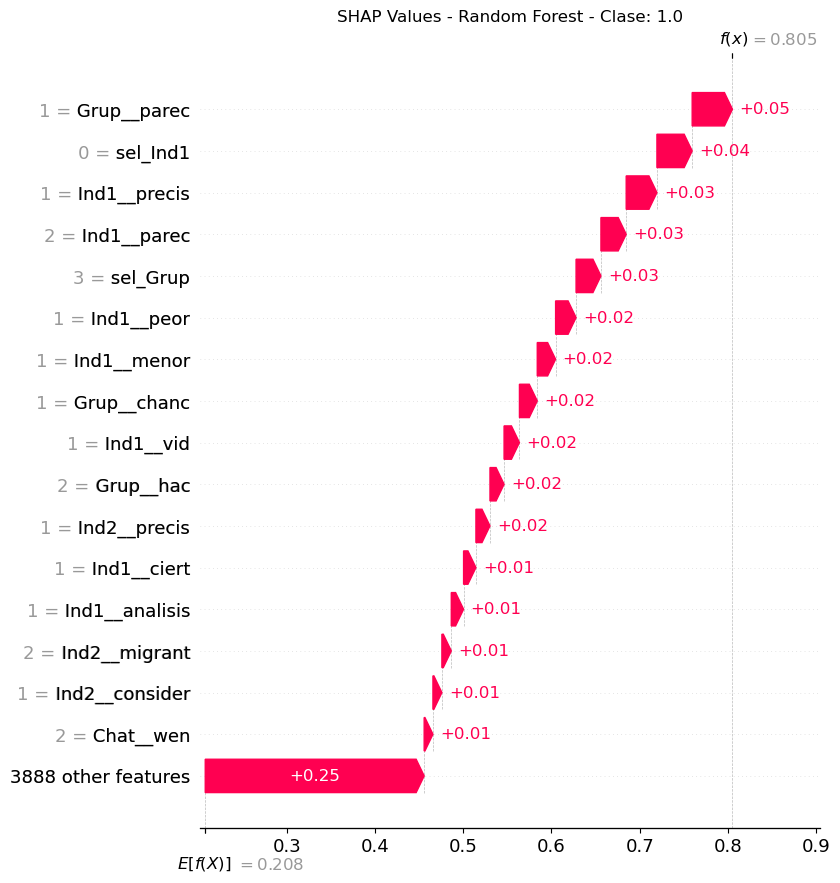

In [48]:
idx=1

individual_explanation(idx, rf_best_model, df_train, 'SHAP Values - Random Forest')

[19:44:01] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\c_api\c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


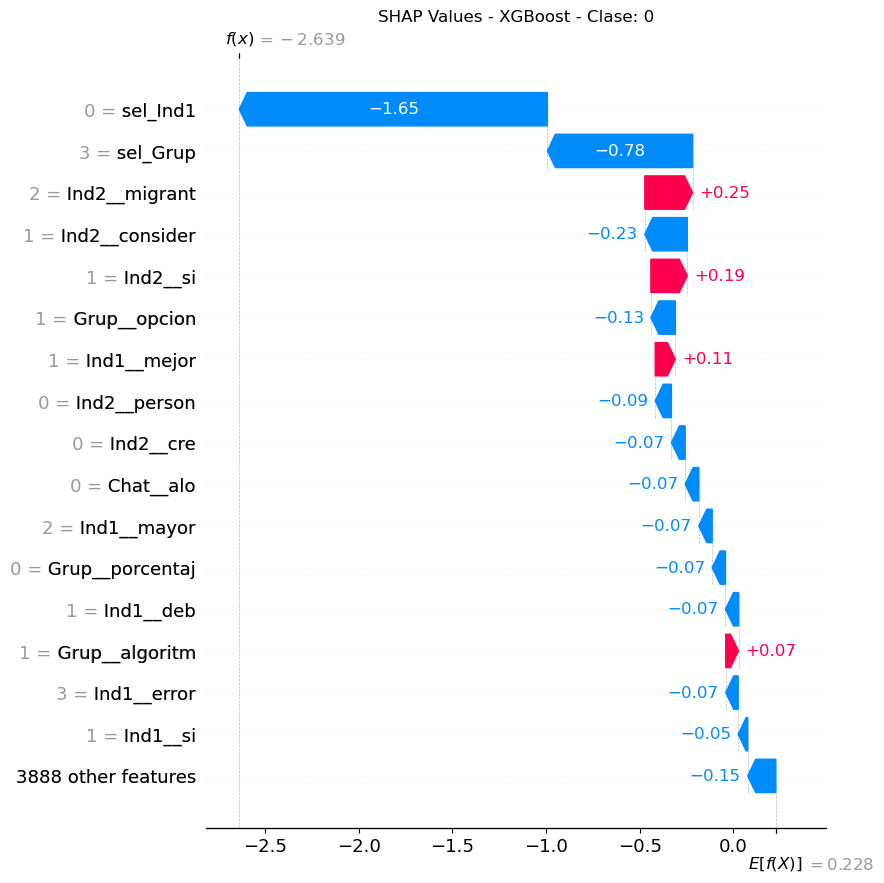

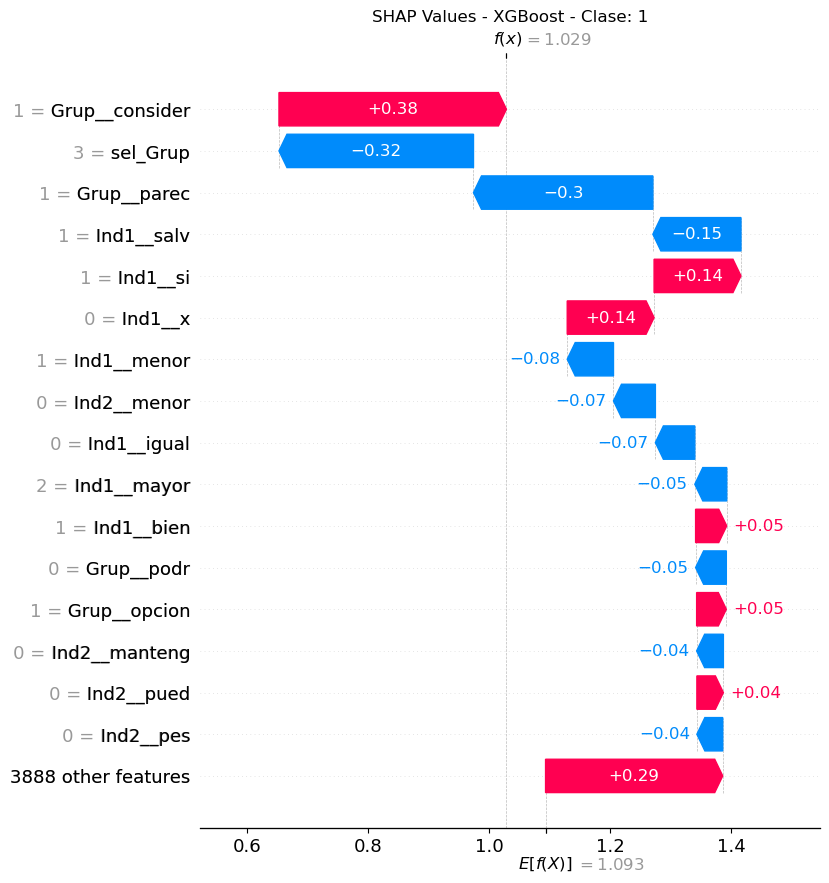

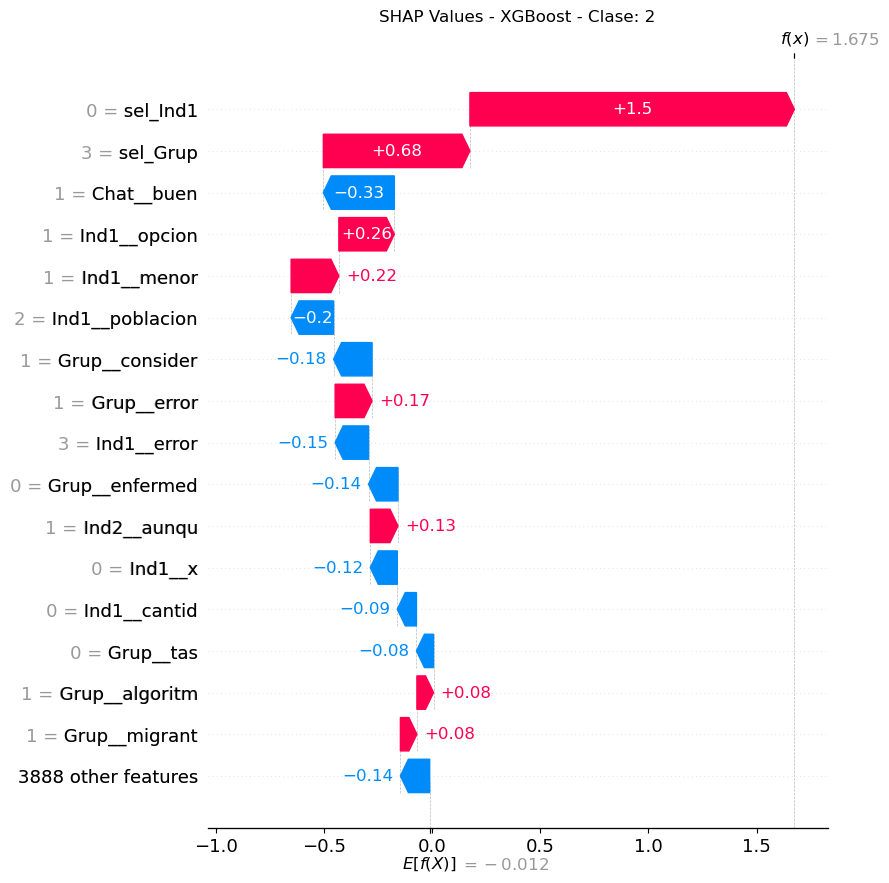

In [49]:
idx=1

individual_explanation(idx, xgb_best_model, df_train, 'SHAP Values - XGBoost')

## Modelo 2. Agregar género

In [50]:
df_train, df_test, y_train, y_test, categorical_preprocessing, text_preprocessing = preprocessing(
    dataset,
    gender=True, 
    comment_Ind2=True, 
    sel_Ind1=True
)
df_train

,sel_Ind1,sel_Grup,gender:M,gender:F,gender:O,Ind1__0si,Ind1__1,Ind1__100,Ind1__15,Ind1__155,...,Chat__wenap,Chat__wenass,Chat__wifi,Chat__wol,Chat__x,Chat__x2,Chat__x3,Chat__xat,Chat__xd,Chat__ª
180,1.0,1.0,0.0,1.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
201,0.0,3.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
174,1.0,1.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
195,2.0,1.0,0.0,1.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
187,1.0,0.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
155,1.0,2.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
102,1.0,4.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
189,2.0,3.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
239,1.0,2.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [51]:
categorical_preprocessing

ColumnTransformer(transformers=[('sel_etapa',
                                 Pipeline(steps=[('ordinal_encoder',
                                                  OrdinalEncoder())]),
                                 ['sel_Ind1', 'sel_Grup', 'sel_Ind2']),
                                ('gender',
                                 Pipeline(steps=[('extract',
                                                  ColumnExtractor(columns=['gender'])),
                                                 ('onehot_encoder',
                                                  OneHotEncoder(categories=[['M',
                                                                             'F',
                                                                             'O']],
                                                                sparse_output=False))]),
                                 ['gender'])])

In [52]:
text_preprocessing

ColumnTransformer(transformers=[('Ind1',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x0000018790891ED0>),
                                 'comment_Ind1'),
                                ('Grup',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x0000018790891ED0>),
                                 'comment_Grup'),
                                ('Ind2',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x0000018790891ED0>),
                                 'comment_Ind2'),
                                ('Chat',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x0000018790891ED0>),
                                 'summary')])

In [53]:
dummy_model, rf_best_model, xgb_best_model = train_models(df_train, df_test, y_train, y_test, grid_rf, grid_xgb)

Dummy classifier
              precision    recall  f1-score   support

        -1.0       0.00      0.00      0.00        22
         0.0       0.53      1.00      0.69        44
         1.0       0.00      0.00      0.00        17

    accuracy                           0.53        83
   macro avg       0.18      0.33      0.23        83
weighted avg       0.28      0.53      0.37        83

Random Forest classifier
Best Hyperparameters: {'max_depth': 20, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 200}
              precision    recall  f1-score   support

        -1.0       0.00      0.00      0.00        22
         0.0       0.53      1.00      0.69        44
         1.0       0.00      0.00      0.00        17

    accuracy                           0.53        83
   macro avg       0.18      0.33      0.23        83
weighted avg       0.28      0.53      0.37        83

XGBoost classifier
Best Hyperparameters: {'max_leaves': 5, 'min_child_weight': 3, 'n_est

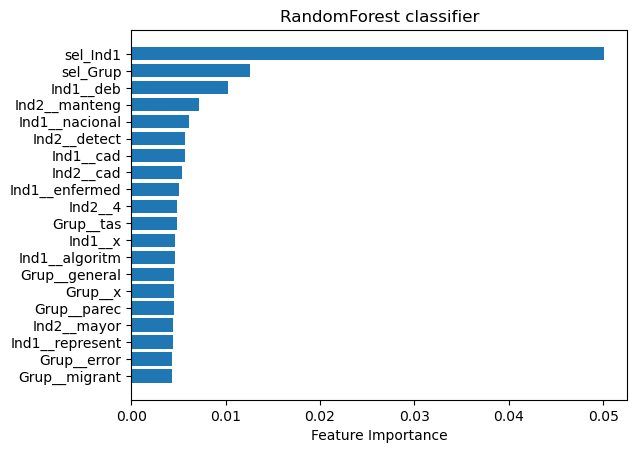

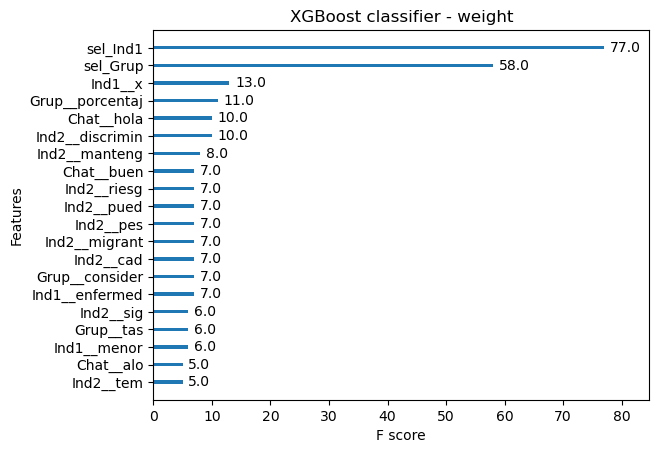

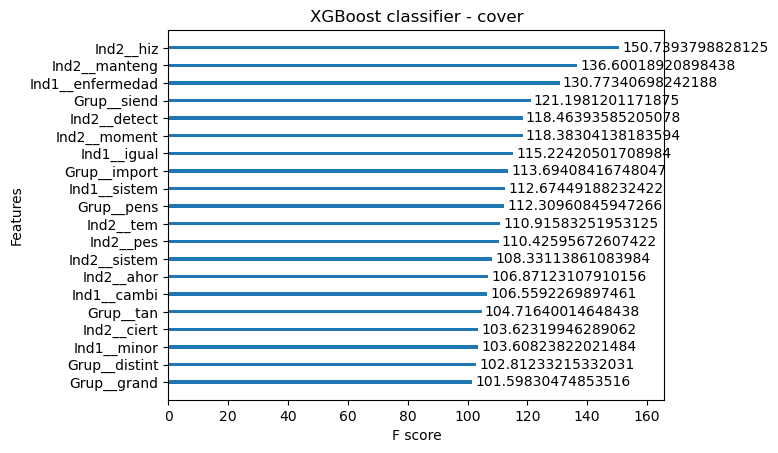

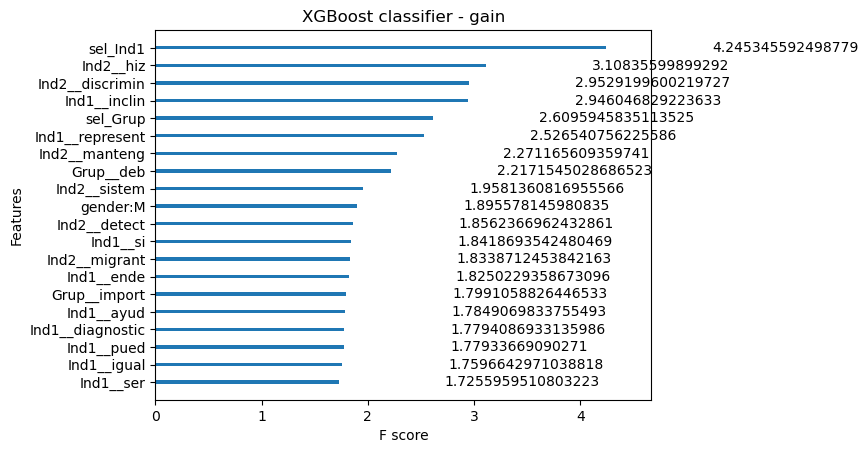

In [54]:
plot_importance_models(rf_best_model, xgb_best_model)

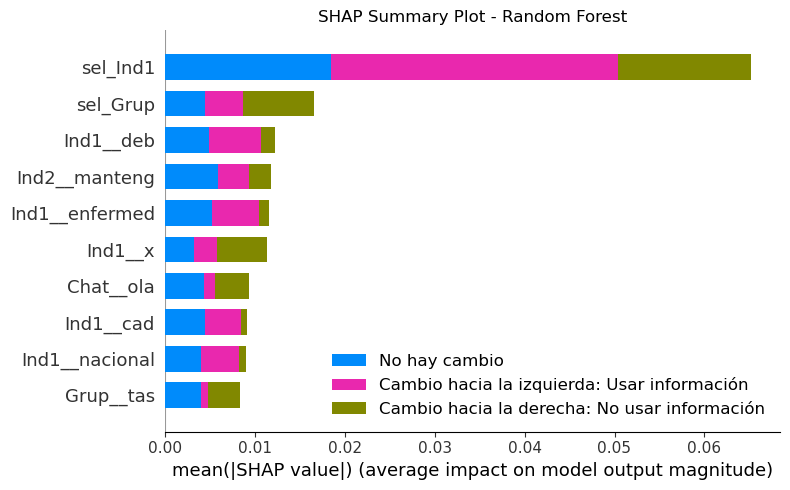

In [55]:
summary_plot(rf_best_model, df_train, 'SHAP Summary Plot - Random Forest', df=1)

[19:45:27] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\c_api\c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


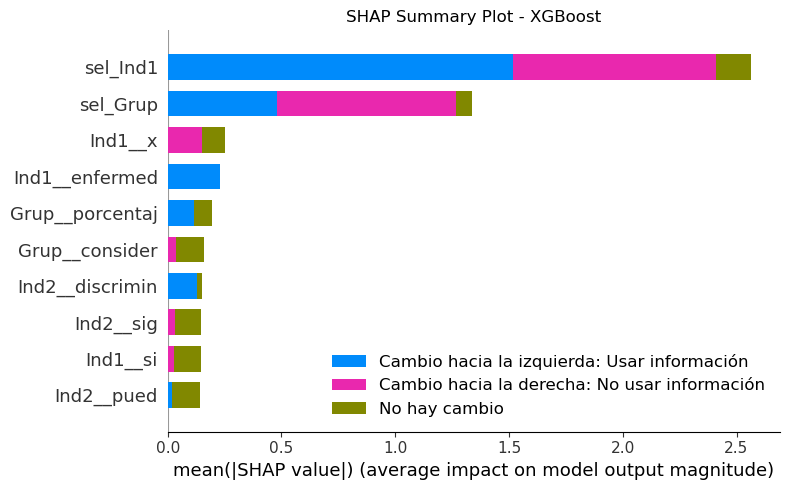

In [56]:
summary_plot(xgb_best_model, df_train, 'SHAP Summary Plot - XGBoost', df=1)

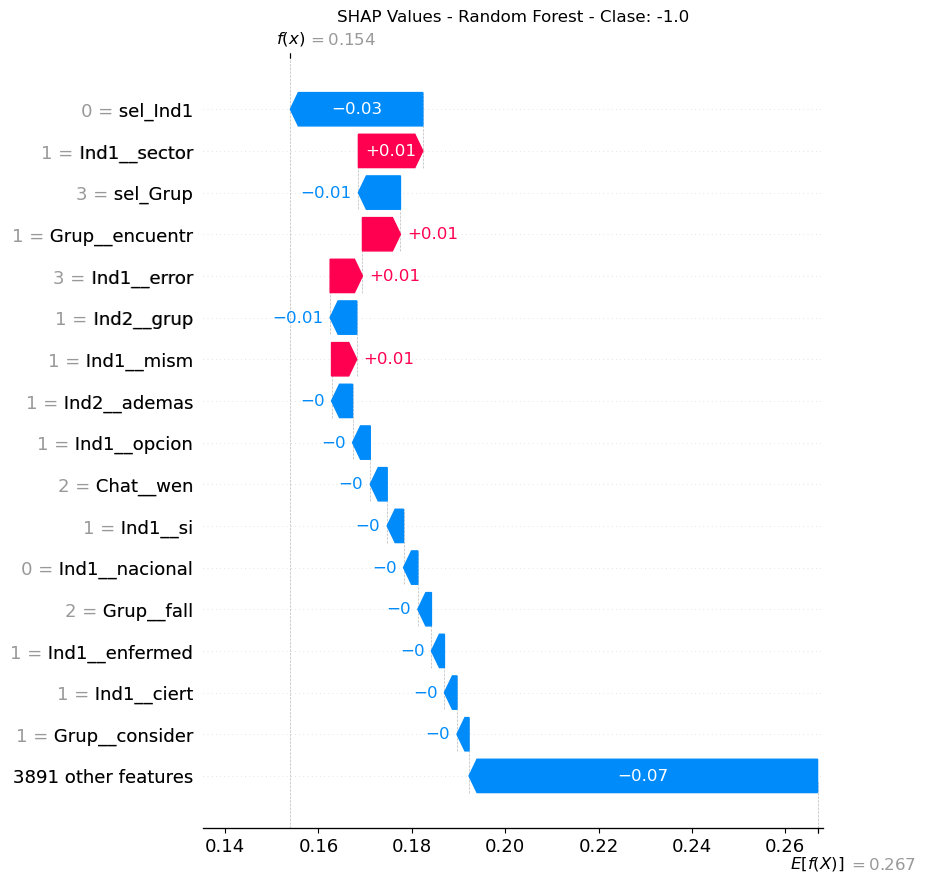

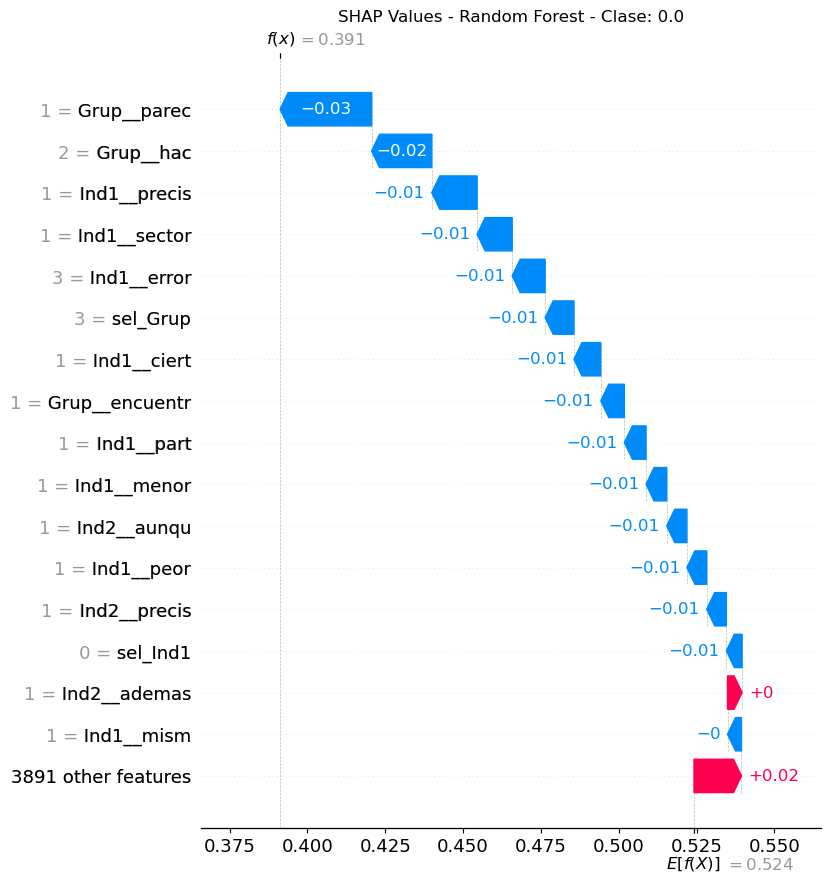

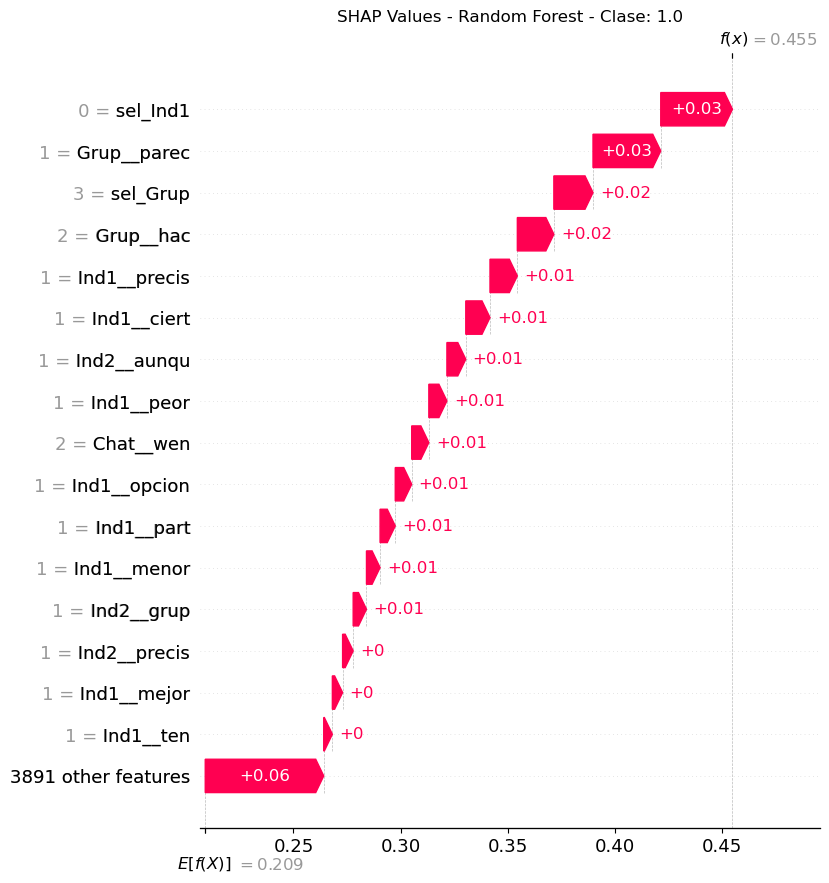

In [57]:
idx=1

individual_explanation(idx, rf_best_model, df_train, 'SHAP Values - Random Forest')

[19:45:31] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\c_api\c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


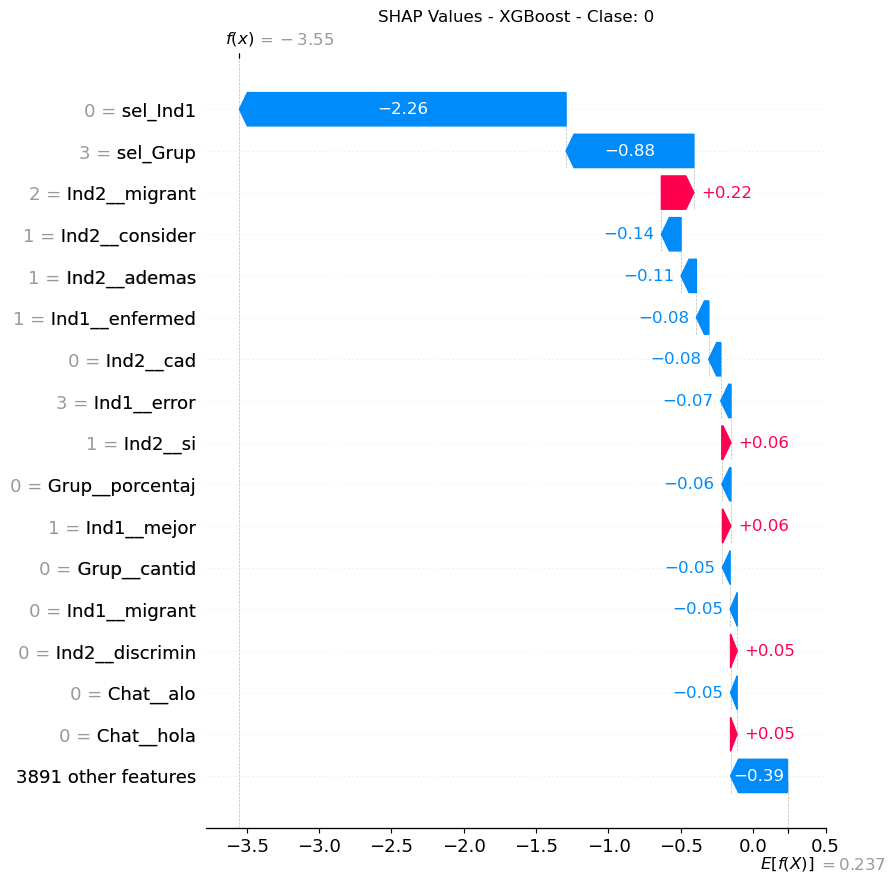

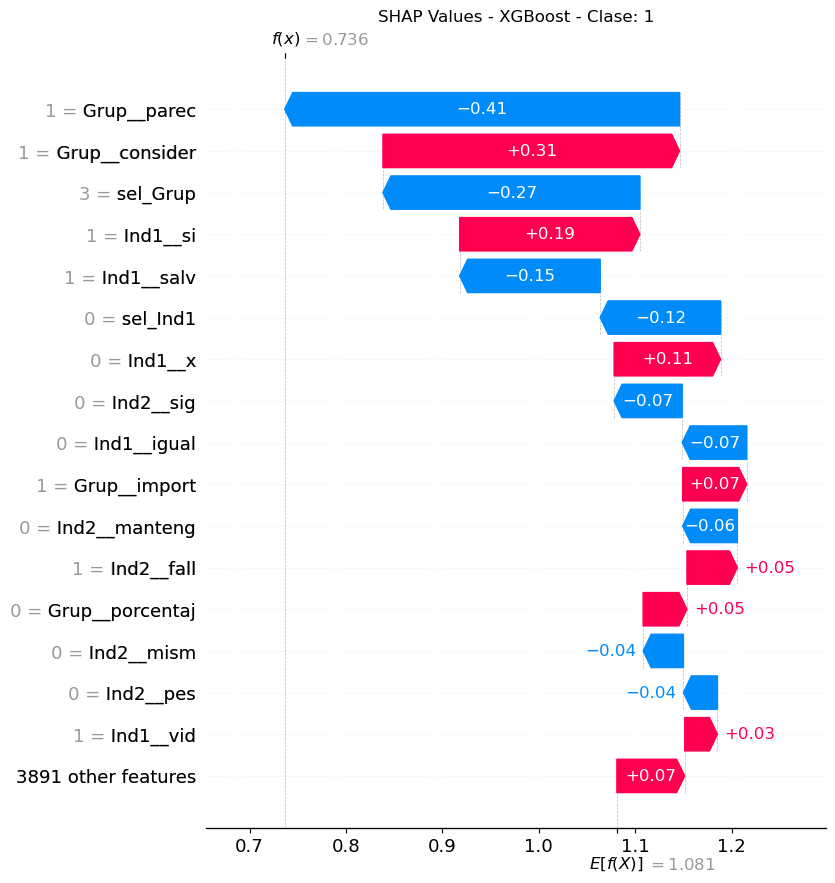

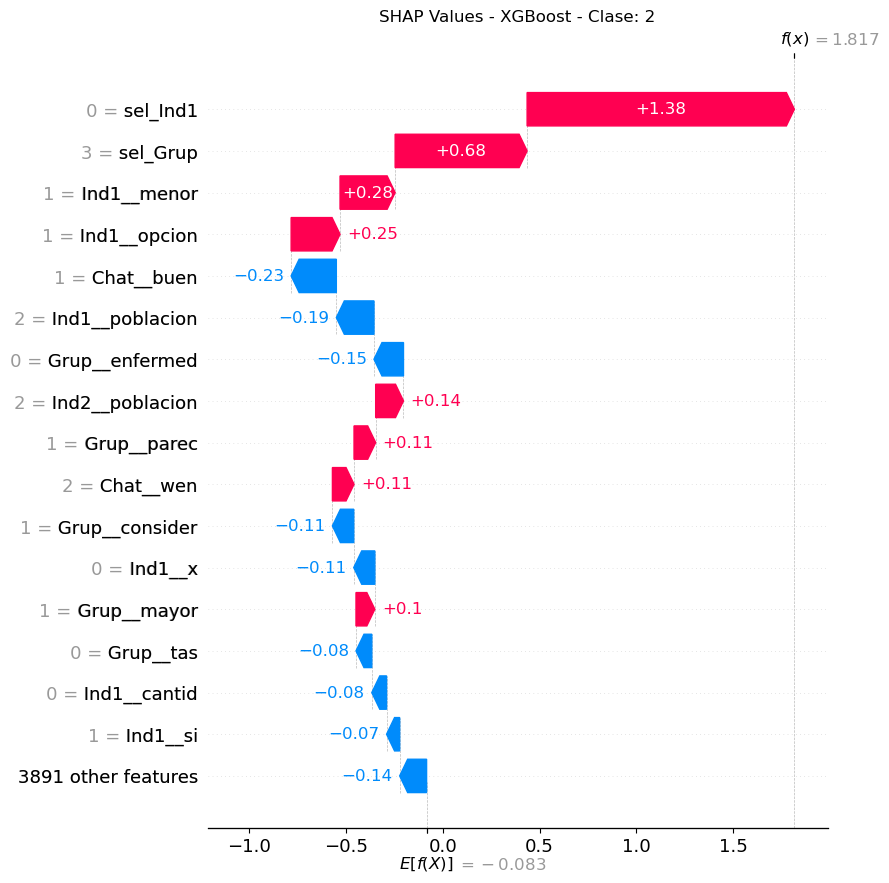

In [58]:
idx=1

individual_explanation(idx, xgb_best_model, df_train, 'SHAP Values - XGBoost')

## Modelo 3. Quitar selección 1

In [59]:
df_train, df_test, y_train, y_test, categorical_preprocessing, text_preprocessing = preprocessing(
    dataset,
    gender=True, 
    comment_Ind2=True, 
    sel_Ind1=False
)
df_train

,sel_Grup,gender:M,gender:F,gender:O,Ind1__0si,Ind1__1,Ind1__100,Ind1__15,Ind1__155,Ind1__2,...,Chat__wenap,Chat__wenass,Chat__wifi,Chat__wol,Chat__x,Chat__x2,Chat__x3,Chat__xat,Chat__xd,Chat__ª
180,1.0,0.0,1.0,0.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
201,3.0,1.0,0.0,0.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
174,1.0,1.0,0.0,0.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
195,1.0,0.0,1.0,0.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
187,0.0,1.0,0.0,0.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
155,2.0,1.0,0.0,0.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
102,4.0,1.0,0.0,0.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
189,3.0,1.0,0.0,0.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
239,2.0,1.0,0.0,0.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [60]:
categorical_preprocessing

ColumnTransformer(transformers=[('sel_etapa',
                                 Pipeline(steps=[('ordinal_encoder',
                                                  OrdinalEncoder())]),
                                 ['sel_Ind1', 'sel_Grup', 'sel_Ind2']),
                                ('gender',
                                 Pipeline(steps=[('extract',
                                                  ColumnExtractor(columns=['gender'])),
                                                 ('onehot_encoder',
                                                  OneHotEncoder(categories=[['M',
                                                                             'F',
                                                                             'O']],
                                                                sparse_output=False))]),
                                 ['gender'])])

In [61]:
text_preprocessing

ColumnTransformer(transformers=[('Ind1',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x0000018792E24550>),
                                 'comment_Ind1'),
                                ('Grup',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x0000018792E24550>),
                                 'comment_Grup'),
                                ('Ind2',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x0000018792E24550>),
                                 'comment_Ind2'),
                                ('Chat',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x0000018792E24550>),
                                 'summary')])

In [62]:
dummy_model, rf_best_model, xgb_best_model = train_models(df_train, df_test, y_train, y_test, grid_rf, grid_xgb)

Dummy classifier
              precision    recall  f1-score   support

        -1.0       0.00      0.00      0.00        22
         0.0       0.53      1.00      0.69        44
         1.0       0.00      0.00      0.00        17

    accuracy                           0.53        83
   macro avg       0.18      0.33      0.23        83
weighted avg       0.28      0.53      0.37        83

Random Forest classifier
Best Hyperparameters: {'max_depth': 20, 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 100}
              precision    recall  f1-score   support

        -1.0       0.00      0.00      0.00        22
         0.0       0.52      0.98      0.68        44
         1.0       0.00      0.00      0.00        17

    accuracy                           0.52        83
   macro avg       0.17      0.33      0.23        83
weighted avg       0.28      0.52      0.36        83

XGBoost classifier
Best Hyperparameters: {'max_leaves': 20, 'min_child_weight': 3, 'n_e

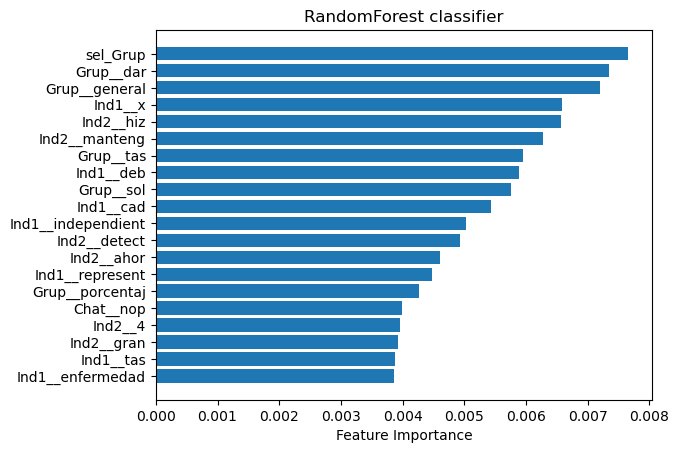

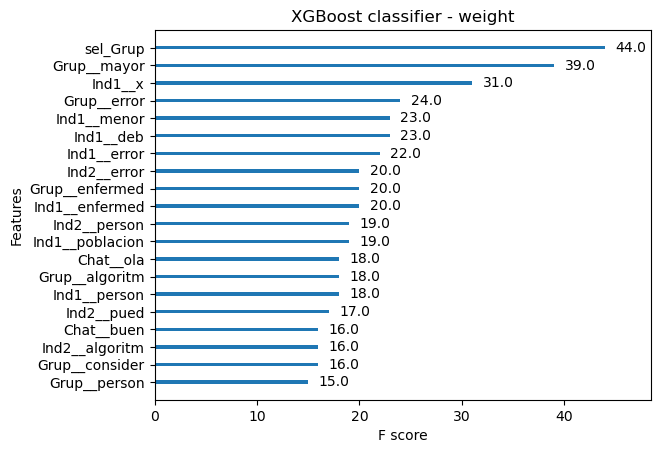

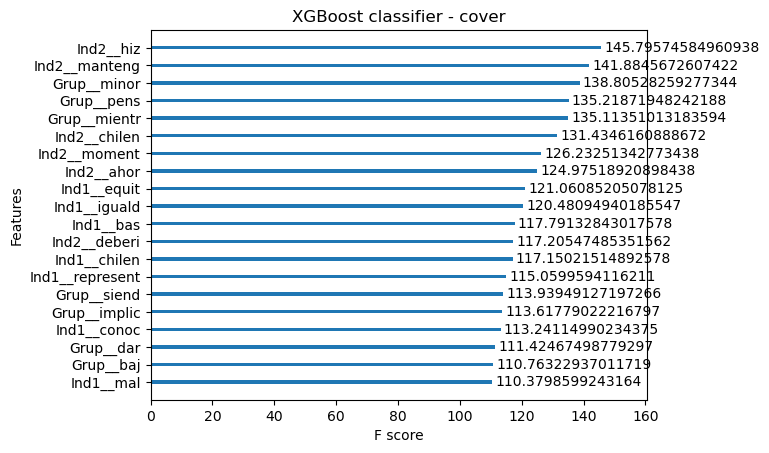

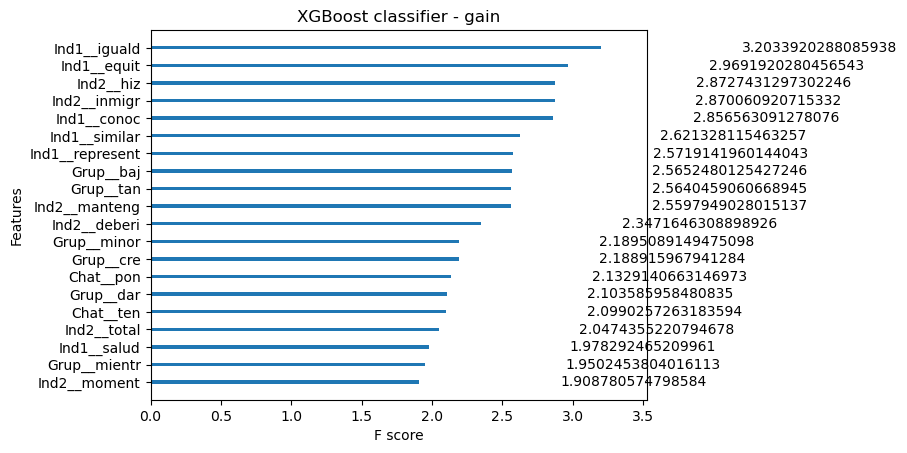

In [63]:
plot_importance_models(rf_best_model, xgb_best_model)

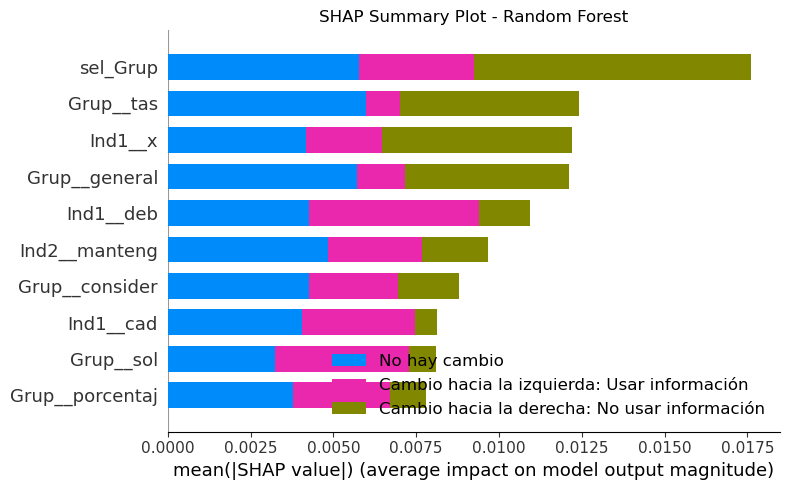

In [64]:
summary_plot(rf_best_model, df_train, 'SHAP Summary Plot - Random Forest', df=1)

[19:48:16] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\c_api\c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


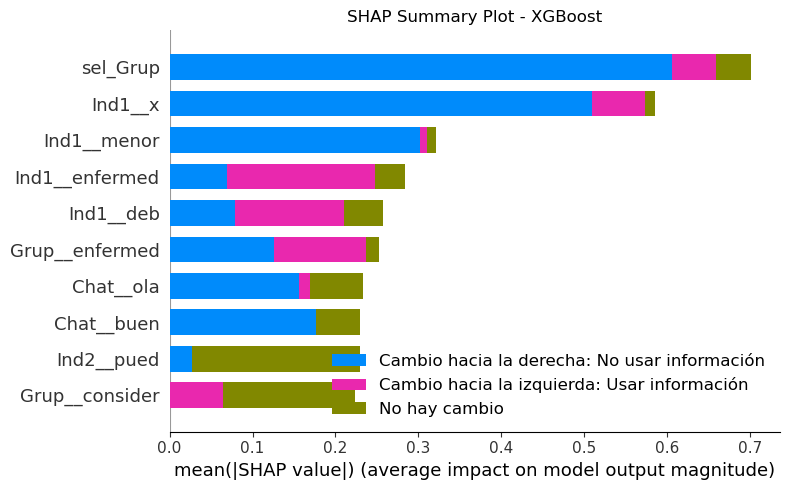

In [65]:
summary_plot(xgb_best_model, df_train, 'SHAP Summary Plot - XGBoost', df=1)

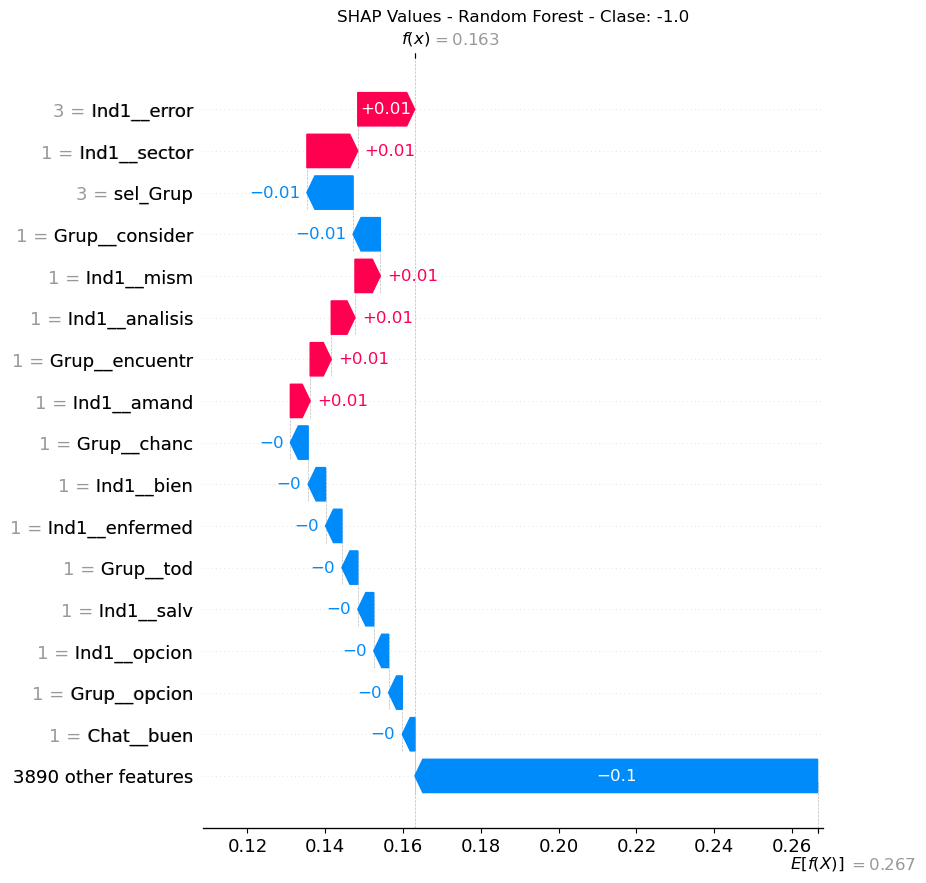

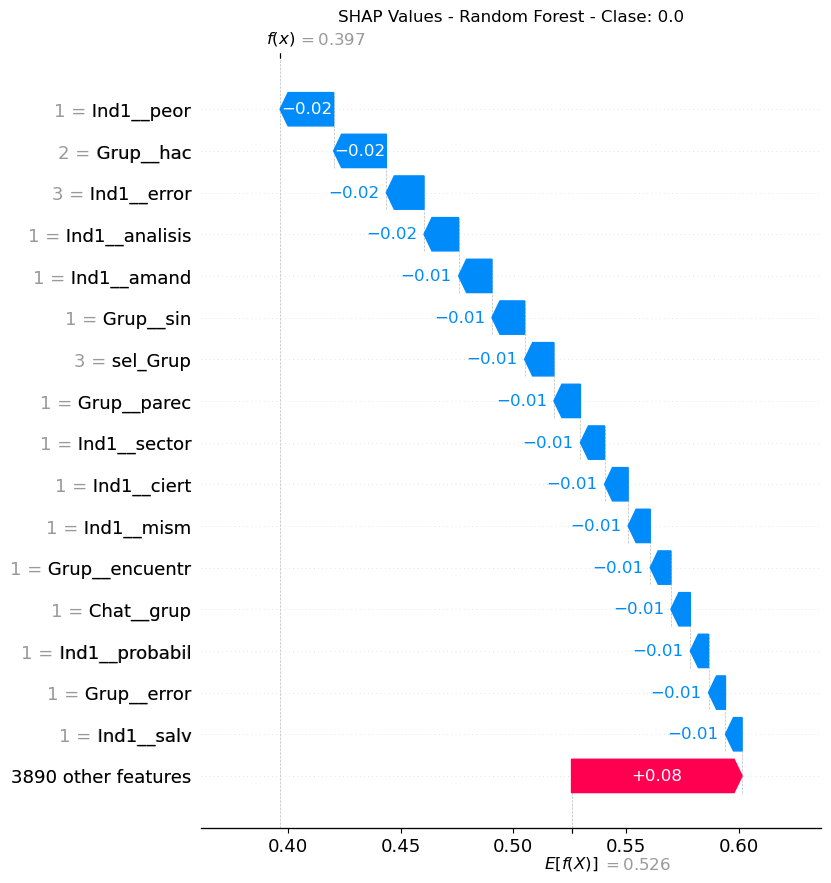

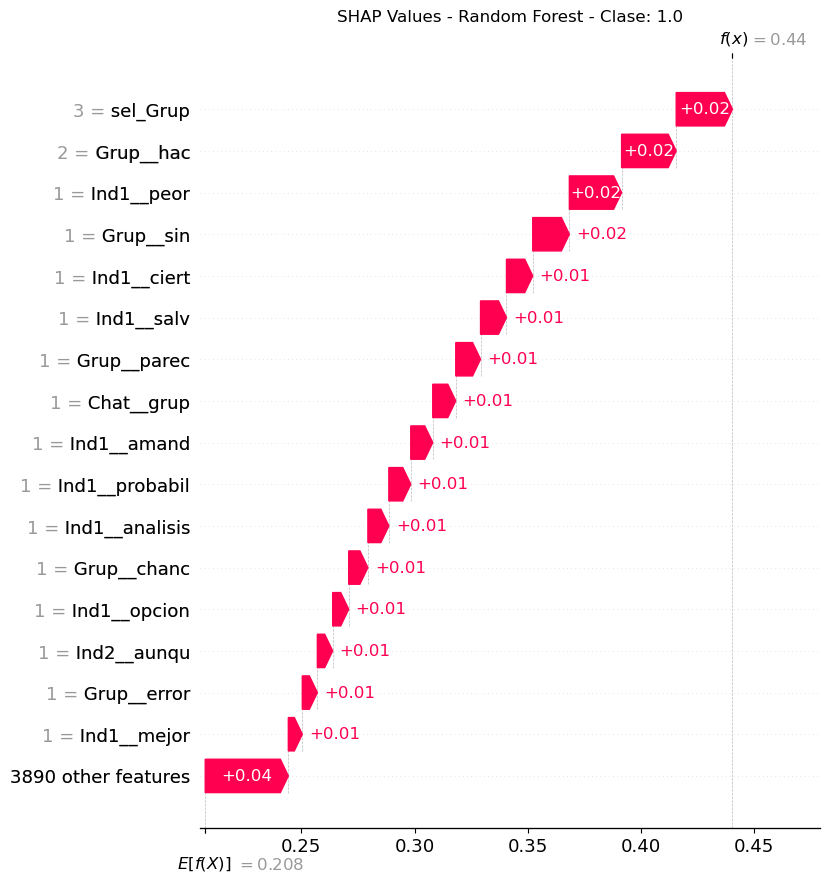

In [66]:
idx=1

individual_explanation(idx, rf_best_model, df_train, 'SHAP Values - Random Forest')

[19:48:20] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\c_api\c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


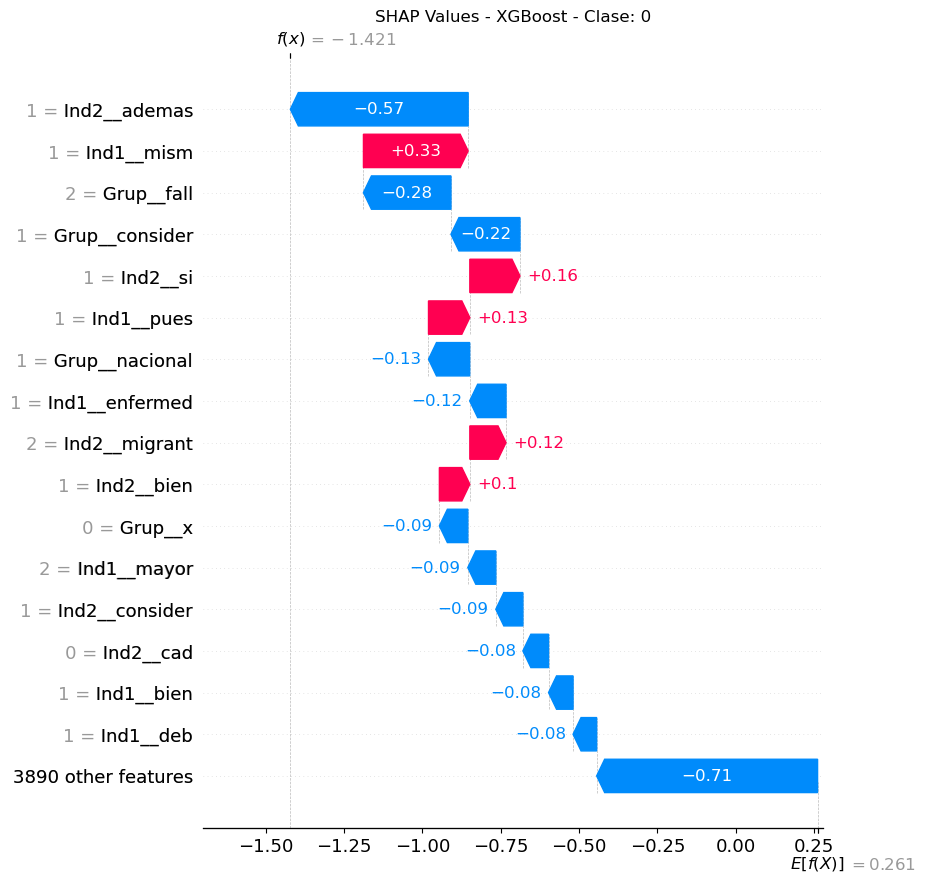

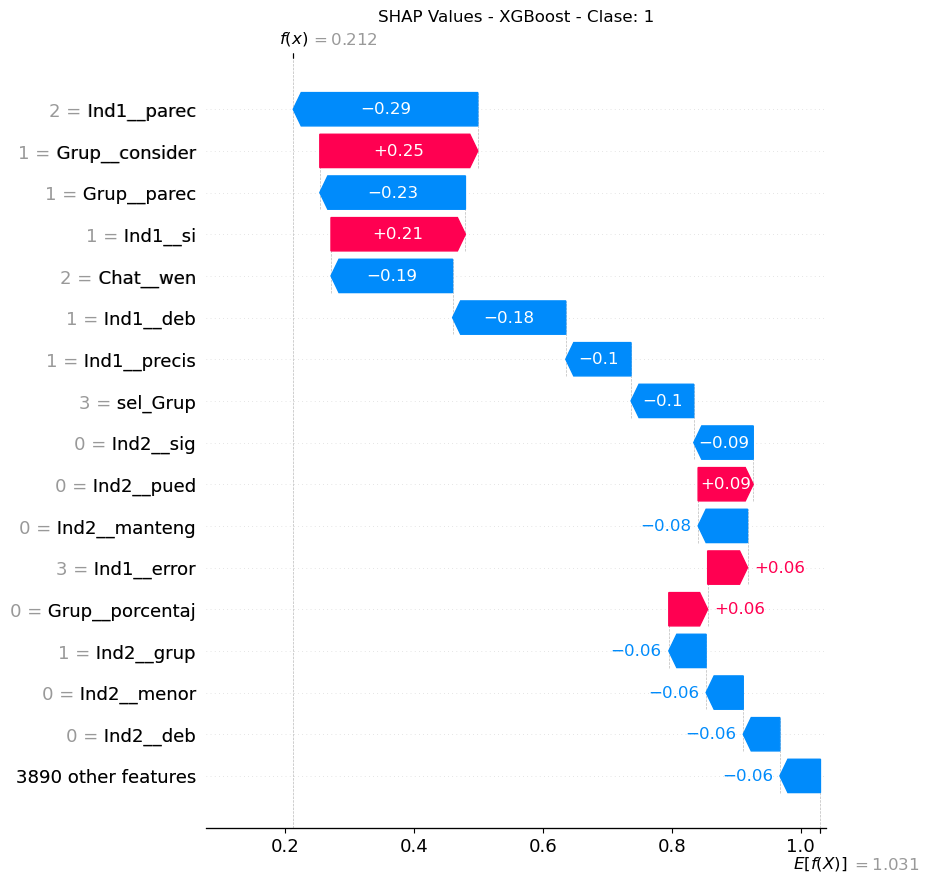

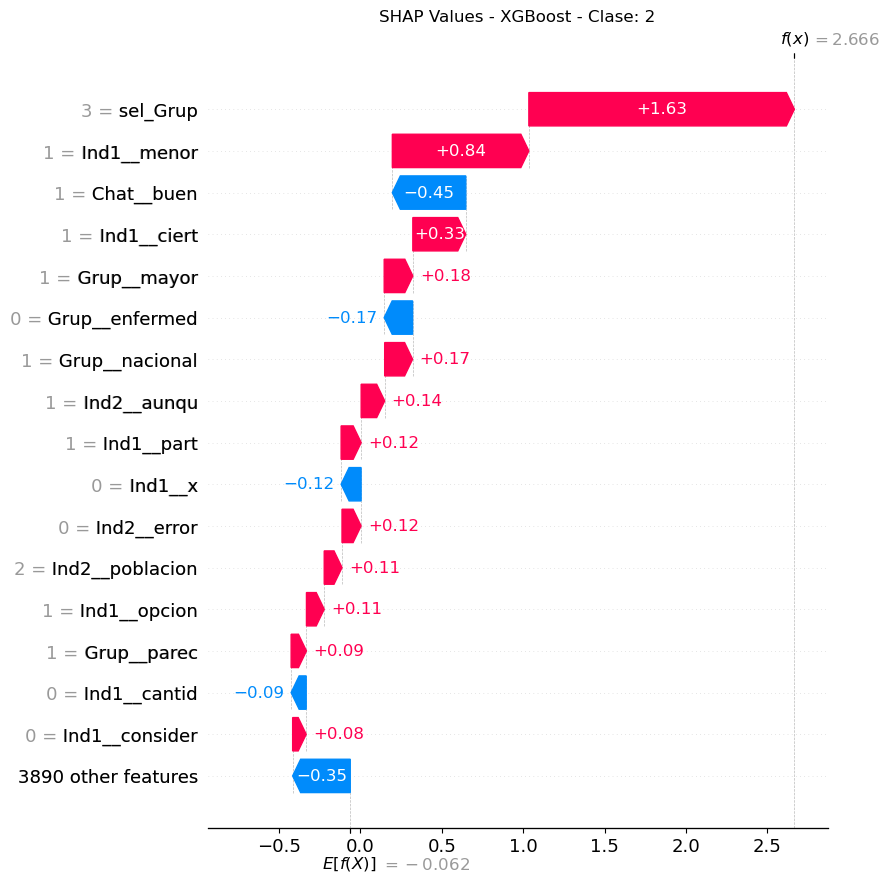

In [67]:
idx=1

individual_explanation(idx, xgb_best_model, df_train, 'SHAP Values - XGBoost')

## Modelo 4. Quitar justificación individual 2

In [68]:
df_train, df_test, y_train, y_test, categorical_preprocessing, text_preprocessing = preprocessing(
    dataset,
    gender=True, 
    comment_Ind2=False, 
    sel_Ind1=True
)
df_train

,sel_Ind1,sel_Grup,gender:M,gender:F,gender:O,Ind1__0si,Ind1__1,Ind1__100,Ind1__15,Ind1__155,...,Chat__wenap,Chat__wenass,Chat__wifi,Chat__wol,Chat__x,Chat__x2,Chat__x3,Chat__xat,Chat__xd,Chat__ª
180,1.0,1.0,0.0,1.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
201,0.0,3.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
174,1.0,1.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
195,2.0,1.0,0.0,1.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
187,1.0,0.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
155,1.0,2.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
102,1.0,4.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
189,2.0,3.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
239,1.0,2.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [69]:
categorical_preprocessing

ColumnTransformer(transformers=[('sel_etapa',
                                 Pipeline(steps=[('ordinal_encoder',
                                                  OrdinalEncoder())]),
                                 ['sel_Ind1', 'sel_Grup', 'sel_Ind2']),
                                ('gender',
                                 Pipeline(steps=[('extract',
                                                  ColumnExtractor(columns=['gender'])),
                                                 ('onehot_encoder',
                                                  OneHotEncoder(categories=[['M',
                                                                             'F',
                                                                             'O']],
                                                                sparse_output=False))]),
                                 ['gender'])])

In [70]:
text_preprocessing

ColumnTransformer(transformers=[('Ind1',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x00000187911C13C0>),
                                 'comment_Ind1'),
                                ('Grup',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x00000187911C13C0>),
                                 'comment_Grup'),
                                ('Chat',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x00000187911C13C0>),
                                 'summary')])

In [71]:
dummy_model, rf_best_model, xgb_best_model = train_models(df_train, df_test, y_train, y_test, grid_rf, grid_xgb)

Dummy classifier
              precision    recall  f1-score   support

        -1.0       0.00      0.00      0.00        22
         0.0       0.53      1.00      0.69        44
         1.0       0.00      0.00      0.00        17

    accuracy                           0.53        83
   macro avg       0.18      0.33      0.23        83
weighted avg       0.28      0.53      0.37        83

Random Forest classifier
Best Hyperparameters: {'max_depth': 30, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
              precision    recall  f1-score   support

        -1.0       0.00      0.00      0.00        22
         0.0       0.51      0.91      0.65        44
         1.0       0.00      0.00      0.00        17

    accuracy                           0.48        83
   macro avg       0.17      0.30      0.22        83
weighted avg       0.27      0.48      0.34        83

XGBoost classifier
Best Hyperparameters: {'max_leaves': 5, 'min_child_weight': 1, 'n_est

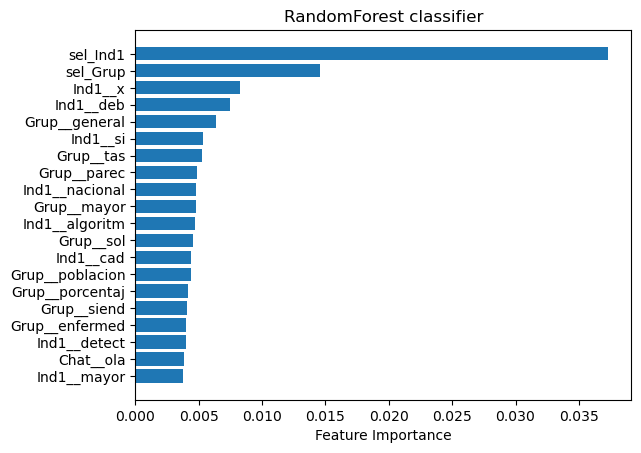

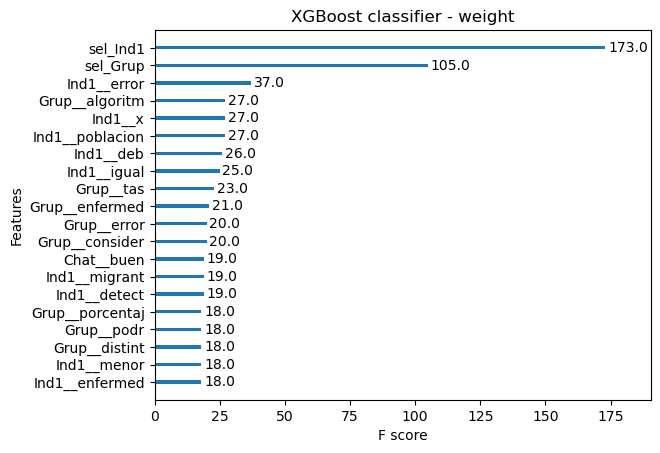

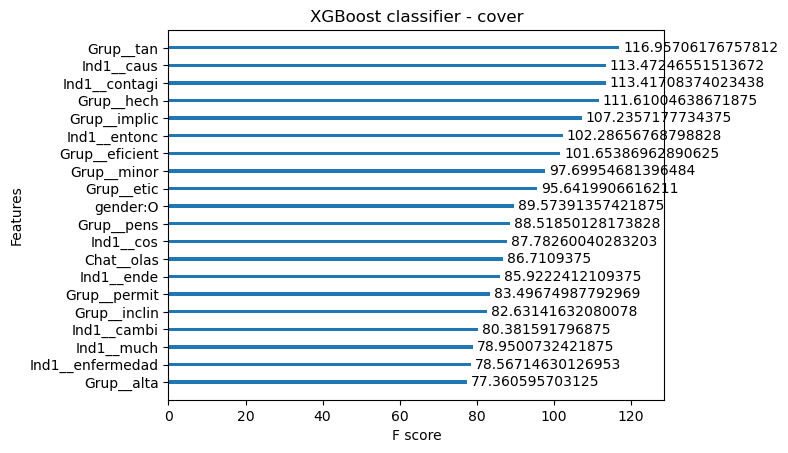

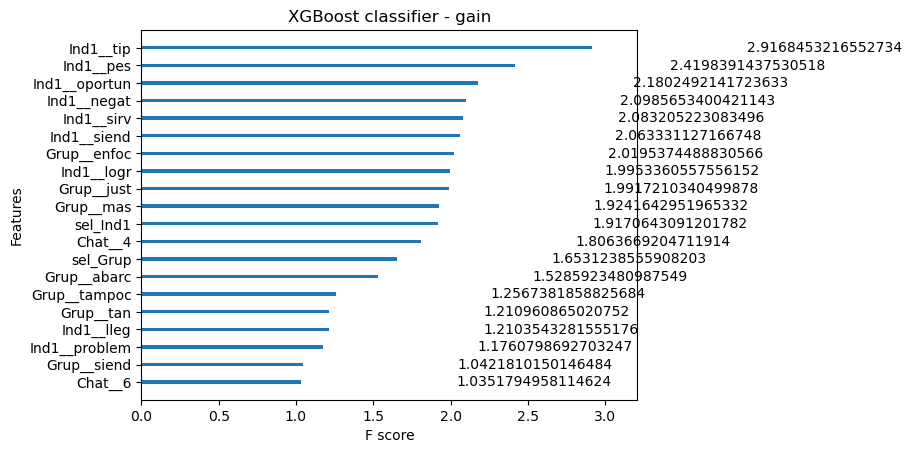

In [72]:
plot_importance_models(rf_best_model, xgb_best_model)

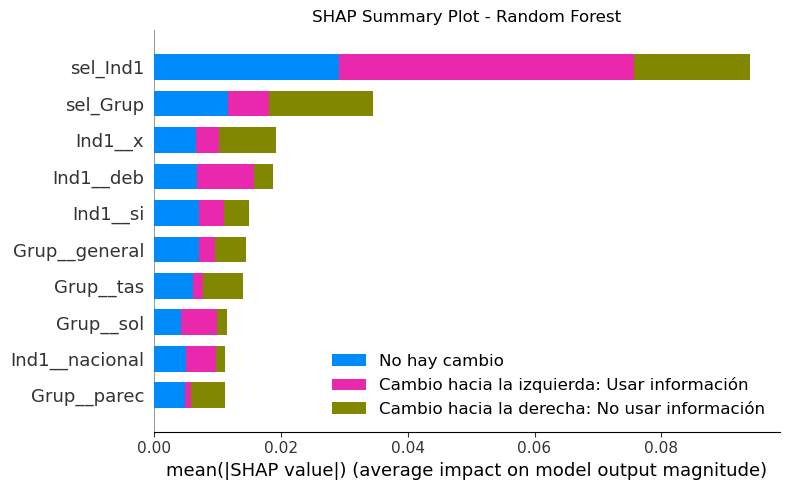

In [73]:
summary_plot(rf_best_model, df_train, 'SHAP Summary Plot - Random Forest', df=1)

[19:51:21] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\c_api\c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


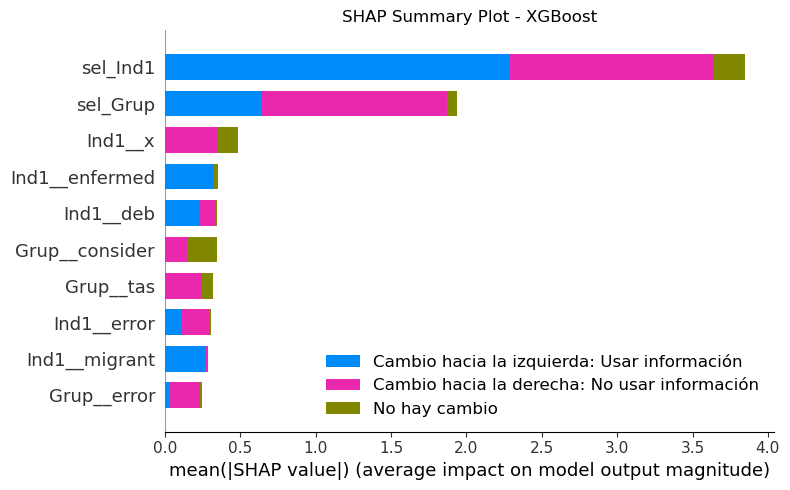

In [74]:
summary_plot(xgb_best_model, df_train, 'SHAP Summary Plot - XGBoost', df=1)

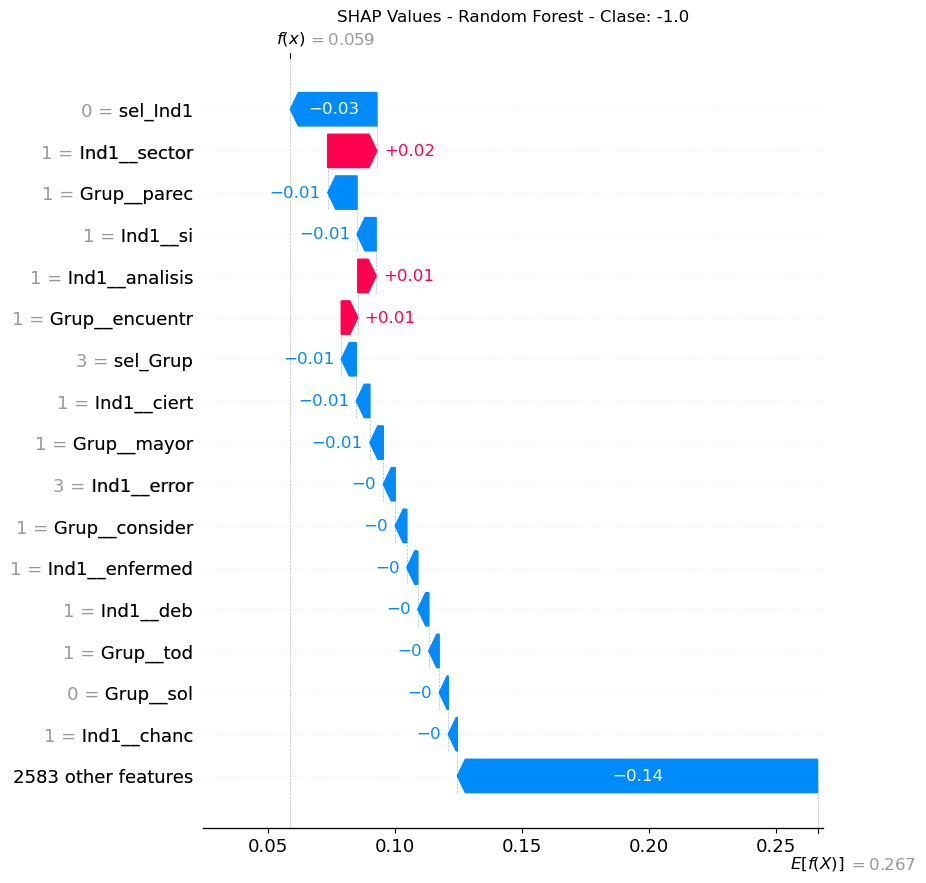

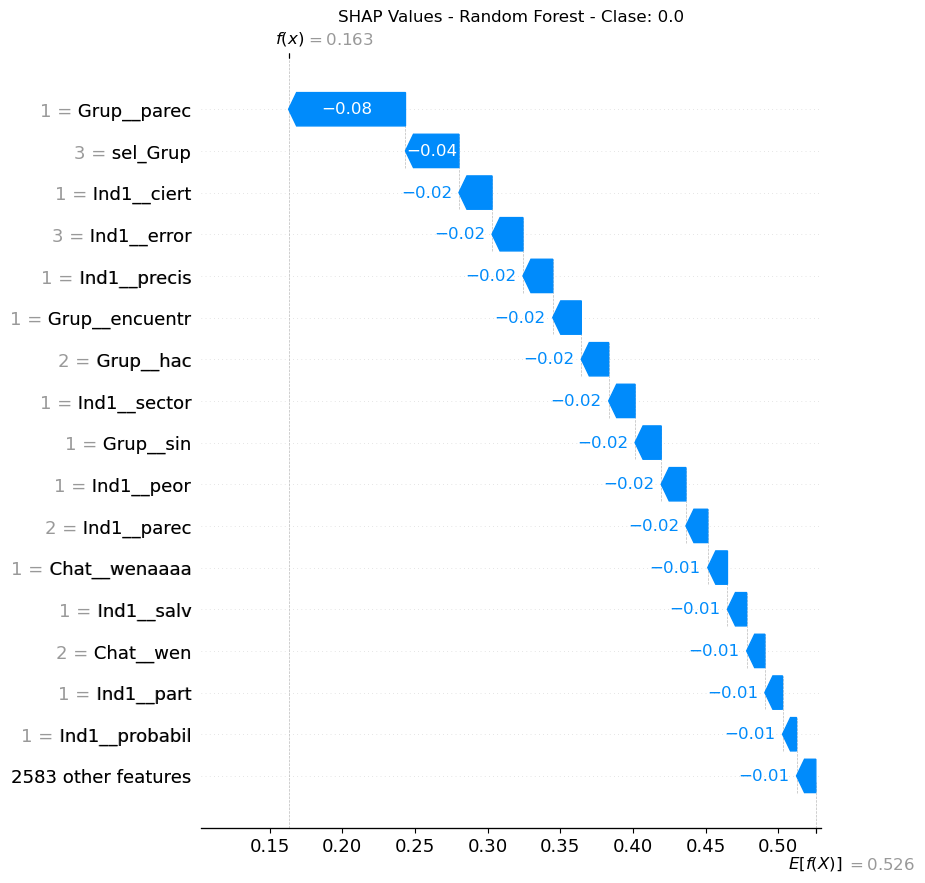

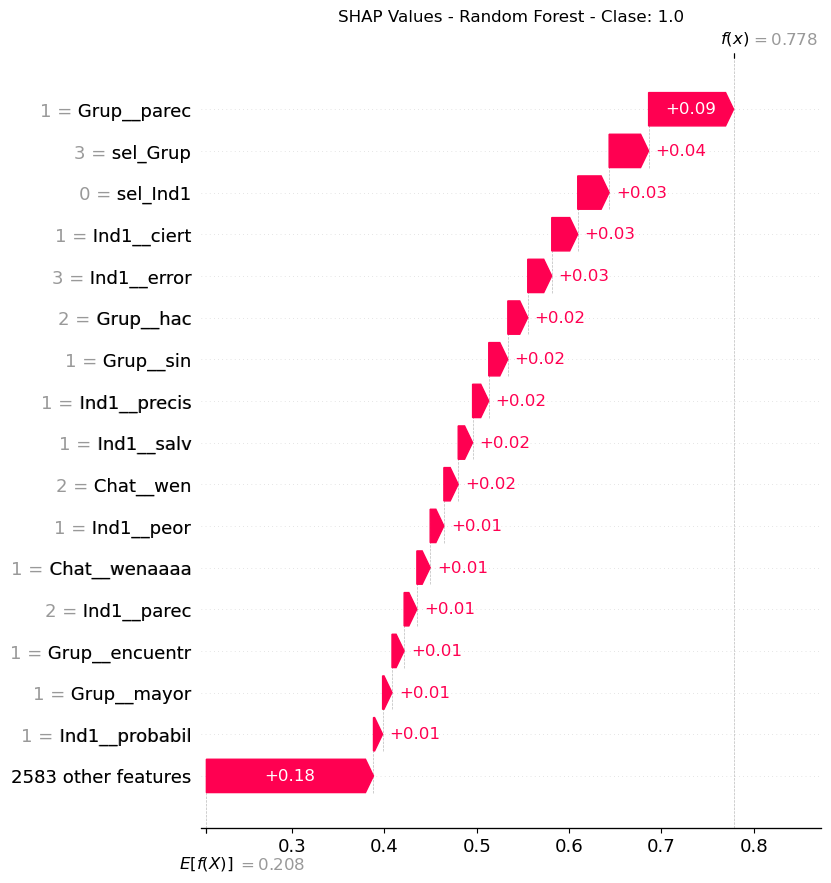

In [75]:
idx=1

individual_explanation(idx, rf_best_model, df_train, 'SHAP Values - Random Forest')

[19:51:30] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\c_api\c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


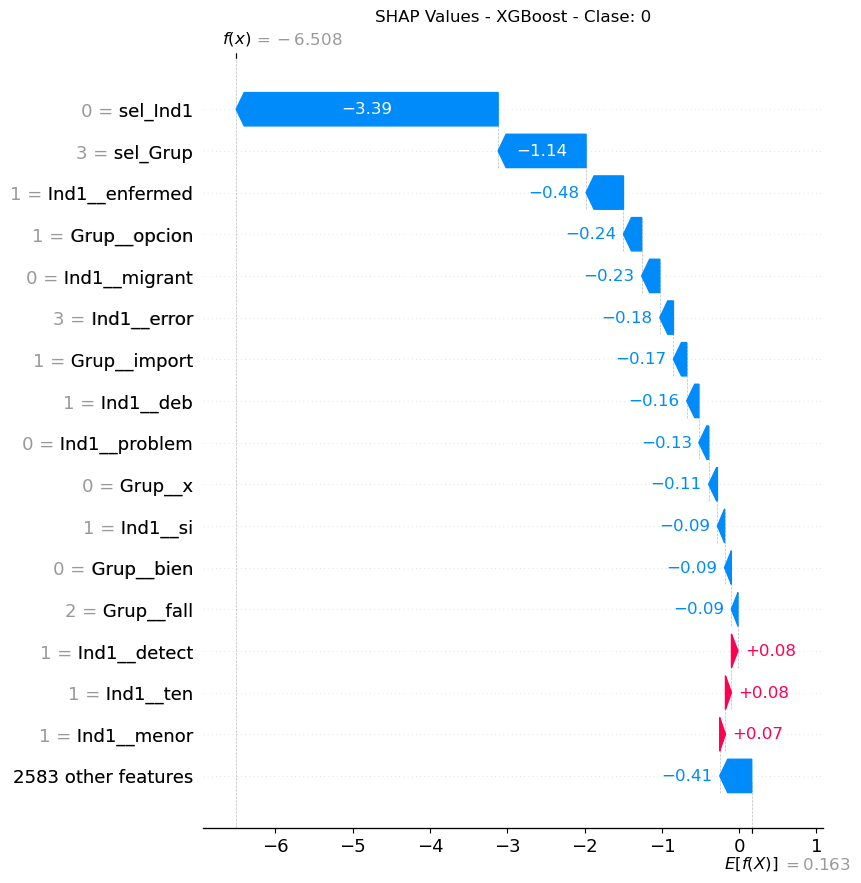

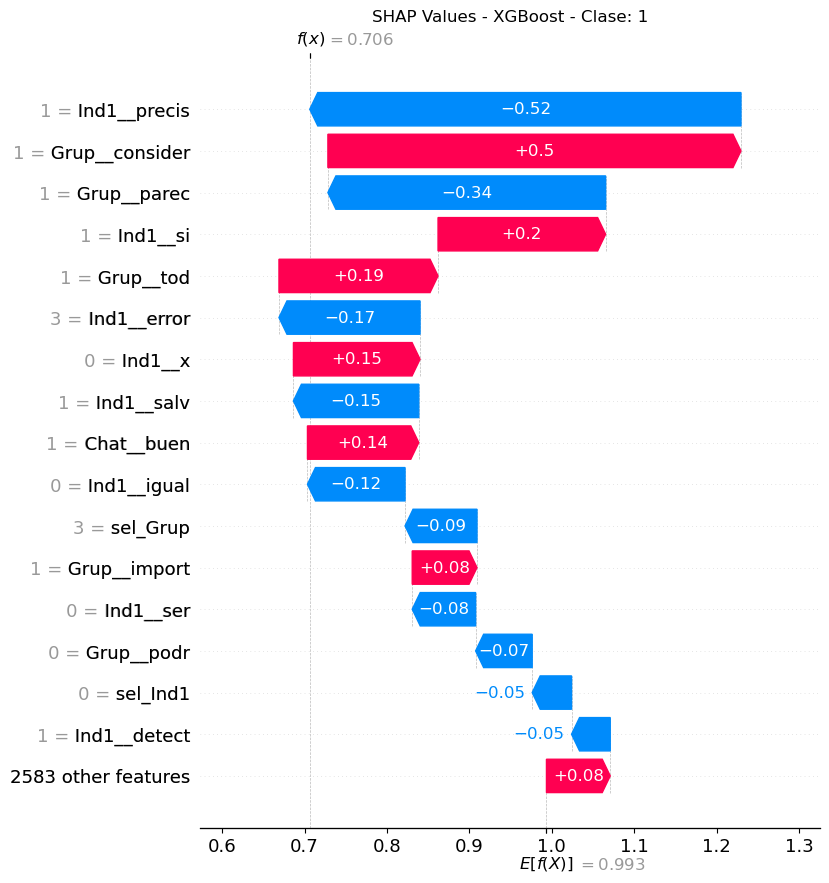

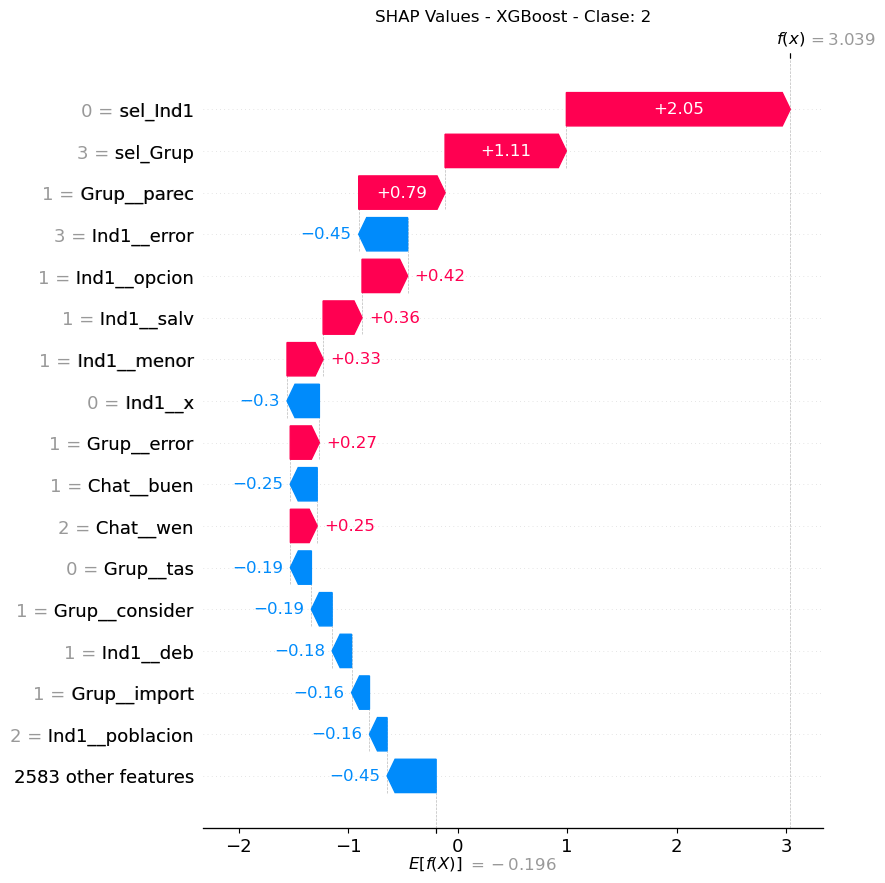

In [76]:
idx=1

individual_explanation(idx, xgb_best_model, df_train, 'SHAP Values - XGBoost')

# Diferencial 2

In [77]:
dataset = pd.read_csv(f'dataset_{caso}_2.csv')

## Modelo base

In [78]:
df_train, df_test, y_train, y_test, categorical_preprocessing, text_preprocessing = preprocessing(
    dataset,
    gender=False, 
    comment_Ind2=True, 
    sel_Ind1=True
)
df_train

,sel_Ind1,sel_Grup,Ind1__1,Ind1__10,Ind1__100,Ind1__100000,Ind1__15,Ind1__2,Ind1__2da,Ind1__3,...,Chat__wenass,Chat__wifi,Chat__wol,Chat__x,Chat__x2,Chat__x3,Chat__xat,Chat__xd,Chat__ª,Chat__ö
132,2.0,1.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
490,0.0,0.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
97,1.0,2.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
459,0.0,1.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
230,2.0,0.0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
438,0.0,2.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
436,4.0,3.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
33,5.0,2.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
190,1.0,2.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [79]:
categorical_preprocessing

ColumnTransformer(transformers=[('sel_etapa',
                                 Pipeline(steps=[('ordinal_encoder',
                                                  OrdinalEncoder())]),
                                 ['sel_Ind1', 'sel_Grup', 'sel_Ind2'])])

In [80]:
text_preprocessing

ColumnTransformer(transformers=[('Ind1',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x0000018790C2A9B0>),
                                 'comment_Ind1'),
                                ('Grup',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x0000018790C2A9B0>),
                                 'comment_Grup'),
                                ('Ind2',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x0000018790C2A9B0>),
                                 'comment_Ind2'),
                                ('Chat',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x0000018790C2A9B0>),
                                 'summary')])

In [81]:
df_train

,sel_Ind1,sel_Grup,Ind1__1,Ind1__10,Ind1__100,Ind1__100000,Ind1__15,Ind1__2,Ind1__2da,Ind1__3,...,Chat__wenass,Chat__wifi,Chat__wol,Chat__x,Chat__x2,Chat__x3,Chat__xat,Chat__xd,Chat__ª,Chat__ö
132,2.0,1.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
490,0.0,0.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
97,1.0,2.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
459,0.0,1.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
230,2.0,0.0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
438,0.0,2.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
436,4.0,3.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
33,5.0,2.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
190,1.0,2.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [82]:
dummy_model, rf_best_model, xgb_best_model = train_models(df_train, df_test, y_train, y_test, grid_rf, grid_xgb)

Dummy classifier
              precision    recall  f1-score   support

        -1.0       0.00      0.00      0.00        27
         0.0       0.47      1.00      0.64        47
         1.0       0.00      0.00      0.00        26

    accuracy                           0.47       100
   macro avg       0.16      0.33      0.21       100
weighted avg       0.22      0.47      0.30       100

Random Forest classifier
Best Hyperparameters: {'max_depth': 30, 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 100}
              precision    recall  f1-score   support

        -1.0       0.58      0.26      0.36        27
         0.0       0.48      0.89      0.63        47
         1.0       1.00      0.04      0.07        26

    accuracy                           0.50       100
   macro avg       0.69      0.40      0.35       100
weighted avg       0.64      0.50      0.41       100

XGBoost classifier
Best Hyperparameters: {'max_leaves': 20, 'min_child_weight': 1, 'n_e

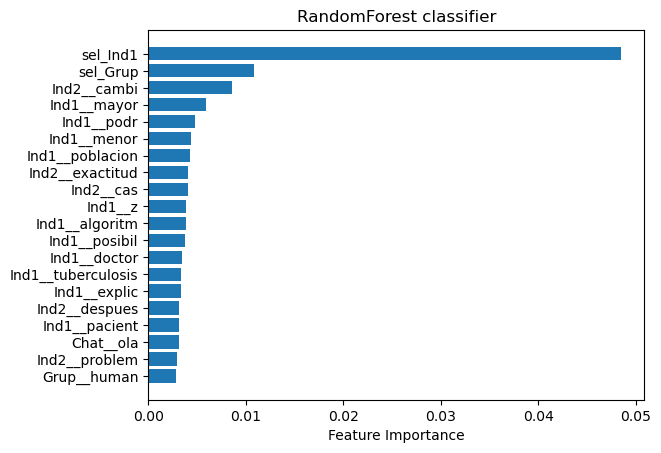

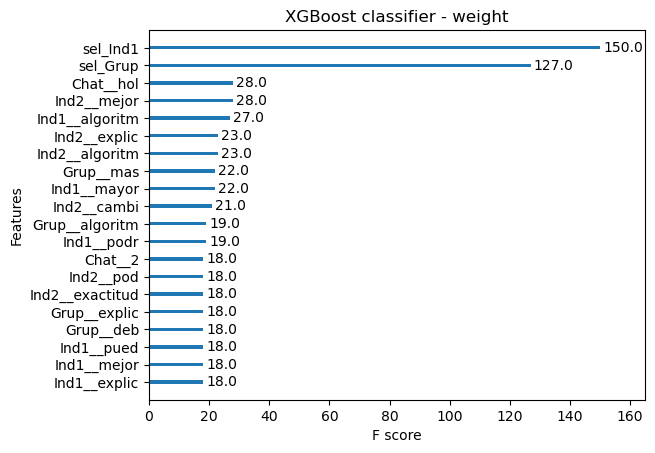

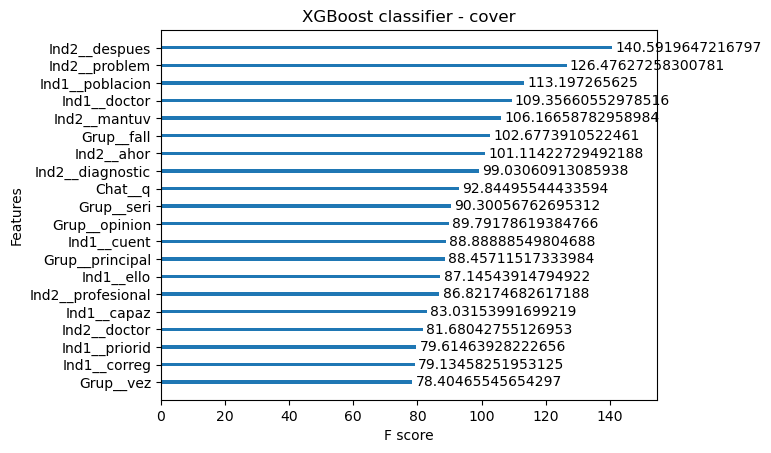

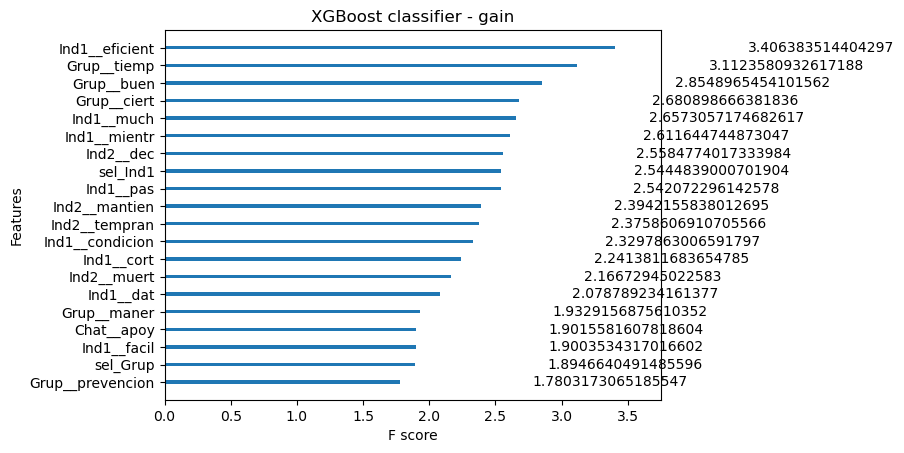

In [83]:
plot_importance_models(rf_best_model, xgb_best_model)

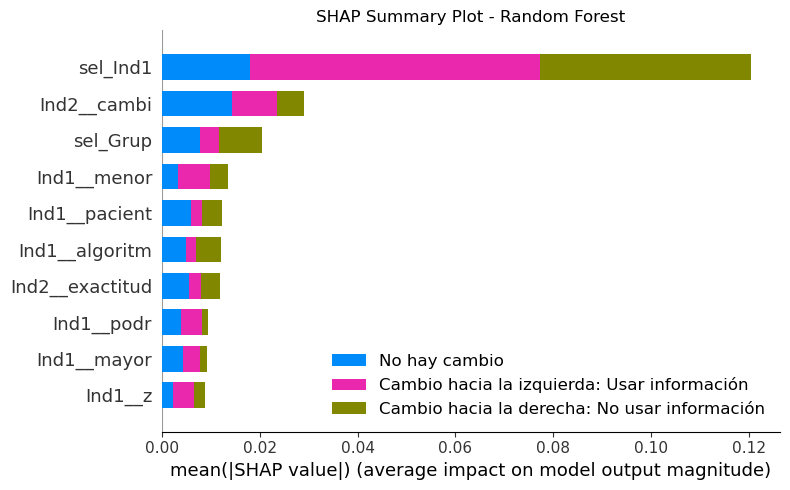

In [84]:
summary_plot(rf_best_model, df_train, 'SHAP Summary Plot - Random Forest', df=2)

[19:55:56] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\c_api\c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


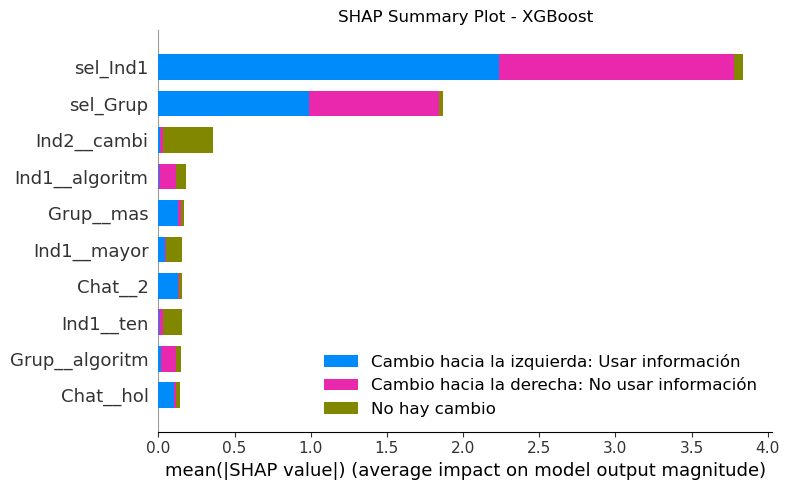

In [85]:
summary_plot(xgb_best_model, df_train, 'SHAP Summary Plot - XGBoost', df=2)

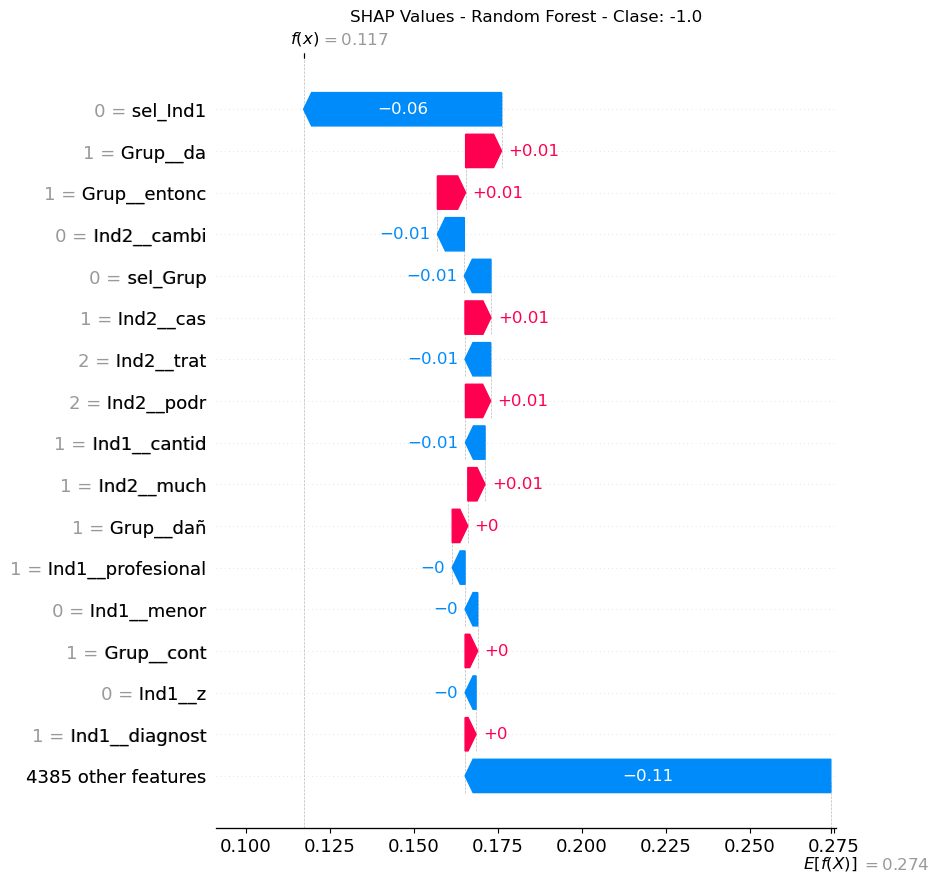

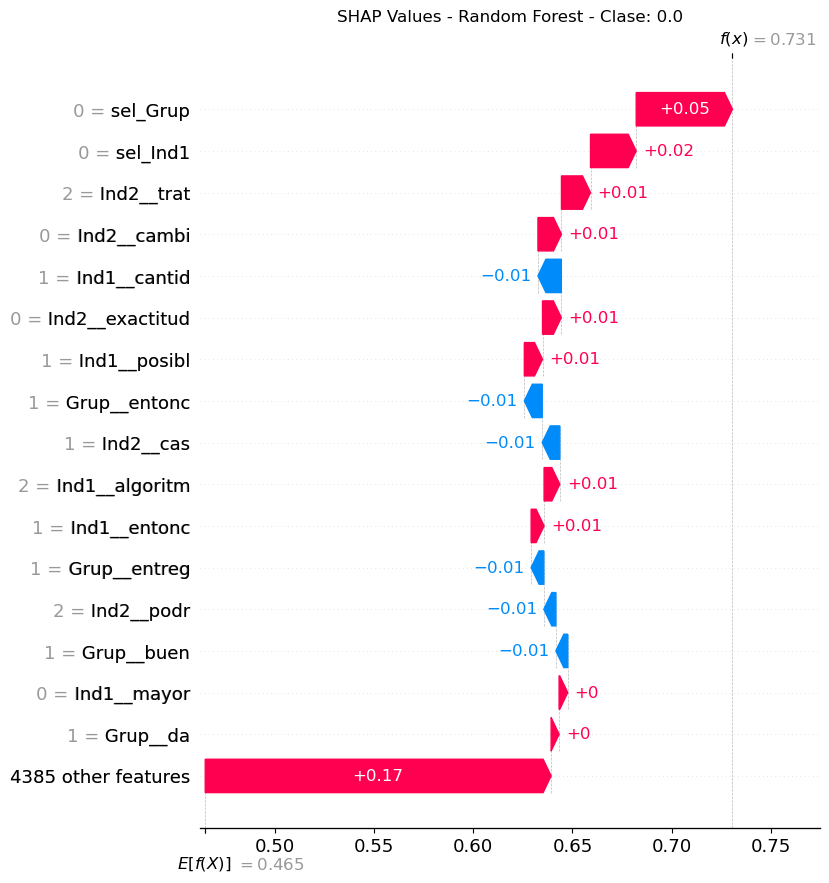

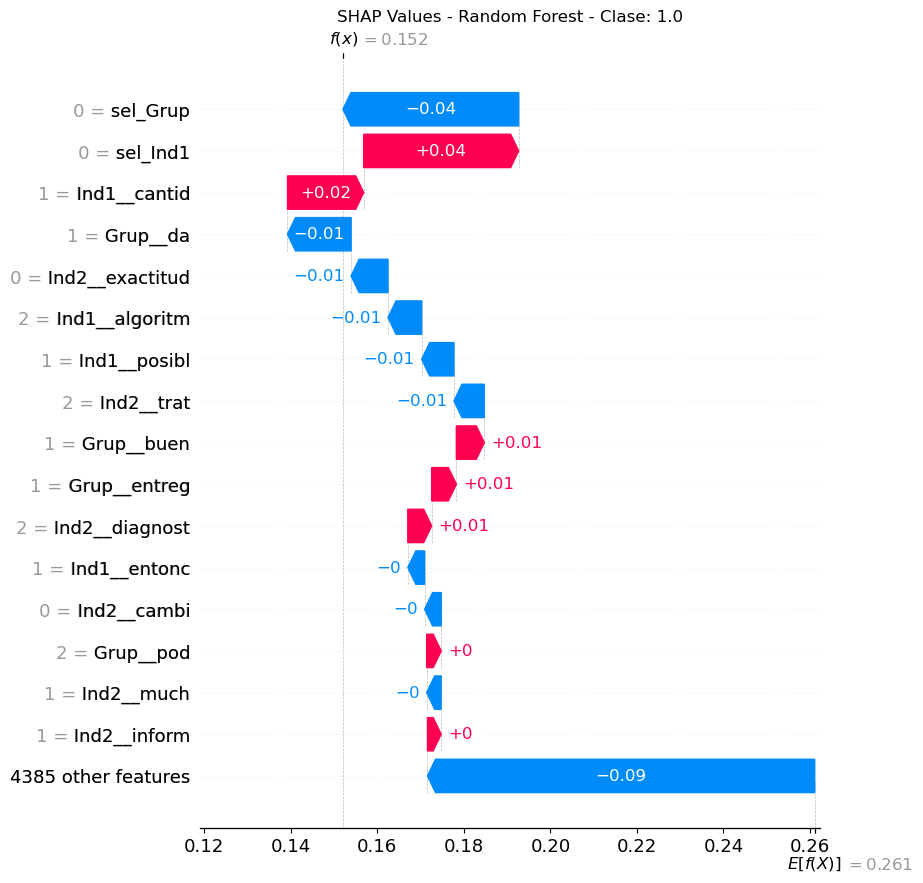

In [86]:
idx=1

individual_explanation(idx, rf_best_model, df_train, 'SHAP Values - Random Forest')

[19:56:05] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\c_api\c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


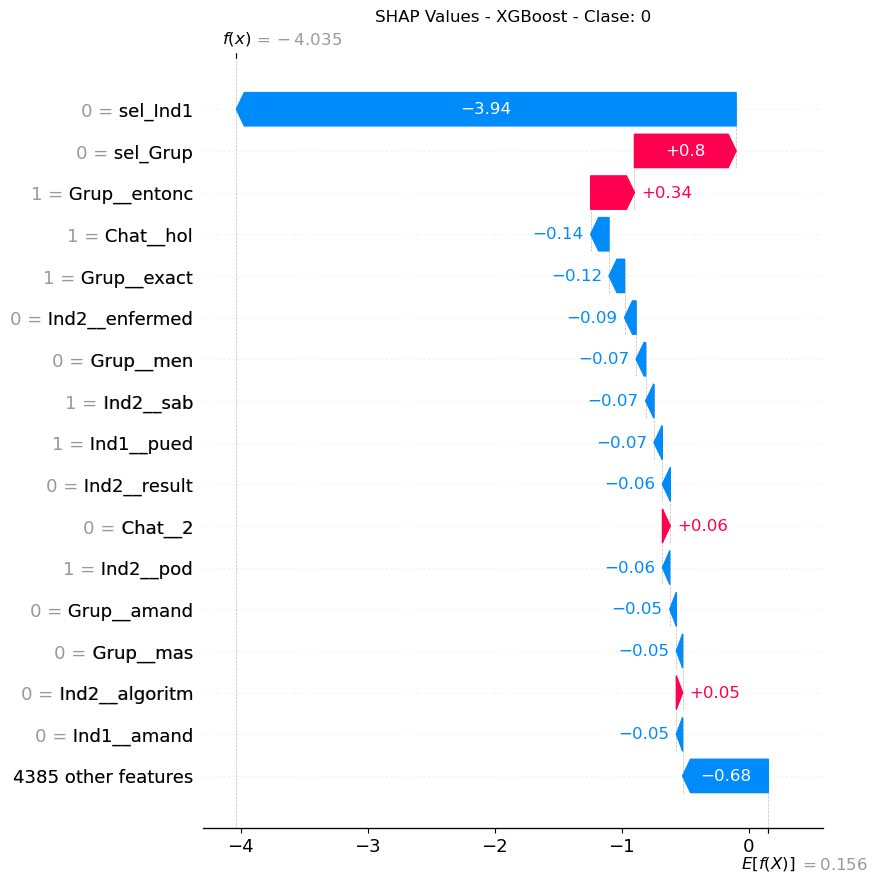

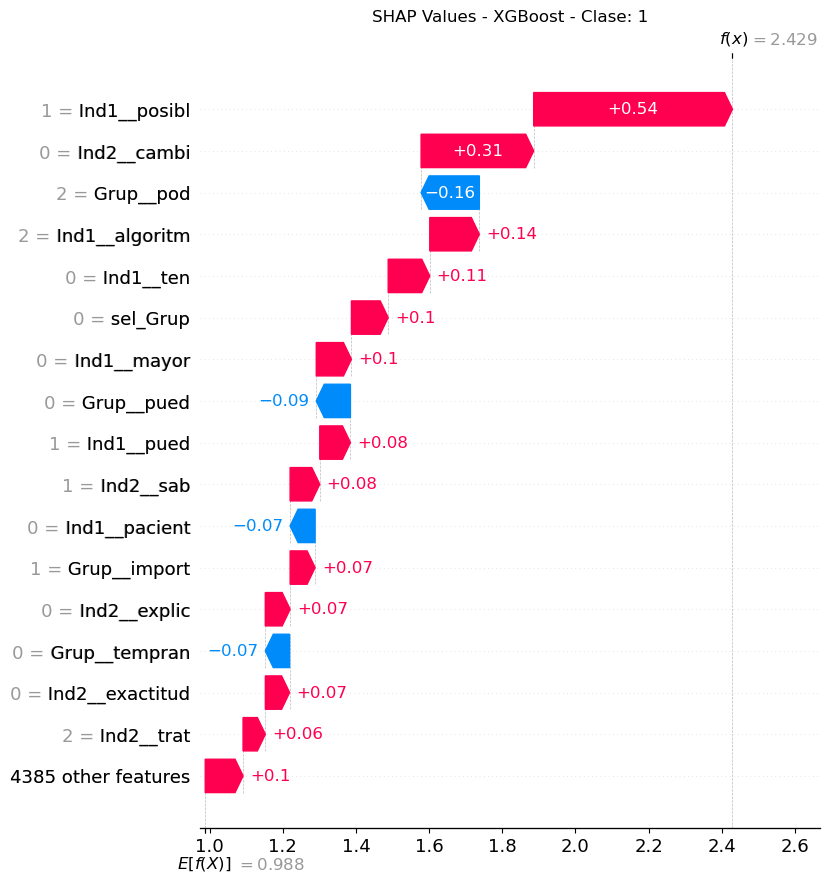

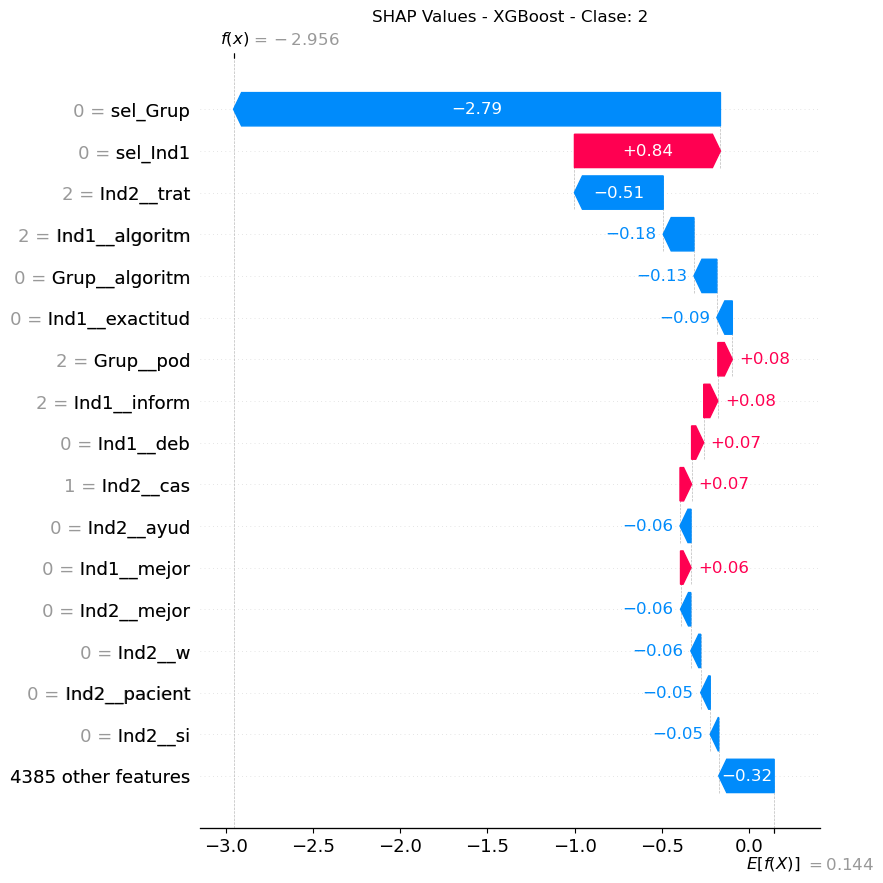

In [87]:
idx=1

individual_explanation(idx, xgb_best_model, df_train, 'SHAP Values - XGBoost')

## Modelo 2. Agregar género

In [88]:
df_train, df_test, y_train, y_test, categorical_preprocessing, text_preprocessing = preprocessing(
    dataset,
    gender=True, 
    comment_Ind2=True, 
    sel_Ind1=True
)
df_train

,sel_Ind1,sel_Grup,gender:M,gender:F,gender:O,Ind1__1,Ind1__10,Ind1__100,Ind1__100000,Ind1__15,...,Chat__wenass,Chat__wifi,Chat__wol,Chat__x,Chat__x2,Chat__x3,Chat__xat,Chat__xd,Chat__ª,Chat__ö
132,2.0,1.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
490,0.0,0.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
97,1.0,2.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
459,0.0,1.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
230,2.0,0.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
438,0.0,2.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
436,4.0,3.0,0.0,1.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
33,5.0,2.0,0.0,1.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
190,1.0,2.0,0.0,1.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [89]:
categorical_preprocessing

ColumnTransformer(transformers=[('sel_etapa',
                                 Pipeline(steps=[('ordinal_encoder',
                                                  OrdinalEncoder())]),
                                 ['sel_Ind1', 'sel_Grup', 'sel_Ind2']),
                                ('gender',
                                 Pipeline(steps=[('extract',
                                                  ColumnExtractor(columns=['gender'])),
                                                 ('onehot_encoder',
                                                  OneHotEncoder(categories=[['M',
                                                                             'F',
                                                                             'O']],
                                                                sparse_output=False))]),
                                 ['gender'])])

In [90]:
text_preprocessing

ColumnTransformer(transformers=[('Ind1',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x000001879177D660>),
                                 'comment_Ind1'),
                                ('Grup',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x000001879177D660>),
                                 'comment_Grup'),
                                ('Ind2',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x000001879177D660>),
                                 'comment_Ind2'),
                                ('Chat',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x000001879177D660>),
                                 'summary')])

In [91]:
dummy_model, rf_best_model, xgb_best_model = train_models(df_train, df_test, y_train, y_test, grid_rf, grid_xgb)

Dummy classifier
              precision    recall  f1-score   support

        -1.0       0.00      0.00      0.00        27
         0.0       0.47      1.00      0.64        47
         1.0       0.00      0.00      0.00        26

    accuracy                           0.47       100
   macro avg       0.16      0.33      0.21       100
weighted avg       0.22      0.47      0.30       100

Random Forest classifier
Best Hyperparameters: {'max_depth': 20, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
              precision    recall  f1-score   support

        -1.0       0.60      0.11      0.19        27
         0.0       0.47      0.94      0.63        47
         1.0       0.50      0.04      0.07        26

    accuracy                           0.48       100
   macro avg       0.52      0.36      0.30       100
weighted avg       0.51      0.48      0.36       100

XGBoost classifier
Best Hyperparameters: {'max_leaves': 20, 'min_child_weight': 1, 'n_es

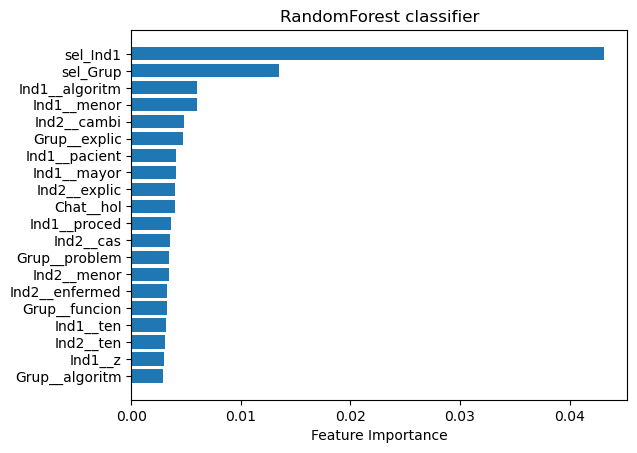

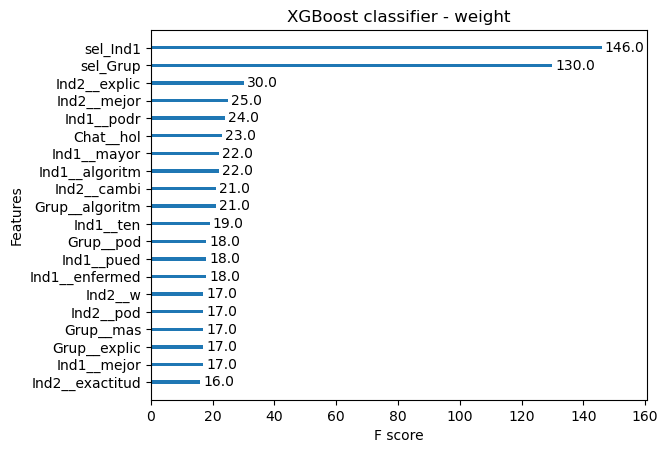

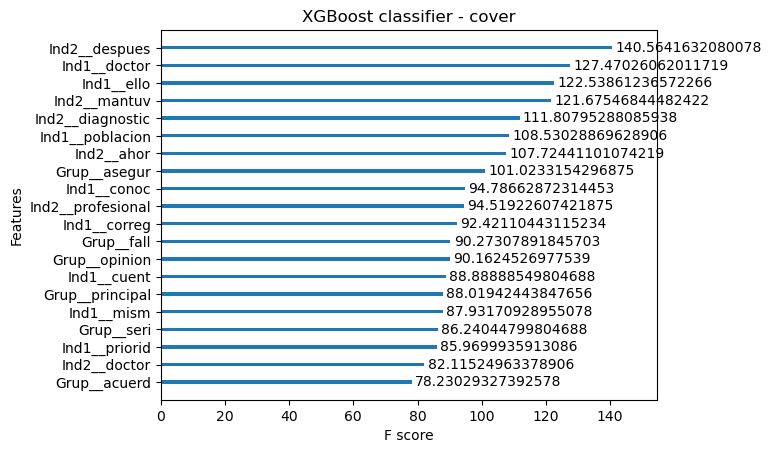

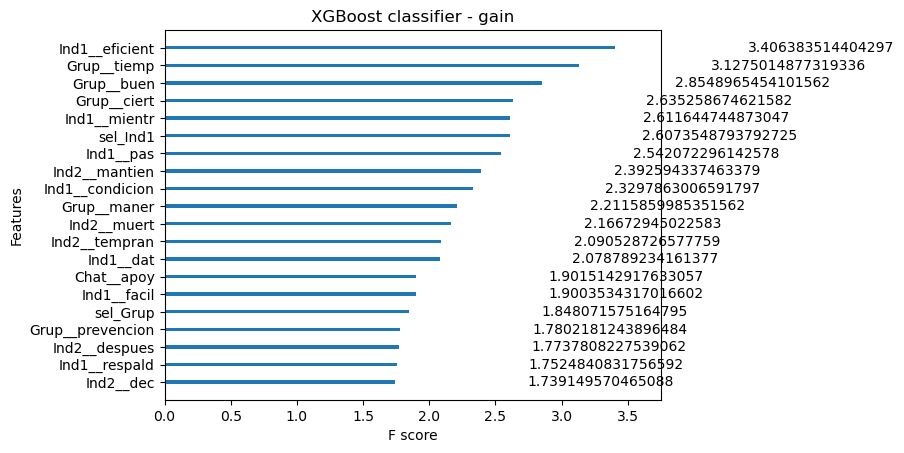

In [92]:
plot_importance_models(rf_best_model, xgb_best_model)

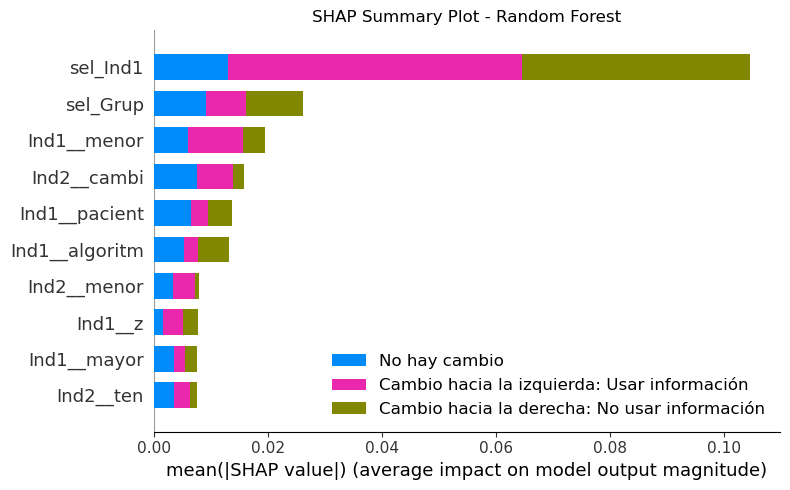

In [93]:
summary_plot(rf_best_model, df_train, 'SHAP Summary Plot - Random Forest', df=2)

[20:00:33] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\c_api\c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


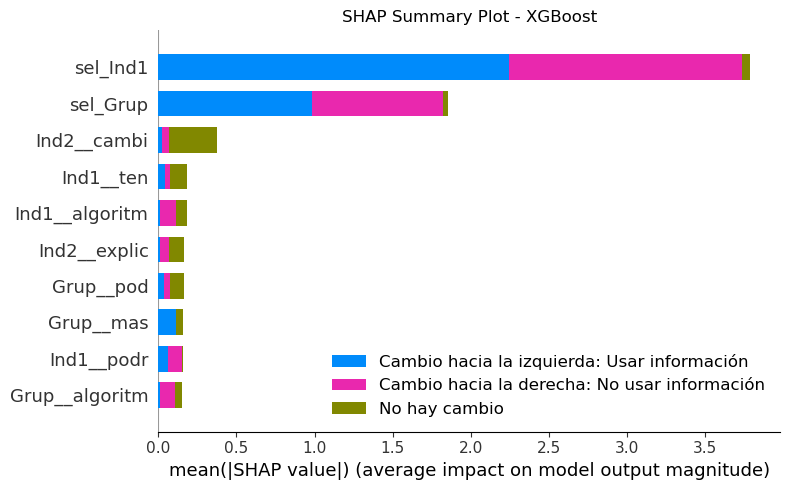

In [94]:
summary_plot(xgb_best_model, df_train, 'SHAP Summary Plot - XGBoost', df=2)

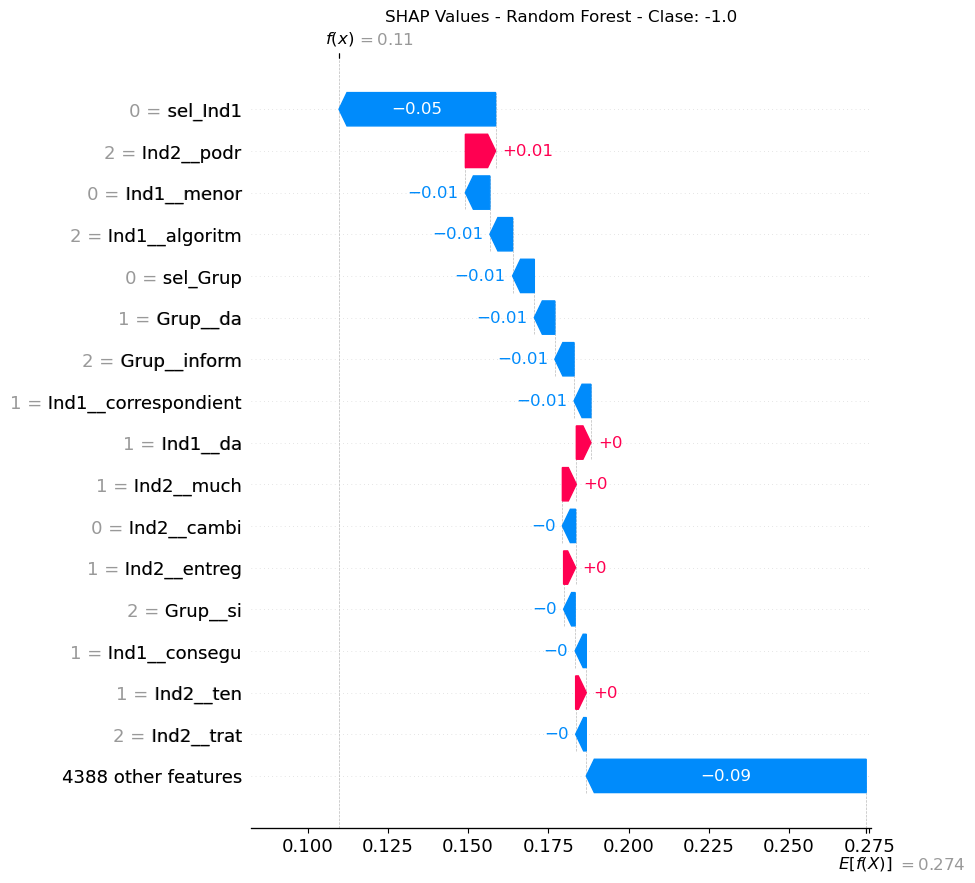

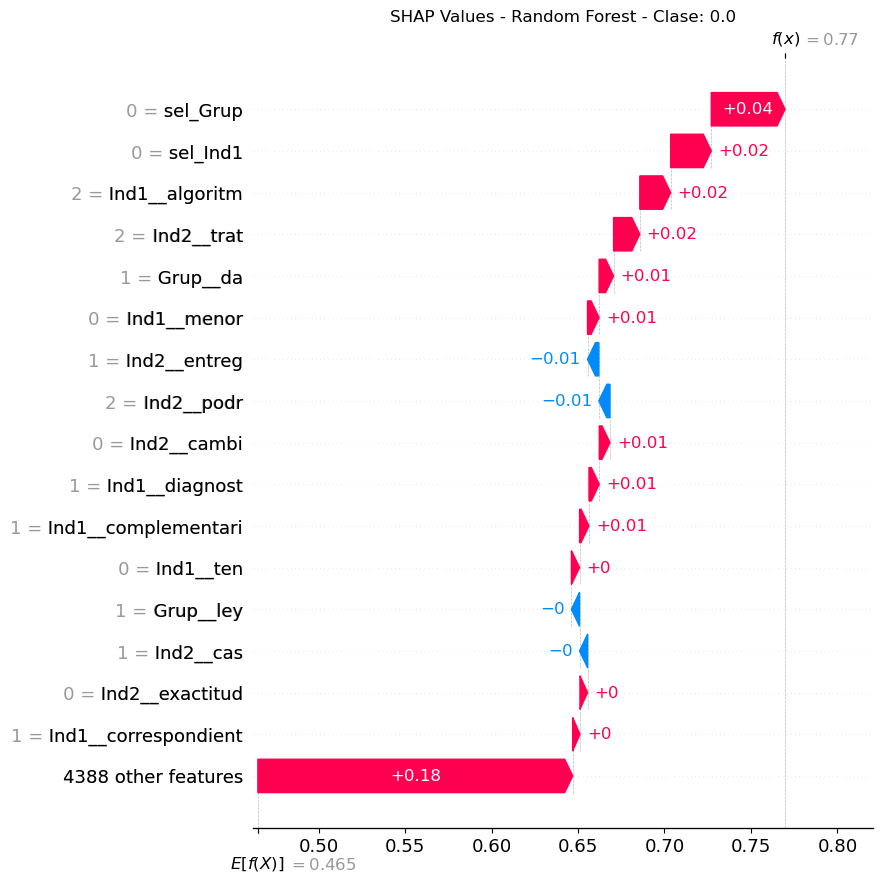

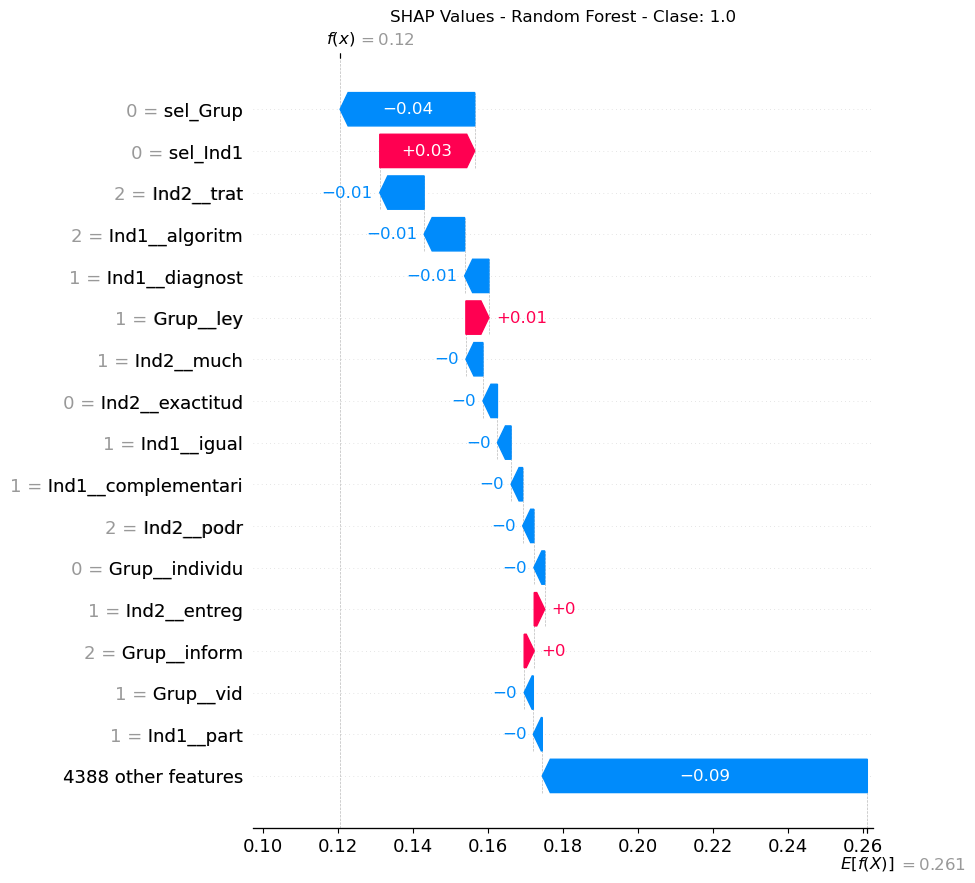

In [95]:
idx=1

individual_explanation(idx, rf_best_model, df_train, 'SHAP Values - Random Forest')

[20:00:40] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\c_api\c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


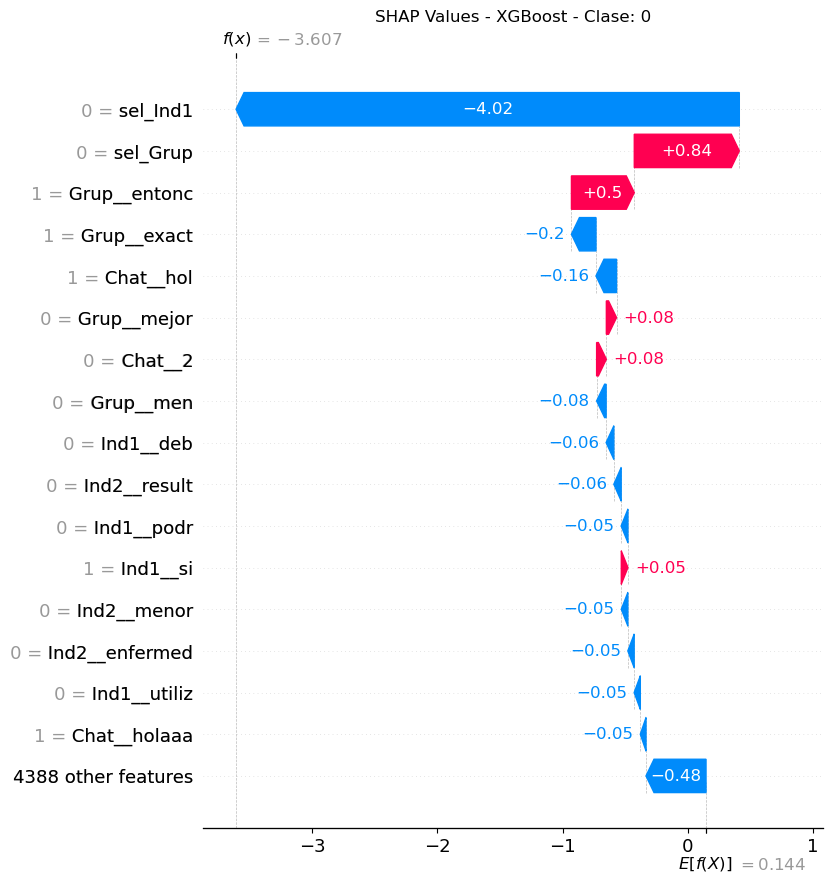

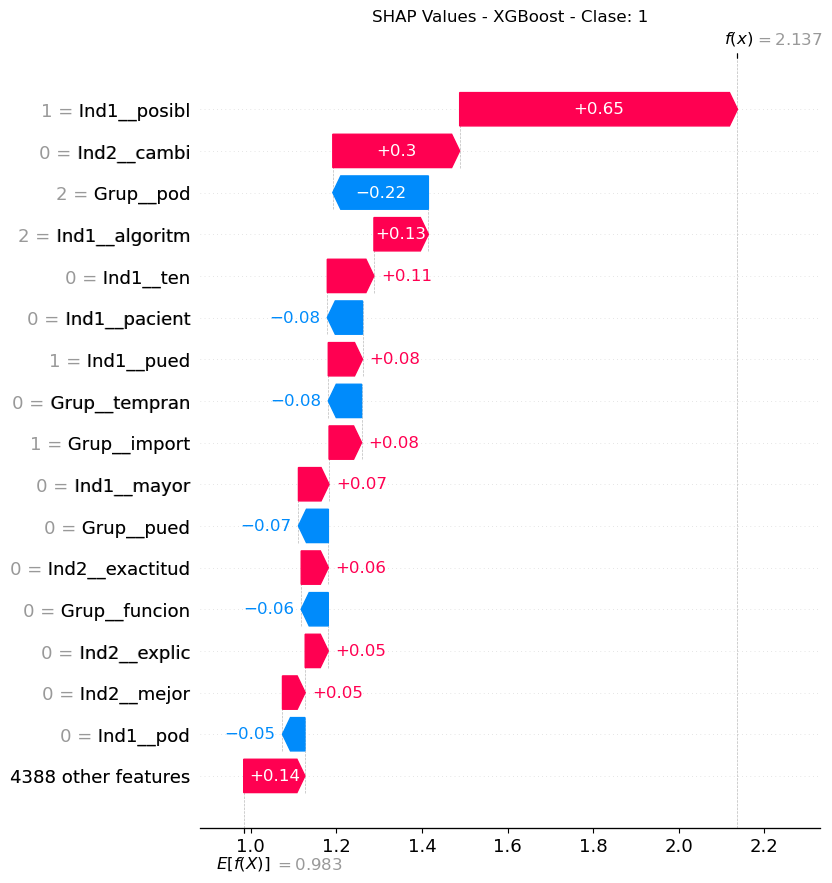

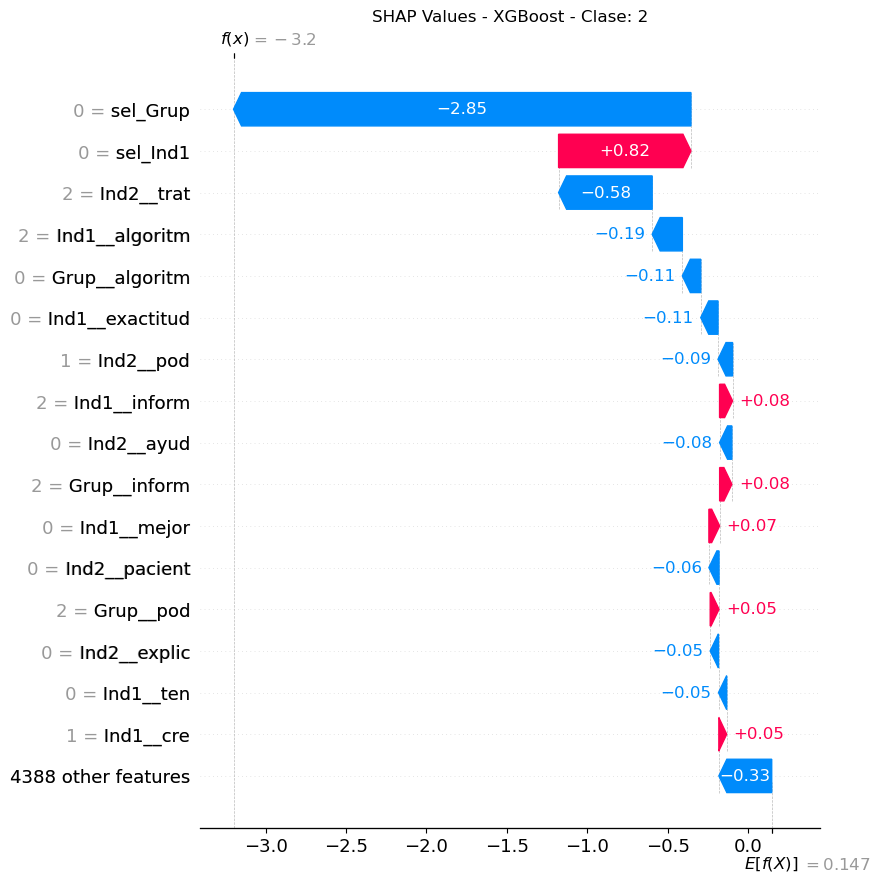

In [96]:
idx=1

individual_explanation(idx, xgb_best_model, df_train, 'SHAP Values - XGBoost')

## Modelo 3. Quitar selección 1

In [97]:
df_train, df_test, y_train, y_test, categorical_preprocessing, text_preprocessing = preprocessing(
    dataset,
    gender=True, 
    comment_Ind2=True, 
    sel_Ind1=False
)
df_train

,sel_Grup,gender:M,gender:F,gender:O,Ind1__1,Ind1__10,Ind1__100,Ind1__100000,Ind1__15,Ind1__2,...,Chat__wenass,Chat__wifi,Chat__wol,Chat__x,Chat__x2,Chat__x3,Chat__xat,Chat__xd,Chat__ª,Chat__ö
132,1.0,1.0,0.0,0.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
490,0.0,1.0,0.0,0.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
97,2.0,1.0,0.0,0.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
459,1.0,1.0,0.0,0.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
230,0.0,1.0,0.0,0.0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
438,2.0,1.0,0.0,0.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
436,3.0,0.0,1.0,0.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
33,2.0,0.0,1.0,0.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
190,2.0,0.0,1.0,0.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [98]:
categorical_preprocessing

ColumnTransformer(transformers=[('sel_etapa',
                                 Pipeline(steps=[('ordinal_encoder',
                                                  OrdinalEncoder())]),
                                 ['sel_Ind1', 'sel_Grup', 'sel_Ind2']),
                                ('gender',
                                 Pipeline(steps=[('extract',
                                                  ColumnExtractor(columns=['gender'])),
                                                 ('onehot_encoder',
                                                  OneHotEncoder(categories=[['M',
                                                                             'F',
                                                                             'O']],
                                                                sparse_output=False))]),
                                 ['gender'])])

In [99]:
text_preprocessing

ColumnTransformer(transformers=[('Ind1',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x0000018798FD6170>),
                                 'comment_Ind1'),
                                ('Grup',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x0000018798FD6170>),
                                 'comment_Grup'),
                                ('Ind2',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x0000018798FD6170>),
                                 'comment_Ind2'),
                                ('Chat',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x0000018798FD6170>),
                                 'summary')])

In [100]:
dummy_model, rf_best_model, xgb_best_model = train_models(df_train, df_test, y_train, y_test, grid_rf, grid_xgb)

Dummy classifier
              precision    recall  f1-score   support

        -1.0       0.00      0.00      0.00        27
         0.0       0.47      1.00      0.64        47
         1.0       0.00      0.00      0.00        26

    accuracy                           0.47       100
   macro avg       0.16      0.33      0.21       100
weighted avg       0.22      0.47      0.30       100

Random Forest classifier
Best Hyperparameters: {'max_depth': 30, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 200}
              precision    recall  f1-score   support

        -1.0       1.00      0.04      0.07        27
         0.0       0.48      1.00      0.65        47
         1.0       1.00      0.08      0.14        26

    accuracy                           0.50       100
   macro avg       0.83      0.37      0.29       100
weighted avg       0.76      0.50      0.36       100

XGBoost classifier
Best Hyperparameters: {'max_leaves': 100, 'min_child_weight': 1, 'n_e

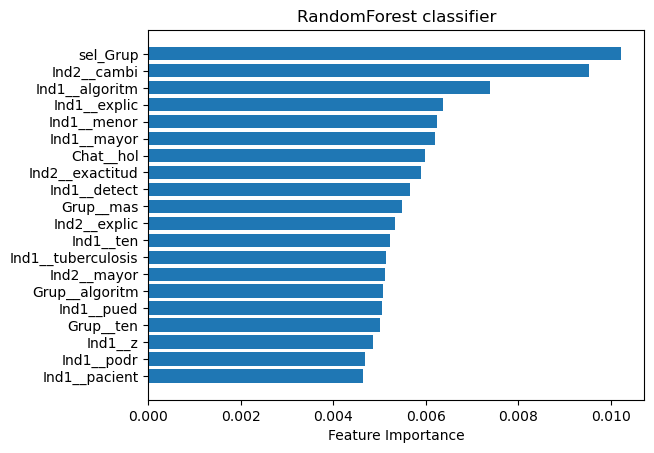

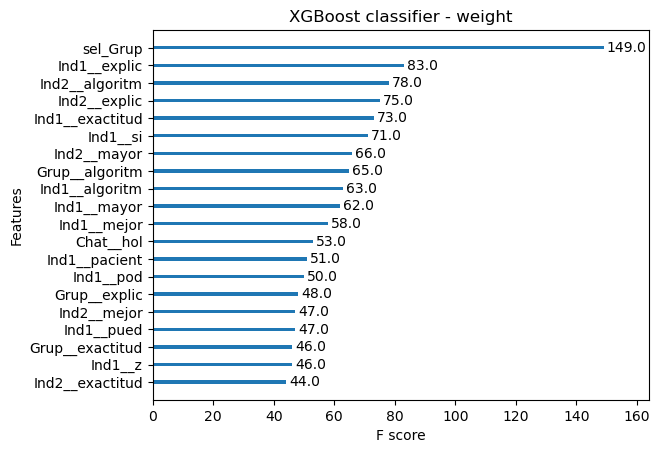

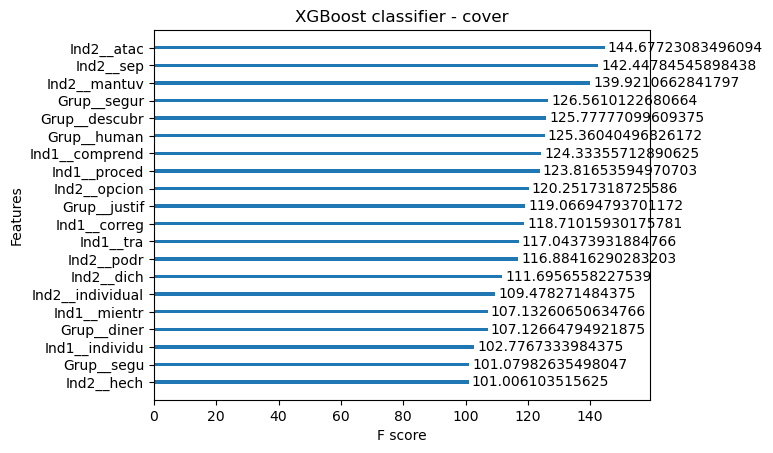

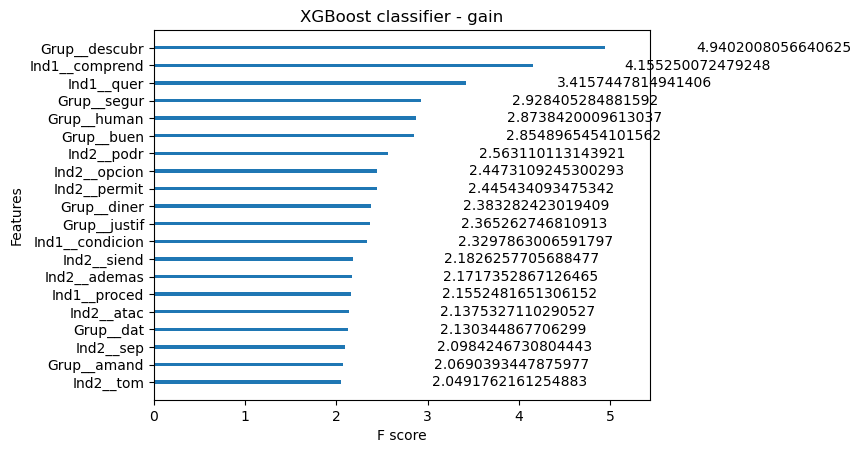

In [101]:
plot_importance_models(rf_best_model, xgb_best_model)

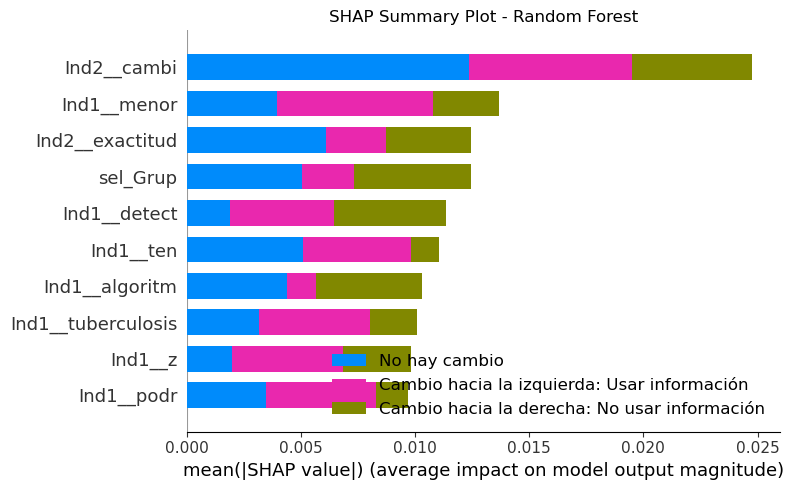

In [102]:
summary_plot(rf_best_model, df_train, 'SHAP Summary Plot - Random Forest', df=2)

[20:05:19] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\c_api\c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


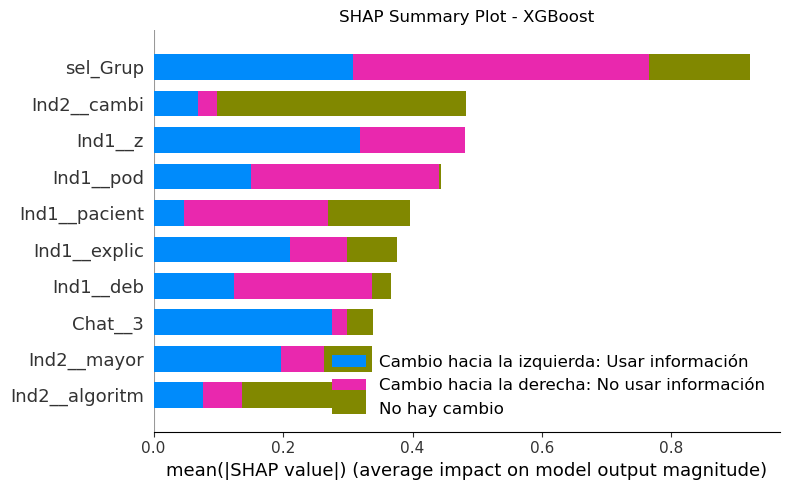

In [103]:
summary_plot(xgb_best_model, df_train, 'SHAP Summary Plot - XGBoost', df=2)

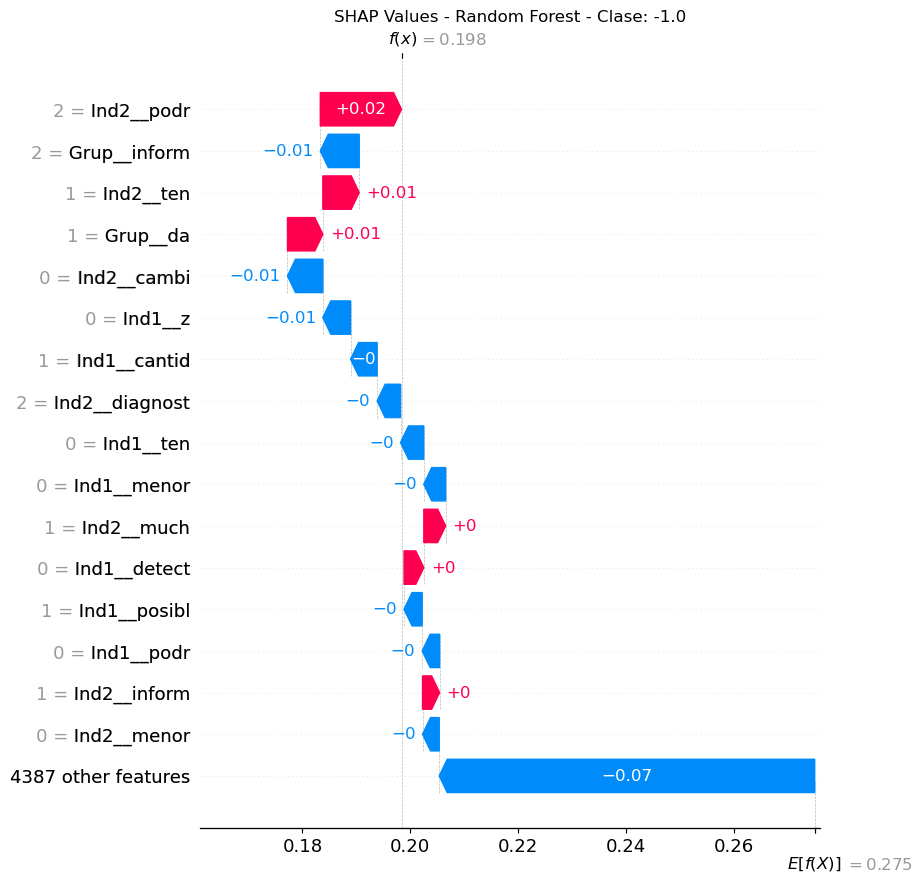

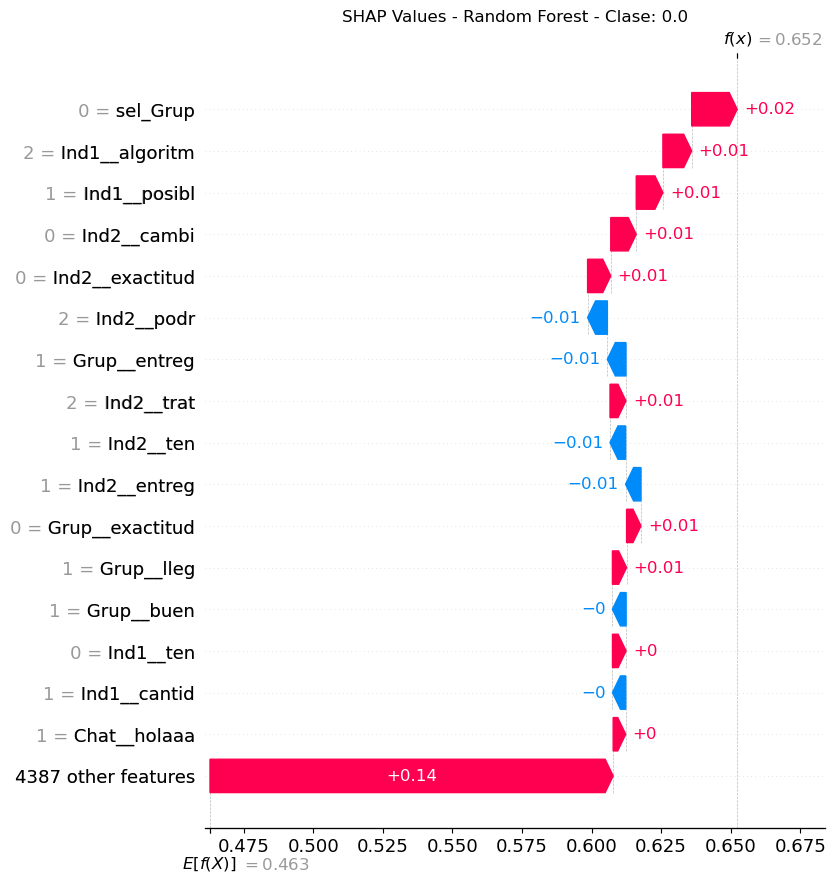

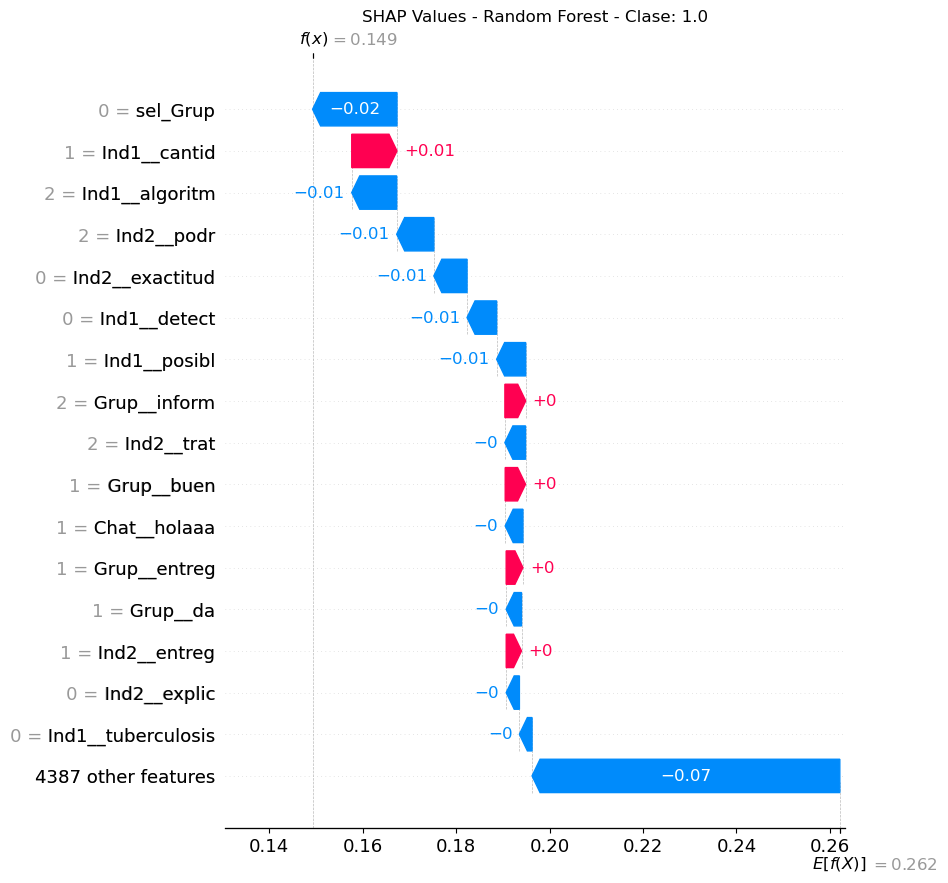

In [104]:
idx=1

individual_explanation(idx, rf_best_model, df_train, 'SHAP Values - Random Forest')

[20:05:33] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\c_api\c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


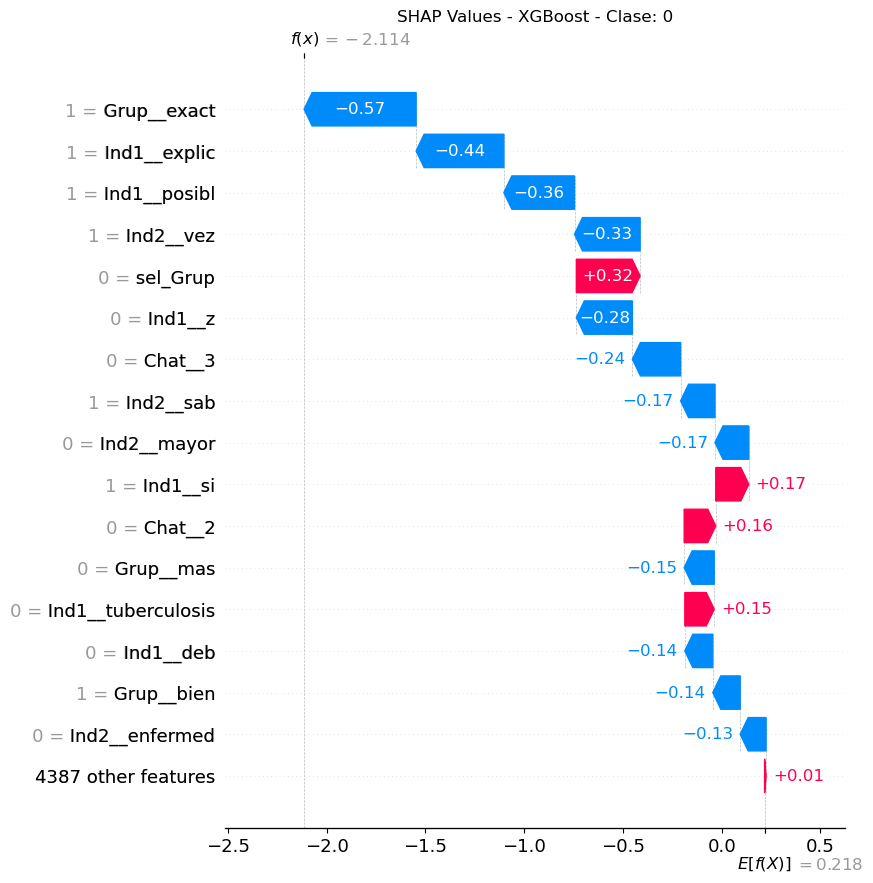

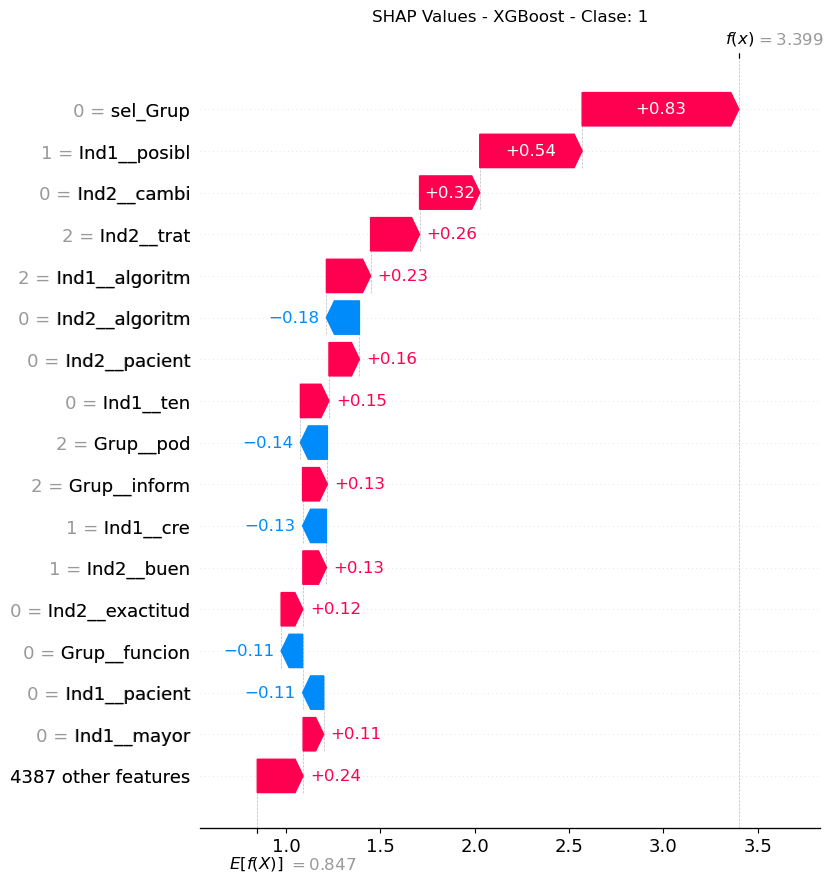

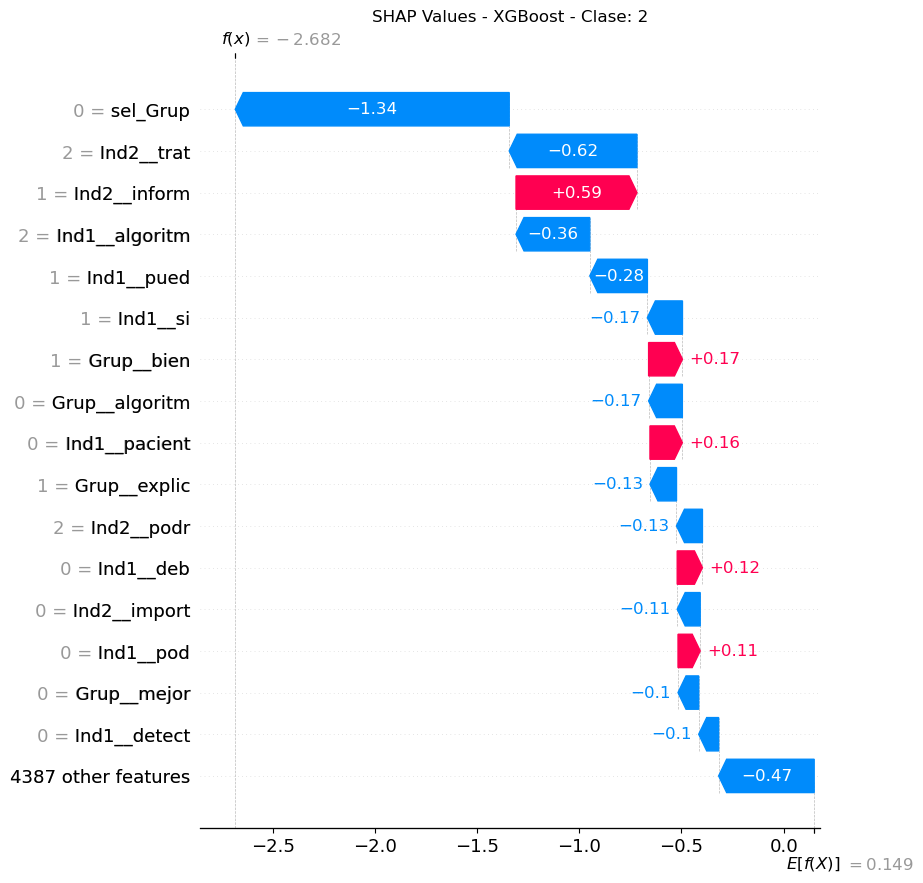

In [105]:
idx=1

individual_explanation(idx, xgb_best_model, df_train, 'SHAP Values - XGBoost')

## Modelo 4. Quitar justificación individual 2

In [106]:
df_train, df_test, y_train, y_test, categorical_preprocessing, text_preprocessing = preprocessing(
    dataset,
    gender=True, 
    comment_Ind2=False, 
    sel_Ind1=True
)
df_train

,sel_Ind1,sel_Grup,gender:M,gender:F,gender:O,Ind1__1,Ind1__10,Ind1__100,Ind1__100000,Ind1__15,...,Chat__wenass,Chat__wifi,Chat__wol,Chat__x,Chat__x2,Chat__x3,Chat__xat,Chat__xd,Chat__ª,Chat__ö
132,2.0,1.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
490,0.0,0.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
97,1.0,2.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
459,0.0,1.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
230,2.0,0.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
438,0.0,2.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
436,4.0,3.0,0.0,1.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
33,5.0,2.0,0.0,1.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
190,1.0,2.0,0.0,1.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [107]:
categorical_preprocessing

ColumnTransformer(transformers=[('sel_etapa',
                                 Pipeline(steps=[('ordinal_encoder',
                                                  OrdinalEncoder())]),
                                 ['sel_Ind1', 'sel_Grup', 'sel_Ind2']),
                                ('gender',
                                 Pipeline(steps=[('extract',
                                                  ColumnExtractor(columns=['gender'])),
                                                 ('onehot_encoder',
                                                  OneHotEncoder(categories=[['M',
                                                                             'F',
                                                                             'O']],
                                                                sparse_output=False))]),
                                 ['gender'])])

In [108]:
text_preprocessing

ColumnTransformer(transformers=[('Ind1',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x0000018790C58700>),
                                 'comment_Ind1'),
                                ('Grup',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x0000018790C58700>),
                                 'comment_Grup'),
                                ('Chat',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x0000018790C58700>),
                                 'summary')])

In [109]:
dummy_model, rf_best_model, xgb_best_model = train_models(df_train, df_test, y_train, y_test, grid_rf, grid_xgb)

Dummy classifier
              precision    recall  f1-score   support

        -1.0       0.00      0.00      0.00        27
         0.0       0.47      1.00      0.64        47
         1.0       0.00      0.00      0.00        26

    accuracy                           0.47       100
   macro avg       0.16      0.33      0.21       100
weighted avg       0.22      0.47      0.30       100

Random Forest classifier
Best Hyperparameters: {'max_depth': 30, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 100}
              precision    recall  f1-score   support

        -1.0       0.50      0.19      0.27        27
         0.0       0.47      0.87      0.61        47
         1.0       0.67      0.08      0.14        26

    accuracy                           0.48       100
   macro avg       0.55      0.38      0.34       100
weighted avg       0.53      0.48      0.40       100

XGBoost classifier
Best Hyperparameters: {'max_leaves': 100, 'min_child_weight': 1, 'n_e

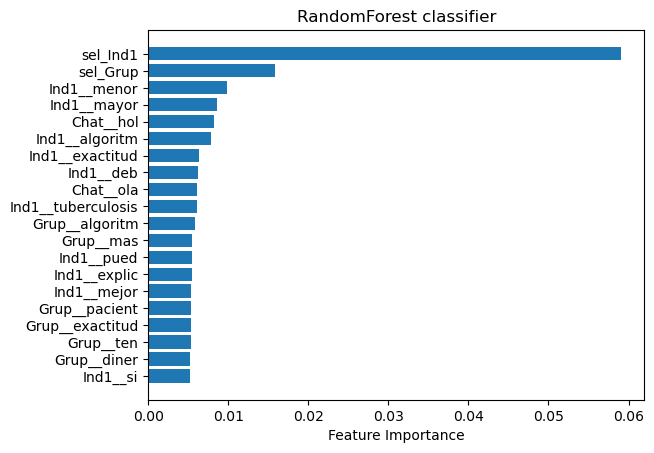

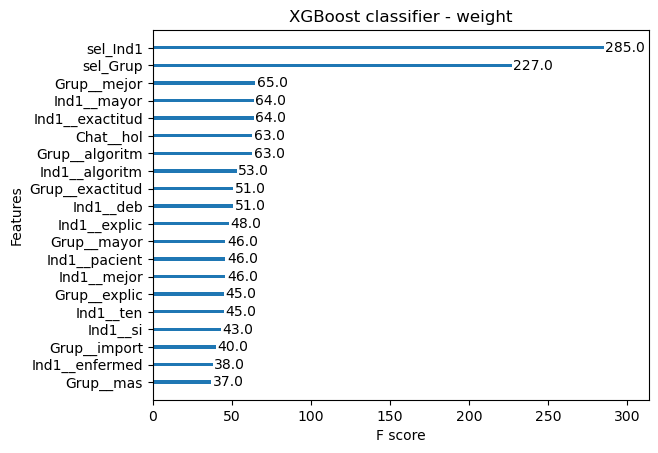

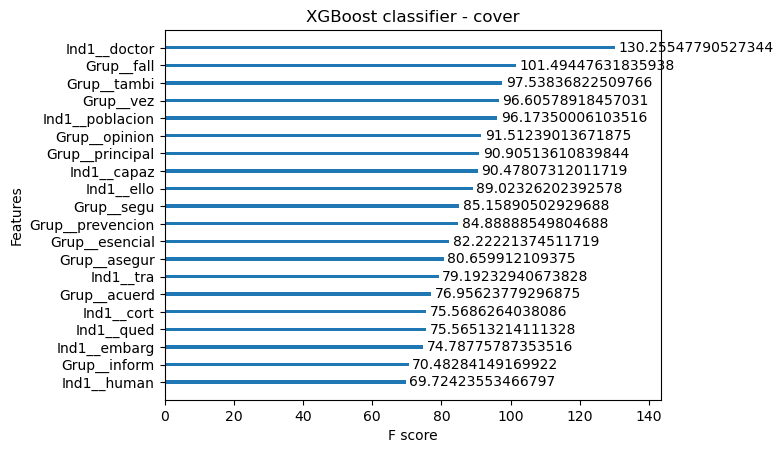

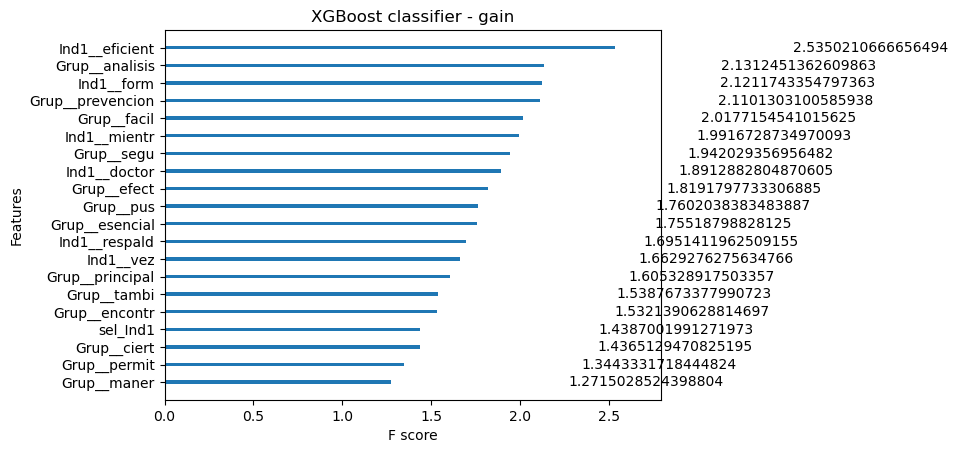

In [110]:
plot_importance_models(rf_best_model, xgb_best_model)

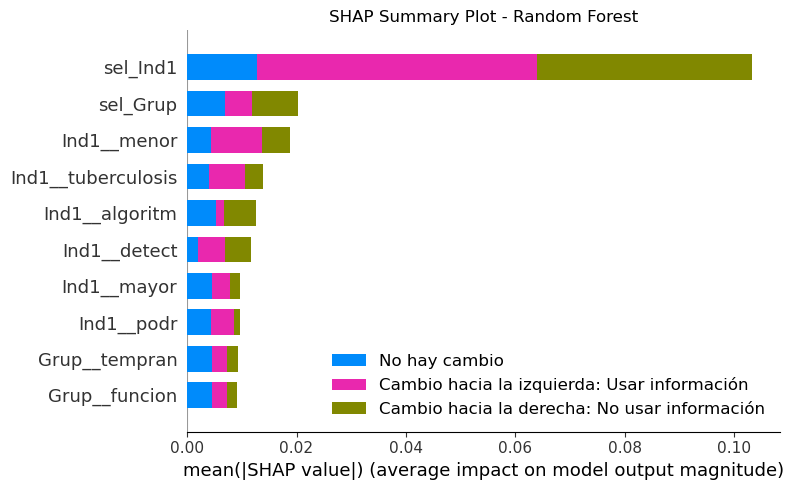

In [111]:
summary_plot(rf_best_model, df_train, 'SHAP Summary Plot - Random Forest', df=2)

[20:08:57] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\c_api\c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


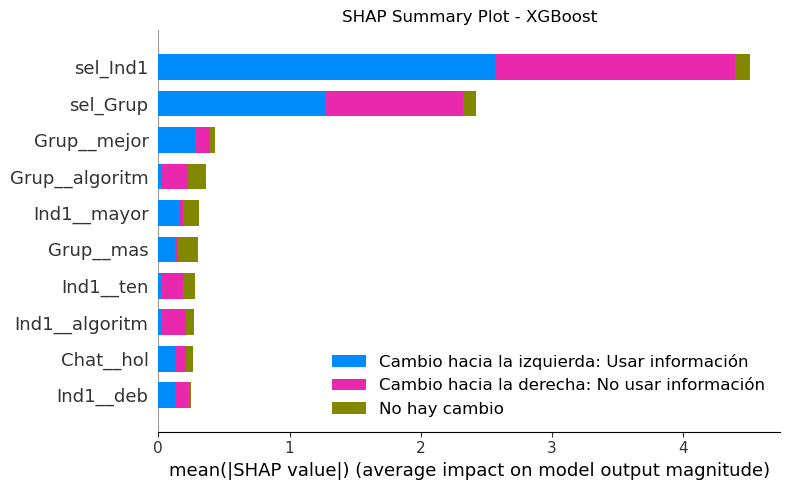

In [112]:
summary_plot(xgb_best_model, df_train, 'SHAP Summary Plot - XGBoost', df=2)

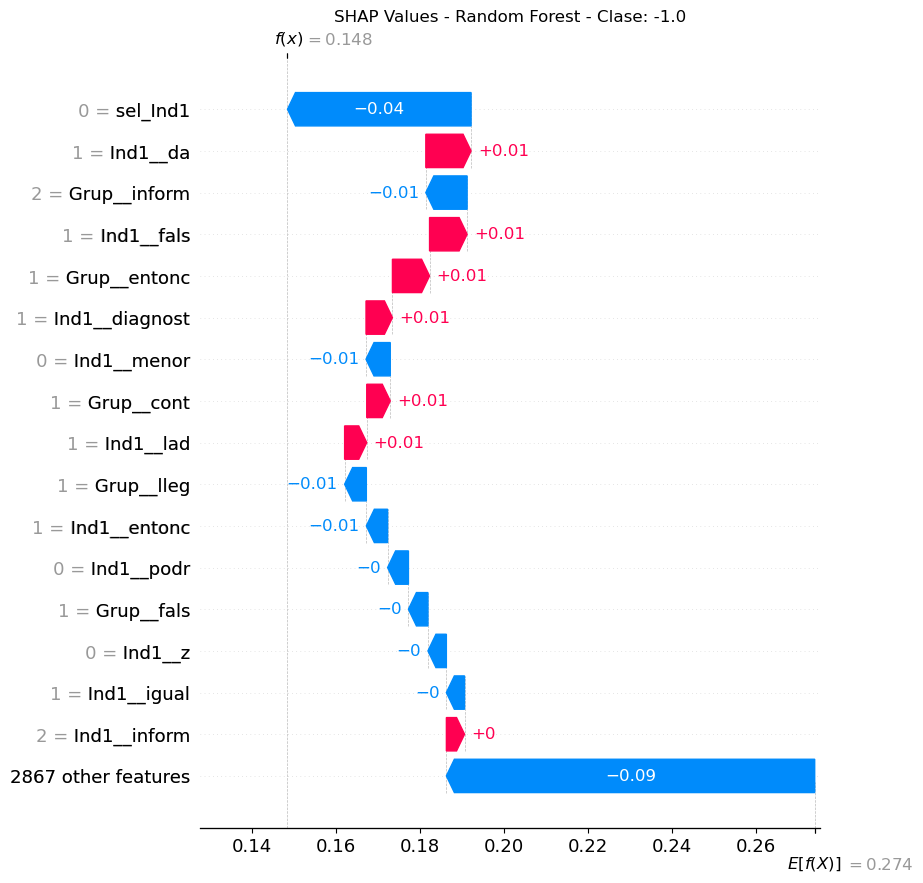

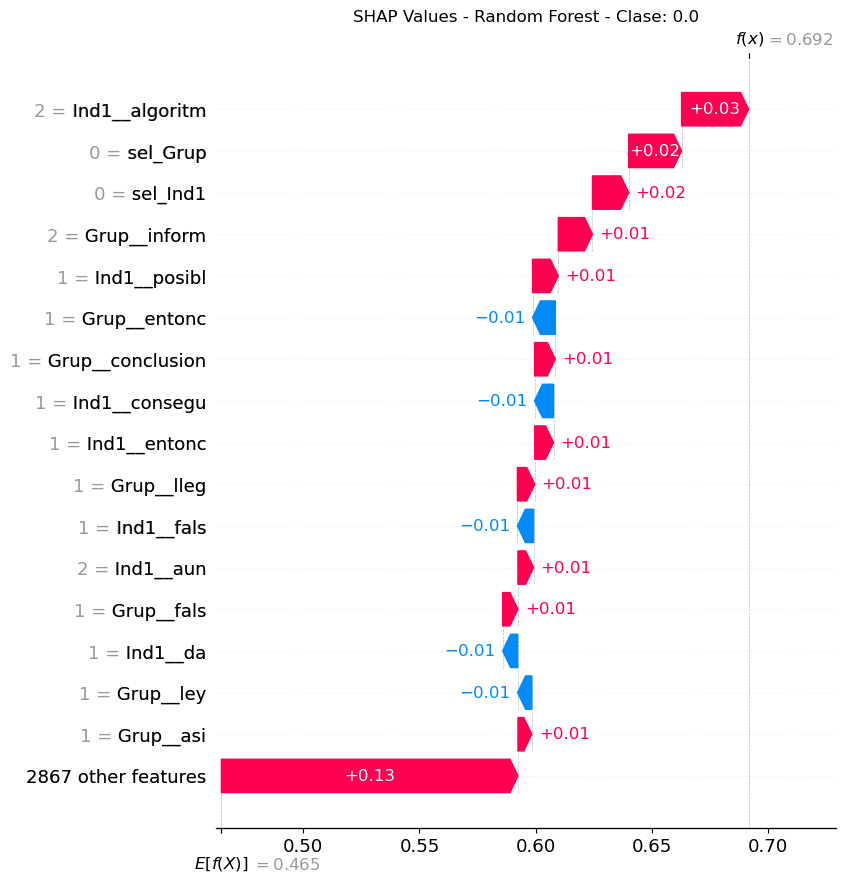

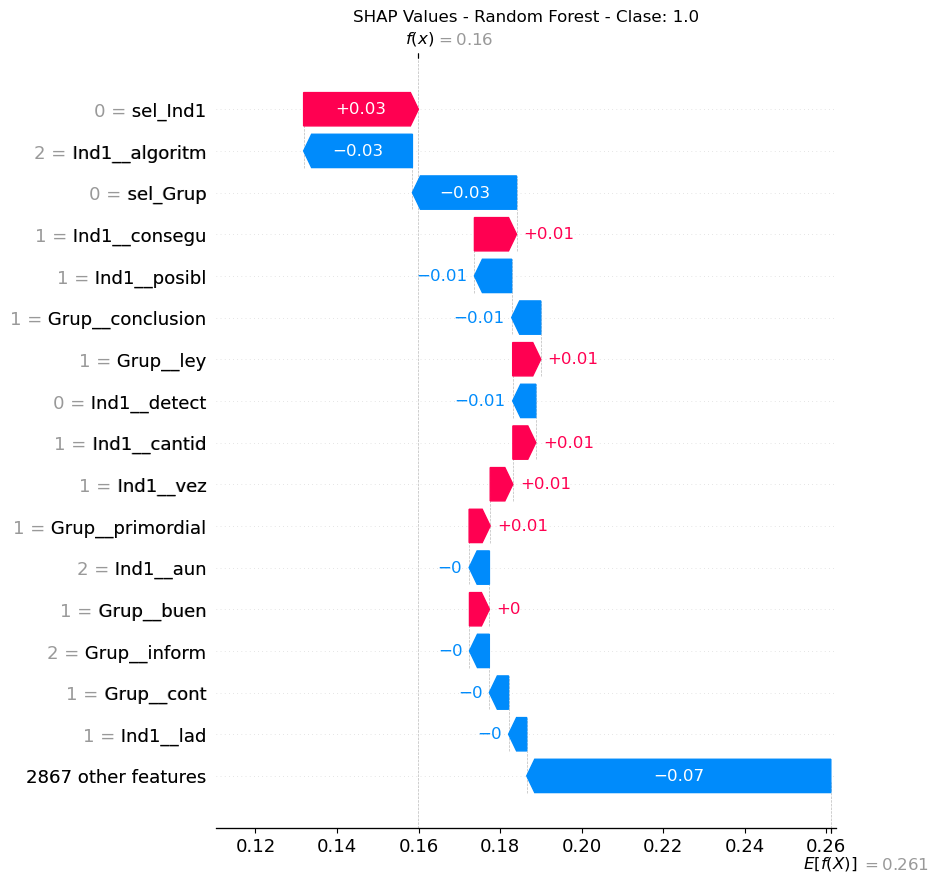

In [113]:
idx=1

individual_explanation(idx, rf_best_model, df_train, 'SHAP Values - Random Forest')

[20:09:05] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\c_api\c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


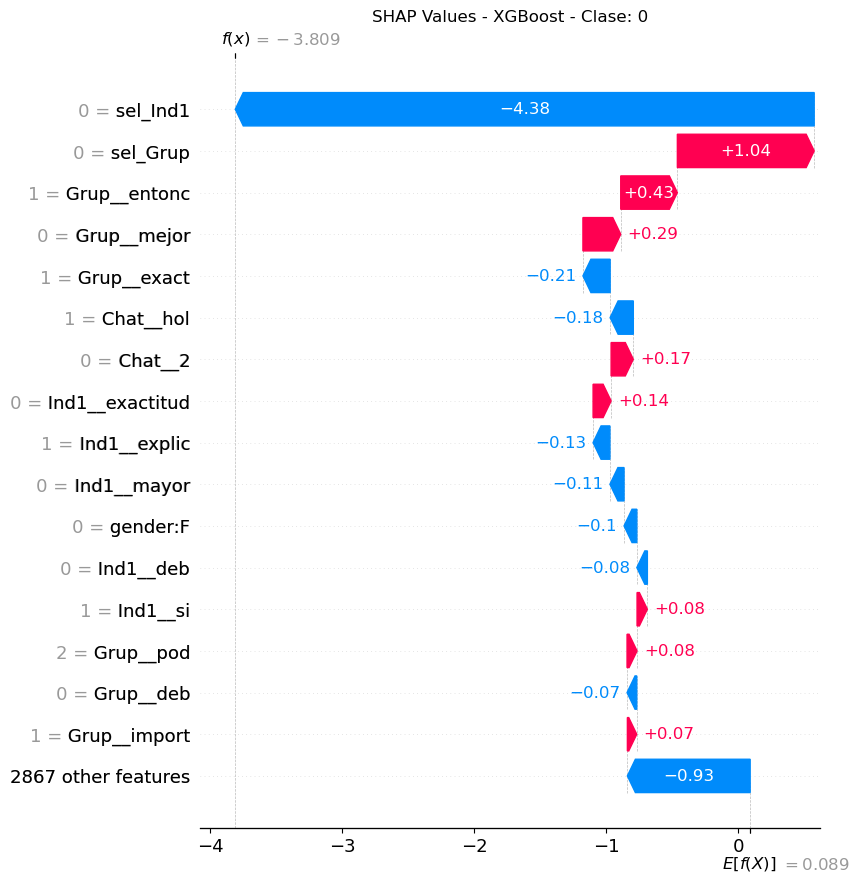

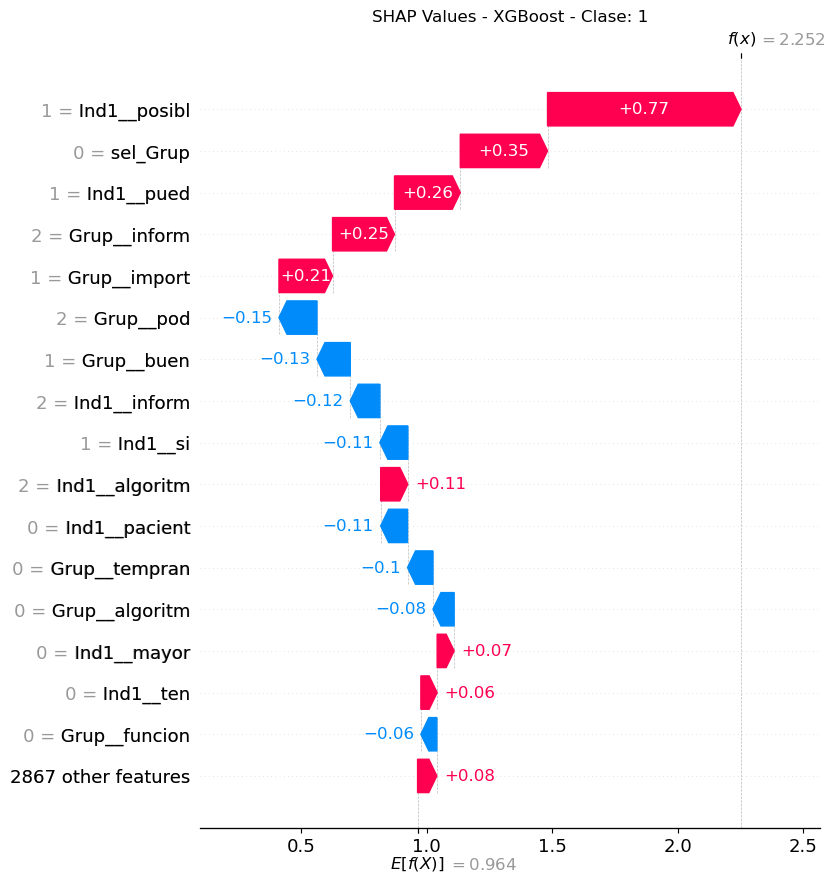

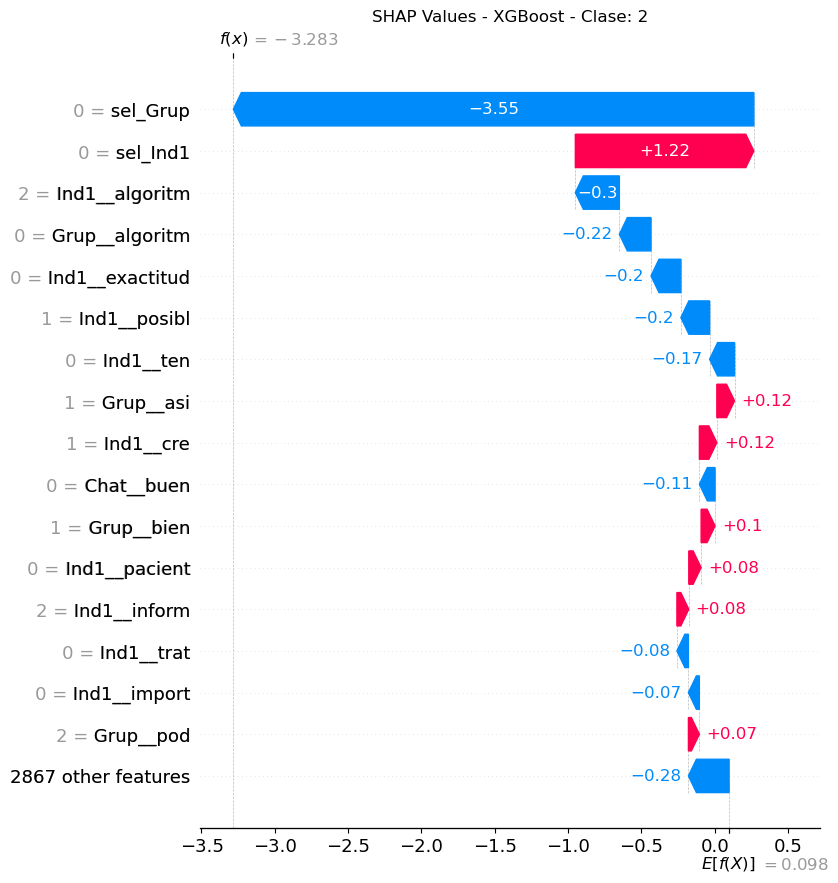

In [114]:
idx=1

individual_explanation(idx, xgb_best_model, df_train, 'SHAP Values - XGBoost')